---
# NOTEBOOK 5 - MODELING:
---

# PROJECT : Boston Airbnb Fair Pricing Tool and Recommender

# Notebook Overview:
* The fully-featured and preprocessed data from Notebook 4 are imported for modeling
* First the features are evaluated and selected based on how strongly they correlate to the price and log price
* Then feature sets are created with different numbers of the most highly correlated features to price and/or log price
* Each of these feature sets create new dataset which are all used to train each of seven different models
* The best model is then optimized via hyperparameter tuning
* The effect of outliers on model performance is examined
* Dimensionality reduction techniques are attempted to create a better model
* Discussion, Conclusions, and Next Steps are reported

# NOTE REGARDING NOTEBOOK LENGTH:
Almost all sections of this notebook are contingent upon the presence of the previous section. This makes it very difficult to break this notebook up into a few shorter ones.  Much of the length of this notebook however is due to the massive number of plots which are created covering all of the different model and feature set combinations that were explored.

In a subsequent phase or iteration, this notebook will be broken down into smaller notebooks.

# Modeling Evaluation Metrics
The root mean squared error is the primary model evaluation metric as it would be expressed in the same units as the target variable, price.  This is a very tangible measure of how variable a model is simply because it outputs dollar amounts.

The R-squared value will act as a secondary metric to quickly evaluate the quality of the model itself and how much better (if at all, it is compared to the null model).

# 1 - Library Imports and Read-in Data

In [2]:
# Basic Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For tesxt:
import re

# For times:
import time

# Set a random seed for imputation
#  Source:  https://numpy.org/doc/stable/reference/random/generated/numpy.random.seed.html
np.random.seed(42)

# Sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error

# For PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
lstn = pd.read_csv('../data/prepped_training.csv')

In [4]:
lstn.shape

(2781, 12582)

In [5]:
validation = pd.read_csv('../data/prepped_validation.csv')

# 1 - General Overview

# 2 - Feature Selection with Correlation Coefficients

## 2.1 - Correlations Between All Features and Price/Log Price
The correlation coefficients between each of the features and both the price and log price will be calculated.  This is part of a quantitative feature selection process where only the most highly-correlated values will be selected to go in the model.  Correlation magnitudes (importances) will be calculated such that the features can be sorted by their importance.

Correlations are deemed 'strong', 'moderate', etc. based on the this souce:  [The Correlation Coefficient (r)](https://sphweb.bumc.bu.edu/otlt/MPH-Modules/PH717-QuantCore/PH717-Module9-Correlation-Regression/PH717-Module9-Correlation-Regression4.html)

In [6]:
# The code below will aggregate the correlation coefficients between all columns which are not
#  price and log_price vs. price and log price

# This code using dictionaries was written with the help of the following sourece:
#  https://www.guru99.com/python-dictionary-append.html
corr_dict = {'name': [], 
             'price_corr':[], 
             'log_price_corr': [],
             'price_mag': [],
             'log_price_mag': [],
             'magnitude': [], 
             'which': []}

# Get a list of all the columns to iterate through, remvoe price and log_price
col_list = list(lstn.columns)
col_list.remove('price')
col_list.remove('log_price')

# This loop creates data for each column
for col in col_list:
    
    # Find correlations to price and log_price
    p_corr = np.corrcoef(lstn[col], lstn['price'])[0][1]
    lp_corr = np.corrcoef(lstn[col], lstn['log_price'])[0][1]
    
    # NEW CODE
    price_mag = abs(p_corr)
    log_price_mag = abs(lp_corr)
    
    
    
    # Report the higher magnitude value of both price and log price
    mag = max(abs(p_corr), abs(lp_corr))
    
    # Append the above data to the dictionary
    corr_dict['name'].append(col)
    corr_dict['price_corr'].append(p_corr)
    corr_dict['log_price_corr'].append(lp_corr)
    
    # NEW CODE
    corr_dict['price_mag'].append(price_mag)
    corr_dict['log_price_mag'].append(log_price_mag)
    
    # BACK TO NORMAL
    corr_dict['magnitude'].append(mag)
    
    # The if statement below will print which correaltion is stronger
    if abs(p_corr) > abs(lp_corr):
        corr_dict['which'].append('price')
    
    else:
        corr_dict['which'].append('log_price')

# Create a dataframe from the dictionary
corr_df = pd.DataFrame(corr_dict)

# Set the index to be the column names collected as there is no need for a numerical index
corr_df.set_index('name', inplace=True)
corr_df.head()

,price_corr,log_price_corr,price_mag,log_price_mag,magnitude,which
name,,,,,,
host_since,0.039550,0.027396,0.039550,0.027396,0.039550,price
host_response_rate,-0.003495,0.041759,0.003495,0.041759,0.041759,log_price
host_acceptance_rate,0.130797,0.271477,0.130797,0.271477,0.271477,log_price
host_listings_count,0.016601,0.136672,0.016601,0.136672,0.136672,log_price
host_total_listings_count,-0.011012,0.082024,0.011012,0.082024,0.082024,log_price


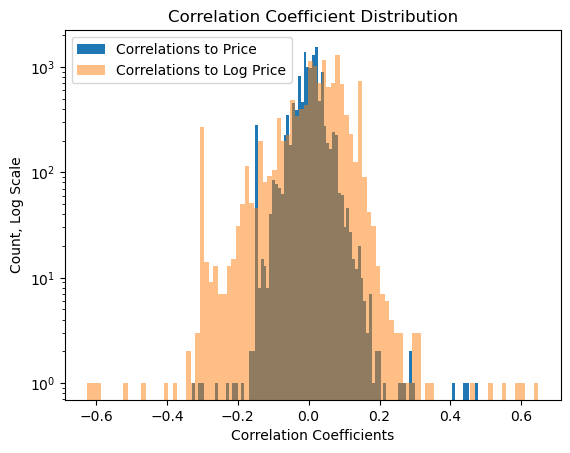

In [7]:
# Plot an overlapping histogram of the correlation distributions
plt.hist(corr_df.price_corr, bins = 100, label = 'Correlations to Price')
plt.hist(corr_df.log_price_corr, bins = 100, alpha = 0.5, label = 'Correlations to Log Price')
plt.title('Correlation Coefficient Distribution')
plt.xlabel('Correlation Coefficients')
plt.ylabel('Count, Log Scale')
plt.yscale('log')
plt.legend()
plt.savefig('../images/corr_coef_dist.png')
plt.show();

#### OBSERVATIONS:
* Generally speaking, correlation to log price are higher than to just the price
* The vast majority of features only barely even qualify as moderately correlated to price

## 2.2 - Define Feature Selection/Visualization Functions

In [8]:
'''
This function will:
* Create a list (A.K.A. "feature set") of the top n number of highly correlated features
* Optionally check ommit features which are highly correlated (per some set limit) to
features already in the feature set
'''

def top_features(num_ft, check_mc, corr_lim, sort_by = 'magnitude'):

    # Create a dataframe sorted by the correlation magnitude
    # Sort by correa
    if sort_by == 'price_mag':
        corr_df_sorted = corr_df.sort_values(by = 'price_mag', ascending=False)
        
    elif sort_by == 'log_price_mag':
        corr_df_sorted = corr_df.sort_values(by = 'log_price_mag', ascending=False)
        
    else:
        corr_df_sorted = corr_df.sort_values(by = 'magnitude', ascending=False)
    

    # Create an empty list to store the column names
    feature_set = []

    # Create an index to loop through
    bc_index = 0

    # Write a while loop to get the top 30 most highly correlated columns which are
    #  not already duplicated in the list with either their log or non-log counterparts
    while len(feature_set) < num_ft:

        # simplify the name of the individual column names pulled out of the df index
        next_column = corr_df_sorted.index[bc_index]

        # If the log version not is already there, and if the non-log version of the colunm
        #  name are not already there, then add the column name
        if f'log_{next_column}' not in feature_set and next_column.replace('log_', '') not in feature_set:
            
            # Create an if statement to skip the multi-colinearity check when adding the very-first feature
            #  Ensure that check_mc is set to True, otherwise, skip this step
            if bc_index > 0 and check_mc == True:
                
                # Create an empty list to contain the correlation coefficients
                corrcoefs = []
                
                # Loop throug and calculate the correlation coefficients of the new feature
                #  versus all currently in the feature list
                for col_no_mc in feature_set:
                    
                    # Find the correlation coefficient
                    corr_mc = np.corrcoef(lstn[next_column], lstn[col_no_mc])[0][1]
                    
                    # Add it to the corrcoefs list
                    corrcoefs.append(abs(corr_mc))

                # Set a multi-collinearity correlation coefficient limit and only accept features
                #  with correlation coefficients less than this value
                if max(corrcoefs) < corr_lim:
                    feature_set.append(next_column)
                    
            # If it is 0, then just add the first feature
            else:
                feature_set.append(next_column)

        # Increase the index value by 1
        bc_index += 1

    # Return the list of correlation coefficients
    return feature_set

In [9]:
'''
This function will take a provided column list and plot the correlation matrix.
It will also add the price and log price so that correlations between those target
variables and the features can be seen for reference.
'''

def plot_corr_matrix(col_list, fig_size):
    # Make a dataframe with just the desred columns
    corr_mat_df = lstn[col_list]
    
    # Add the price and log price data
    corr_mat_df['price'] = lstn['price']
    corr_mat_df['log_price'] = lstn['log_price']
    
    # Plot a correlation matrix
    #  From Lesson 1.07 - # This code is taken with minor modifications from https://seaborn.pydata.org/generated/seaborn.heatmap.html
    mask = np.zeros_like(corr_mat_df.corr())
    mask[np.triu_indices_from(mask)] = True
    
    plt.figure(figsize = fig_size)
    sns.heatmap(corr_mat_df.corr(), 
                annot = True, 
                fmt='.1f', # Source for "fmt='.2f'":  https://stackoverflow.com/questions/54506626/how-to-understand-seaborns-heatmap-annotation-format
                cmap = 'coolwarm', 
                mask = mask)

## 2.3 - Check Top 30 Features Prior to Eliminating Multicollinearity
This step is performed simply to understand what effects removing multicollinear features may have on the feature sets.

In [10]:
# Using the defined function, check the collinearity between the top 30 features

# To keep colinear features, set the corr_lim to 1
correlation_limit = 1
top_30_ft = top_features(30, check_mc=False, corr_lim = correlation_limit)

C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['price'] = lstn['price']
C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['log_price'] = lstn['log_price']


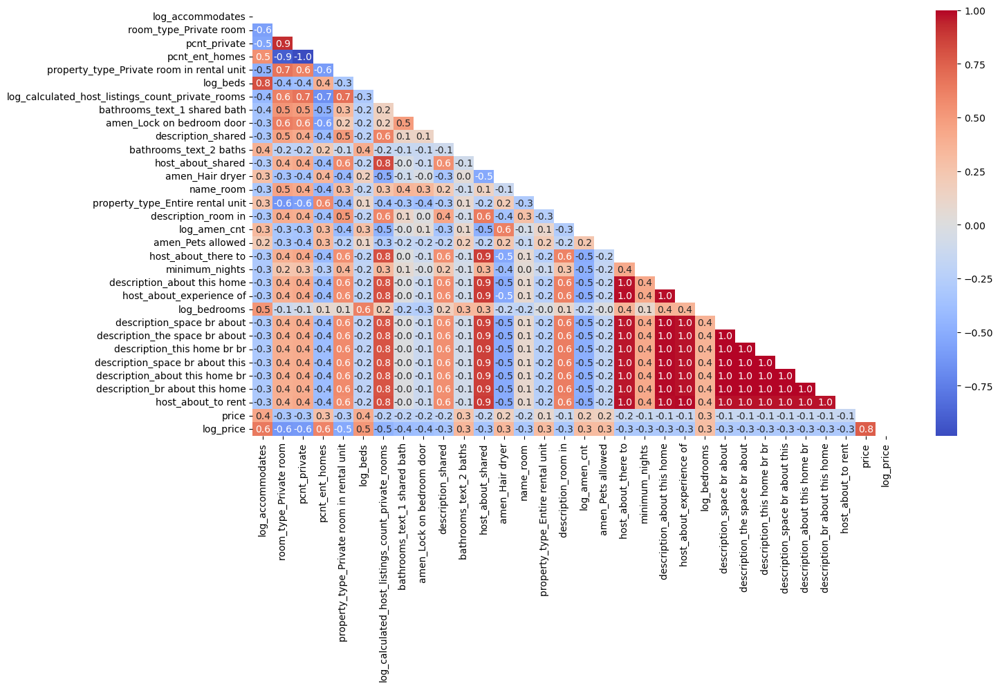

In [11]:
plot_corr_matrix(top_30_ft, (15,8))

#### OBSERVATIONS:
Many of the host variables are almost perfectly correlated with one-another.  They should be removed as they would not add any additional fidelity to the eventual models. 

## 2.4 - Filter Out Collinear Features and Refine Multicollinearity Correaltion Limit 

### 2.4.1 - Remove Features Correlated to Each Other with Correlation Coefficients (A.K.A Multicollinearity Limit) Above 0.7

In [12]:
# Find the top 30 most higlhy correlated features where there is no multicollinearity.

# Start with a correlation coefficient limit of 0.7
correlation_limit = 0.7

top_30_ft_no_mc = top_features(30, check_mc=True, corr_lim = correlation_limit)

C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['price'] = lstn['price']
C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['log_price'] = lstn['log_price']


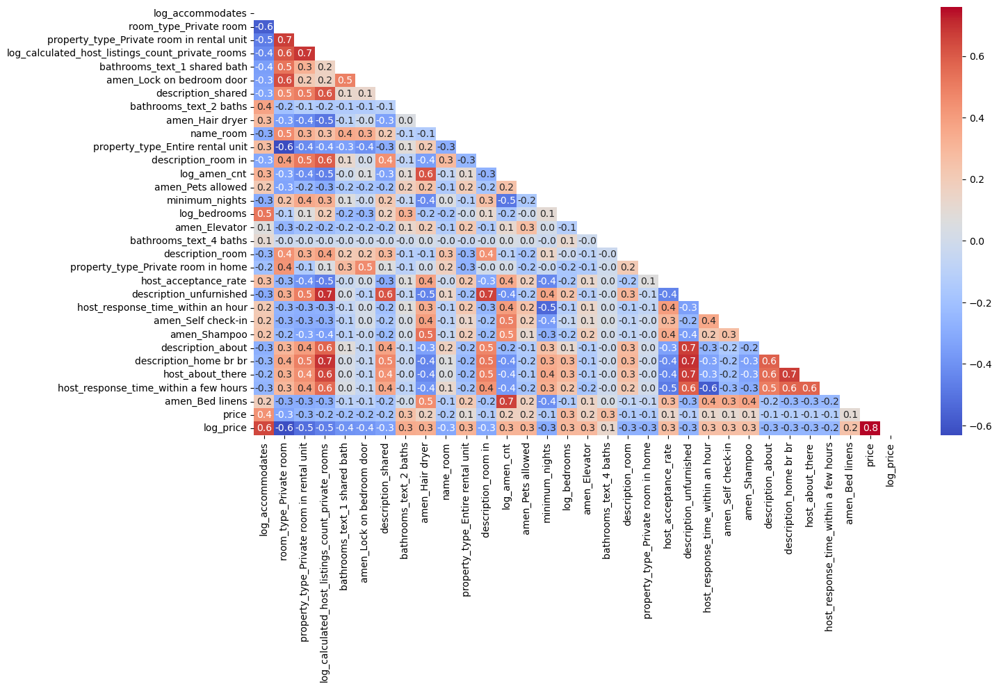

In [13]:
plot_corr_matrix(top_30_ft_no_mc, (15,8))

### 2.4.2 - Refine the Multicollinearity Limit
The rationale here is that at a correlation coefficient of 0.7, some features are still more highly correlated with each other than to the target variables.

In [14]:
# Find the top 30 most higlhy correlated features where there is no multicollinearity.

# Start with a correlation coefficient limit of 0.7
correlation_limit = 0.5

top_30_ft_no_mc = top_features(30, check_mc=True, corr_lim = correlation_limit)

C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['price'] = lstn['price']
C:\Users\Dan\AppData\Local\Temp\ipykernel_22780\198349494.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_mat_df['log_price'] = lstn['log_price']


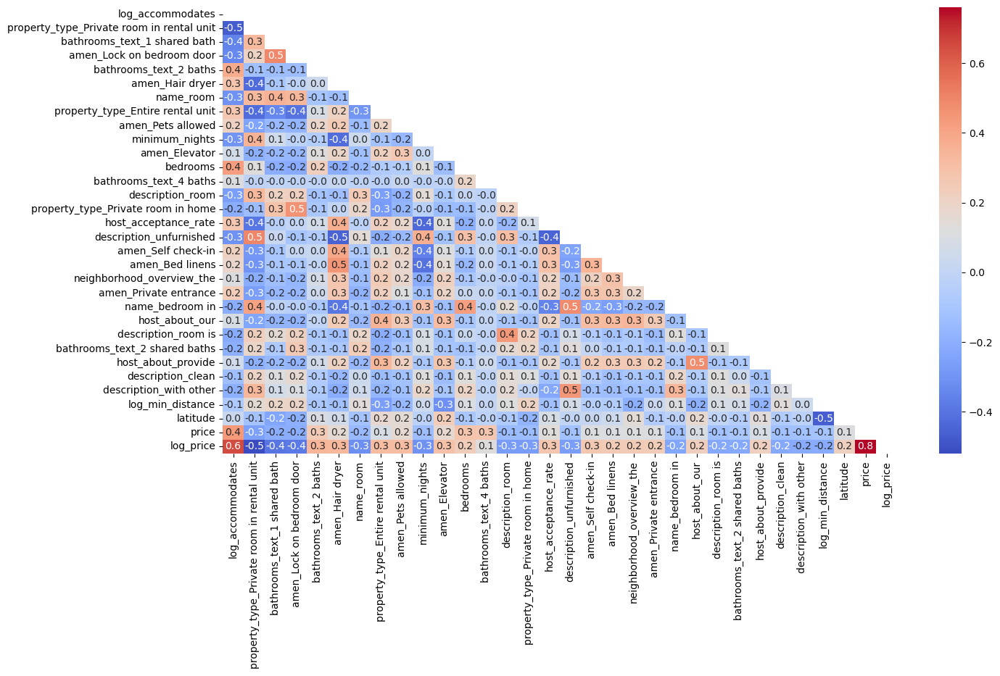

In [15]:
plot_corr_matrix(top_30_ft_no_mc, (15,8))

In [16]:
# View the 30 most highly correlated variables above in the correlation dataframe
corr_df.loc[top_30_ft_no_mc]

,price_corr,log_price_corr,price_mag,log_price_mag,magnitude,which
name,,,,,,
log_accommodates,0.437727,0.647343,0.437727,0.647343,0.647343,log_price
property_type_Private room in rental unit,-0.258554,-0.519602,0.258554,0.519602,0.519602,log_price
bathrooms_text_1 shared bath,-0.207068,-0.397327,0.207068,0.397327,0.397327,log_price
amen_Lock on bedroom door,-0.208319,-0.381361,0.208319,0.381361,0.381361,log_price
bathrooms_text_2 baths,0.254731,0.342915,0.254731,0.342915,0.342915,log_price
amen_Hair dryer,0.156992,0.335156,0.156992,0.335156,0.335156,log_price
name_room,-0.156941,-0.315639,0.156941,0.315639,0.315639,log_price
property_type_Entire rental unit,0.089294,0.315240,0.089294,0.315240,0.315240,log_price
amen_Pets allowed,0.162390,0.310873,0.162390,0.310873,0.310873,log_price


#### OBSERVATIONS:
* The new correlation limit has removed some of the more highly correlated variables, and hopefully introduces more diversity into the eventual models
* Some of the features above could be removed for having no practical meaning like 'neighborhood_overview_the' means that the word 'the' existing in the neighborhood overview of a listing is showing a more pronouced correlation.  Practically speaking, one of the most coomon words in the English language should not by-itself impact the price, but may more be an indication of whether or not a neighborhood overview has been provided for the listing
* The vast majority of the variables correlate most highly with log_price

### 2.4.3 - Create 'Feature Sets'
Lists of the top n number of the most highly-correlated features will be created and used to create (filter) dataframes for modeling in following sections.

In [17]:
# Create 5 different feature lists for the modeling phase

# Start with a correlation coefficient limit of 0.7
correlation_limit = 0.6

top_5_ft_no_mc = top_features(5, check_mc=True, corr_lim = correlation_limit)
top_10_ft_no_mc = top_features(10, check_mc=True, corr_lim = correlation_limit)
top_30_ft_no_mc = top_features(30, check_mc=True, corr_lim = correlation_limit)
top_50_ft_no_mc = top_features(50, check_mc=True, corr_lim = correlation_limit)
top_100_ft_no_mc = top_features(100, check_mc=True, corr_lim = correlation_limit)

# 3 - Create the Null Model
The null model is necessary as a standard benchmark for model performance.  It is simply the average of Airbnb listing prices.  In order for a model to be considered good, it would need to vastly outpace the performance of this model by achieving a much smaller RMSE value.

## 3.1 - Null Model on Full Datasets

In [18]:
# Find the average price of the data, and extarpolate an array equal to the length of the datasets
mean_train = lstn.price.mean()
round(mean_train, 2)

188.39

In [19]:
# Create training and validation arrays for the null model to determine the RMSE
# Help finding.np.full function from:  https://www.codespeedy.com/create-initialize-an-array-with-same-values-in-python/
y_train_null = np.full((lstn.shape[0], ), mean_train)

y_val_null = np.full((validation.shape[0], ), mean_train)

In [20]:
# Calculate the RMSE of the null model for both training and validation sets
RMSE_null_train = round(mean_squared_error(lstn.price, y_train_null, squared=False), 2)
RMSE_null_val = round(mean_squared_error(validation.price, y_val_null, squared=False), 2)

print(f'The null model RMSE on the training data is: ${RMSE_null_train}')
print(f'The null model RMSE on the validation data is: ${RMSE_null_val}')

The null model RMSE on the training data is: $208.33
The null model RMSE on the validation data is: $407.3


##  3.2 - Null Model with Outliers Removed

In [21]:
# Given the distribution of AirBnB prices, it may be useful to see how the
# RMSE values might change if the outliers (very expensive listings) are
# omitted from the data used to model.

# Define a price cap
price_cap = 1000

# Create capped datasets
lstn_capped = lstn[lstn['price'] < price_cap]
val_capped = validation[validation['price'] < price_cap]

y_train_null_capped = np.full((lstn_capped.shape[0], ), mean_train)
y_val_null_capped = np.full((val_capped.shape[0], ), mean_train)

# Calculate the RMSE of the null model for both training and validation sets
RMSE_null_train_capped = round(mean_squared_error(lstn_capped.price, y_train_null_capped, squared=False), 2)
RMSE_null_val_capped = round(mean_squared_error(val_capped.price, y_val_null_capped, squared=False), 2)

print(f'The null model RMSE on the training data (capped to below ${price_cap}) is: ${RMSE_null_train_capped}')
print(f'The null model RMSE on the validation data (capped to below ${price_cap}) is: ${RMSE_null_val_capped}')

The null model RMSE on the training data (capped to below $1000) is: $136.53
The null model RMSE on the validation data (capped to below $1000) is: $142.35


# 4 - Build a Basic Linear Regression Model
This is a useful step to ensure that the data are properly formatted for modeling and that no issues arise prior to automating the modeling process.

In [22]:
# Create the training and validation datasets for use in the initial LR model
X_train, y_train = lstn[top_5_ft_no_mc], lstn['log_price']
X_val, y_val = validation[top_5_ft_no_mc], validation['log_price']

In [23]:
# Instanitate the LR model
lr = LinearRegression()

# Fit the model
lr.fit(X_train, y_train)

# BEFORE INVERTING THE LOG TRANSFORMATION (expontiating), provide R2 scores on the training and validation data
lr.score(X_train, y_train), lr.score(X_val, y_val)

(0.5321625635632565, 0.51834021143497)

In [24]:
# Calcualte the R2 scores on training and validation data after expoentiating to see the price:
r2_score(lstn['price'], np.exp(lr.predict(X_train))), r2_score(validation['price'], np.exp(lr.predict(X_val)))

(0.20344610215142422, 0.03369276049559955)

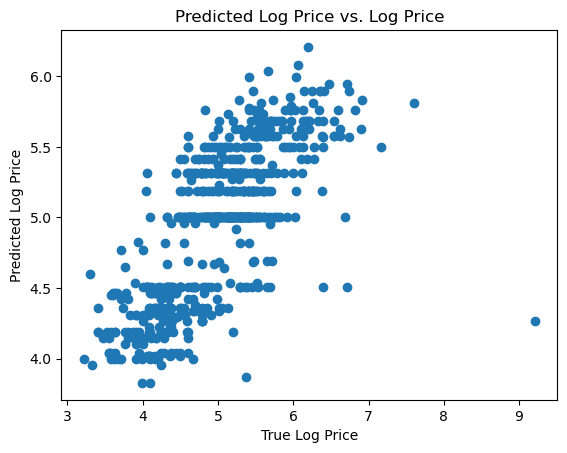

In [25]:
# View a simple scatter plot of the data (in the log domain)
plt.scatter(validation['log_price'], (lr.predict(X_val)))
plt.title('Predicted Log Price vs. Log Price')
plt.xlabel('True Log Price')
plt.ylabel('Predicted Log Price')
plt.show();

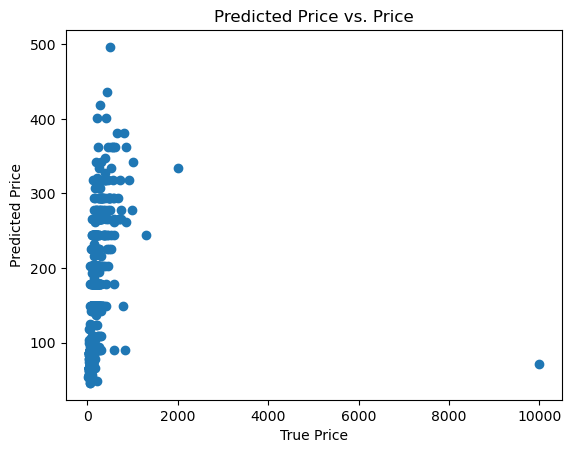

In [26]:
# View the same data but after exponentiating back to price
plt.scatter(validation['price'], (np.exp(lr.predict(X_val))))
plt.title('Predicted Price vs. Price')
plt.xlabel('True Price')
plt.ylabel('Predicted Price')
plt.show();


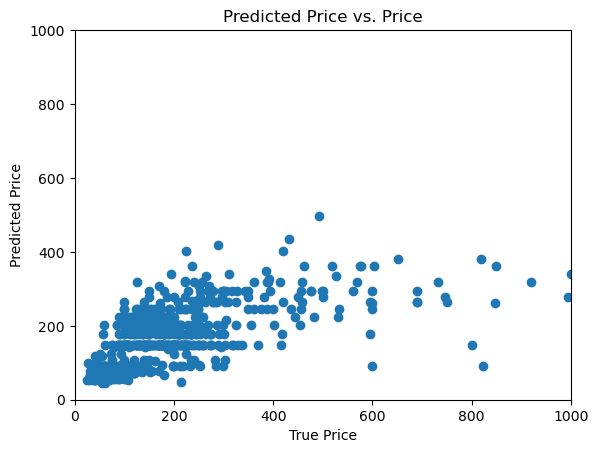

In [27]:
# Filter some of the outliers out-of-view to see how the rest of the data look
plt.scatter(validation['price'], (np.exp(lr.predict(X_val))))
plt.title('Predicted Price vs. Price')
plt.xlabel('True Price')
plt.ylabel('Predicted Price')
plt.ylim(0, 1000)
plt.xlim(0, 1000)
plt.show();

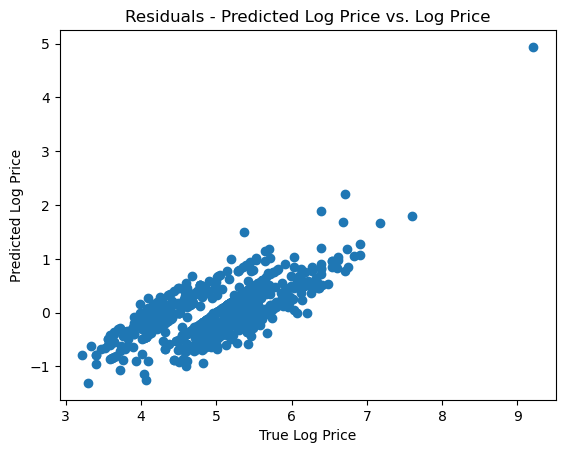

In [28]:
# Filter some of the outliers out-of-view to see how the rest of the data look
plt.scatter(validation['log_price'], (validation['log_price'] - (lr.predict(X_val))))
plt.title('Residuals - Predicted Log Price vs. Log Price')
plt.xlabel('True Log Price')
plt.ylabel('Predicted Log Price')
# plt.ylim(0, 1000)
# plt.xlim(0, 1000)
plt.show();

#### OBSERVATIONS:
* Outliers are severely affecting the data, rendering a simple linear regression model almost useless
* When zooming in on the data, more linearity can be observed, but the data are still very scattered

## 4.1 - LINEM Assumptions
* Linearity:  It was shown in the first notebook that there are no correlations that would normally be considered 'strong' though a few are close.  Otherwise, the relationships between the features and the listing price (and even log_price) are not terribly linear
* Independence:  Generally speaking, hosts will set a listing price based on their won circumstances.  However, there may be a violation here as the prices set by the broader market (other observations) may influence the price that a host sets for a listing.  While they are not directly related there is some influence between observations
* Normality:  It was shown in notebook 1 that the vast majority of features and price are not normally distributed and appear to have more exponential (or bi/multi-modal) distributions.  Some of these affects were mitigated by log transforming data, which in the case of price, served to increase normality
* Equal Variances:  In the plot above of residuals in the log domain, the variances are NOT approximately equal and there are still stends that have not been modeled.  Granted, this is a low-feature model, however, this will likely not change for the models to come
* Multicollinearity:  Care was taken to remove collinear features previously based on a certain correlation threshold.  However, it's not terribly clear where that threshold should be set.


## 4.2 - Interpretability
Firstly, as this model is a prediction model and not an inferential model, interpretability is of low importance, but should be mentioned.  Many of the features themselves have been log tranformed, making the interpretation of their coefficients more difficult.  With the taget for the model above being log price, this further complicates the interpretation.  Nonetheless, this will be attemtped below.

In [29]:
# Get the coefficients (weights) for the 5 columns
#  Exponentiate to get the relationship to price
np.exp(lr.coef_) - 1

array([ 0.57203746, -0.39074362, -0.13888953, -0.04177127,  0.3042271 ])

In [30]:
# Print the 5 columsn for reference
X_train.columns

Index(['log_accommodates', 'room_type_Private room',
       'bathrooms_text_1 shared bath', 'description_shared',
       'bathrooms_text_2 baths'],
      dtype='object')

#### Interpretations:
* Holding all else constant, for each one unit increase the in the logarithm of the number of people accommodated by a listing (or for every e number of people), the price will increase by 57%
* Holding all else constant, private rooms will decrease the price by 39%
* Holding all else constant, having 1 shared bath will decrease the price by about 14%
* Holding all else constant, having the word 'shared' in the description will decrease the price by 4%
* Holding all else constant, having 2 baths will increase the price by 30%


Given how poorly th emodel is performing, these numbers cannot be delivered with very high confidence.  Rather, they are here to show the difficulties regarding interpretability for this model.

Later ensemble models will have no interpretability at all, but may offer better prediction performance.

# 5 - Automate Modeling Process
The function below is designed to take in the different feature sets, create whole training and validation dataframes, train/evaluate a list of models on those dataframes.  True versus predicted plots will be created in addition to dataframes will R2 and RMSE performance metrics.

In [31]:
'''
Create a function that will create training and validation datasets based on a list of
input columns against price and log_price data.  Do this only for the X data, y will 
always be the same.
'''

def data_X_maker(data_train, data_val, col_list, col_list_name):
    globals()[f'X_train_{col_list_name}']  = data_train[col_list]
    #print(f'X_train_{col_list_name}')
    
    globals()[f'X_val_{col_list_name}'] = data_val[col_list]
    #print(f'X_val_{col_list_name}')
    
    # Create common y datasets:
    globals()[f'y_train_{col_list_name}'] = data_train['price']
    #print(f'y_train_{col_list_name}')
    
    globals()[f'y_val_{col_list_name}'] = data_val['price']
    #print(f'y_val_{col_list_name}')
    
    globals()[f'y_train_log_{col_list_name}'] = data_train['log_price']
    #print(f'y_train_log_{col_list_name}')
    
    globals()[f'y_val_log_{col_list_name}'] = data_val['log_price']
    #print(f'y_val_log_{col_list_name}')
    
    globals()[f'data_list_{col_list_name}'] = [
        globals()[f'X_train_{col_list_name}'],
        globals()[f'X_val_{col_list_name}'],
        globals()[f'y_train_{col_list_name}'],
        globals()[f'y_val_{col_list_name}'],
        globals()[f'y_train_log_{col_list_name}'],
        globals()[f'y_val_log_{col_list_name}']
    ]
    print(f'data_list_{col_list_name}')
    
    return globals()[f'data_list_{col_list_name}']


'''
Create another function that will:
* Take in datasets that were previously created
* Fit a variety of models to them, training on both price and log price
* Produce plots of true versus predicted values for both price and log price for the training and validation data
'''
def model_maker(data_list, col_list_name, mod_list, plot_display = True):
    
    # Import data from a data list grabbing each component by index
    # X Data
    X_train_df = data_list[0]
    X_val_df = data_list[1]
    
    print(f'{X_train_df.shape}')
    
    # y datasets:
    y_train = data_list[2]
    y_val = data_list[3]
    
    y_train_log = data_list[4]
    y_val_log = data_list[5]

    # This is to change colors for each model so they're easier to identify
    color_code = 0
    
    # This is a dictionary which will house all metrics comupted in this loop
    modeling_dictionary = {'col_data': [], 
                 'model':[], 
                 'R2 training, price': [], 
                 'R2 training, log_price': [], 
                 'RMSE training, price': [],
                 'RMSE training, log_price': [],
                 'R2 validation, price': [],
                 'R2 validation, log_price': [],
                 'RMSE validation, price': [],
                 'RMSE validation, log_price': []                 
                }

    # Run the for loop to run all models in the input list on the data
    for model in mod_list:
        
        # **************  PRICE MODEL  ****************************************
        # Run Models on price
        model_inst = model
        model_inst.fit(X_train_df, y_train)
        
        # Predictions
        preds_price_train = model_inst.predict(X_train_df)
        preds_price_val = model_inst.predict(X_val_df)

        # Scores         
        r2_train_price = round(model_inst.score(X_train_df, y_train), 3)
        r2_val_price = round(r2_score(y_val, preds_price_val), 3)
        rmse_train_price = round(mean_squared_error(y_train, preds_price_train, squared = False), 3)
        rmse_val_price = round(mean_squared_error(y_val, preds_price_val, squared = False), 3)
        
        
        # ***************  LOG PRICE MODEL  ***************************************
        # Run models on log price
        model_inst_log = model
        model_inst_log.fit(X_train_df, y_train_log)
        
        # Predictions
        preds_log_price_train = np.exp(model_inst_log.predict(X_train_df))
        preds_log_price_val = np.exp(model_inst_log.predict(X_val_df))

        # Scores
        r2_train_log_price = round(r2_score(y_train, preds_log_price_train), 3)
        r2_val_log_price = round(r2_score(y_val, preds_log_price_val), 3)
        rmse_train_log_price = round(mean_squared_error(y_train, preds_log_price_train, squared = False), 3)
        rmse_val_log_price = round(mean_squared_error(y_val, preds_log_price_val, squared = False), 3)
        
        # Append values to dictionary:
        modeling_dictionary['col_data'].append(col_list_name)
        modeling_dictionary['model'].append(f'{model}'), 
        modeling_dictionary['R2 training, price'].append(r2_train_price) 
        modeling_dictionary['R2 training, log_price'].append(r2_train_log_price) 
        modeling_dictionary['RMSE training, price'].append(rmse_train_price)
        modeling_dictionary['RMSE training, log_price'].append(rmse_train_log_price)
        modeling_dictionary['R2 validation, price'].append(r2_val_price)
        modeling_dictionary['R2 validation, log_price'].append(r2_val_log_price)
        modeling_dictionary['RMSE validation, price'].append(rmse_val_price)
        modeling_dictionary['RMSE validation, log_price'].append(rmse_val_log_price)
        
        if plot_display == True:
            plt.figure(figsize = (10, 8))
            plt.subplots_adjust(hspace=0.7)

            plt.subplot(2, 2, 1)
            # Source for plotting model name on '(' below:  https://stackoverflow.com/questions/27387415/how-would-i-get-everything-before-a-in-a-string-python
            plt.title(f"Training Data\nColumns: {col_list_name}\nModel: {str(model).split('(')[0]}\nTrained on: 'price'\nR2: {r2_train_price} | RMSE: {rmse_train_price}")
            plt.scatter(y_train, preds_price_train, color = f'C{color_code}')
            plt.xlabel('True Prices')
            plt.ylabel('Predicted Prices')

            plt.subplot(2, 2, 2)
            plt.title(f"Training Data\nColumns: {col_list_name}\nModel: {str(model).split('(')[0]}\nTrained on: 'log_price'\nR2: {r2_train_log_price} | RMSE: {rmse_train_log_price}")
            plt.scatter(y_train, preds_log_price_train, color = f'C{color_code}')
            plt.xlabel('True Prices')
            plt.ylabel('Predicted Prices')

            plt.subplot(2, 2, 3)
            plt.title(f"Validation Data\nColumns: {col_list_name}\nModel: {str(model).split('(')[0]}\nTrained on: 'price'\nR2: {r2_val_price} | RMSE: {rmse_val_price}")
            plt.scatter(y_val, preds_price_val, color = f'C{color_code}')
            plt.xlabel('True Prices')        
            plt.ylabel('Predicted Prices')

            plt.subplot(2, 2, 4)
            plt.title(f"Validation Data\nColumns: {col_list_name}\nModel: {str(model).split('(')[0]}\nTrained on: 'log_price'\nR2: {r2_val_log_price} | RMSE: {rmse_val_log_price}")
            plt.scatter(y_val, preds_log_price_val, color = f'C{color_code}')
            plt.xlabel('True Prices')
            plt.ylabel('Predicted Prices')

            plt.show()
        
        # Up the color code for the next model
        color_code += 1
    
    # Store the metrics dataframe to a global variable for reference later
    globals()[f'eval_metrics_{col_list_name}'] = pd.DataFrame(modeling_dictionary)
    
    '''
    The follwoing formatting code was inspired by the following sources:
    * My project 3 - https://git.generalassemb.ly/drossetti/project-3/blob/main/code/4-Modeling-Round-2.ipynb
    * https://www.geeksforgeeks.org/highlight-the-maximum-value-in-each-column-in-pandas/
    * https://pandas.pydata.org/docs/reference/api/pandas.io.formats.style.Styler.highlight_max.html
    * Assking ChatGPT:  "i need an example of using the subset argument in a pandas dataframe formatted with style.highlight_max"
    * https://medium.com/gustavorsantos/how-to-highlight-max-min-or-nulls-with-pandas-f2df5bf4ccf9
    '''

    return globals()[f'eval_metrics_{col_list_name}']

# .style\
# .highlight_max(subset = ['R2 training, price', 'R2 training, log_price', 'R2 validation, price', 'R2 validation, log_price'], color = 'darkred')\
# .highlight_min(subset = ['RMSE training, price', 'RMSE training, log_price', 'RMSE validation, price', 'RMSE validation, log_price'], color = 'blue')

# 6 - Modeling: All Feature Sets
The five previously created feature sets will now be input into the above function.

Each will be used to train/evaluate seven regressor models, and each model will be trained/evaluted with price and log_price as the targets

In [32]:
# Make a list of models to run!
list_of_models = [LinearRegression(),
                  RandomForestRegressor(random_state=42), 
                  BaggingRegressor(random_state=42),
                  GradientBoostingRegressor(random_state=42),
                  ExtraTreesRegressor(random_state=42),
                  AdaBoostRegressor(random_state=42),
                  DecisionTreeRegressor(random_state=42)]

data_list_top_5_ft_no_mc
(2781, 5)


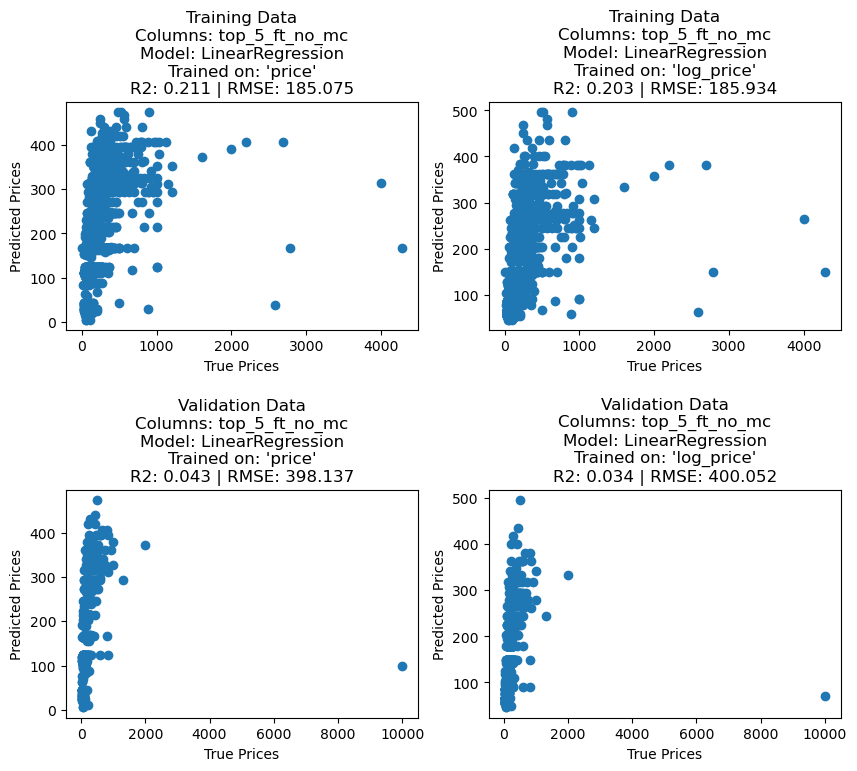

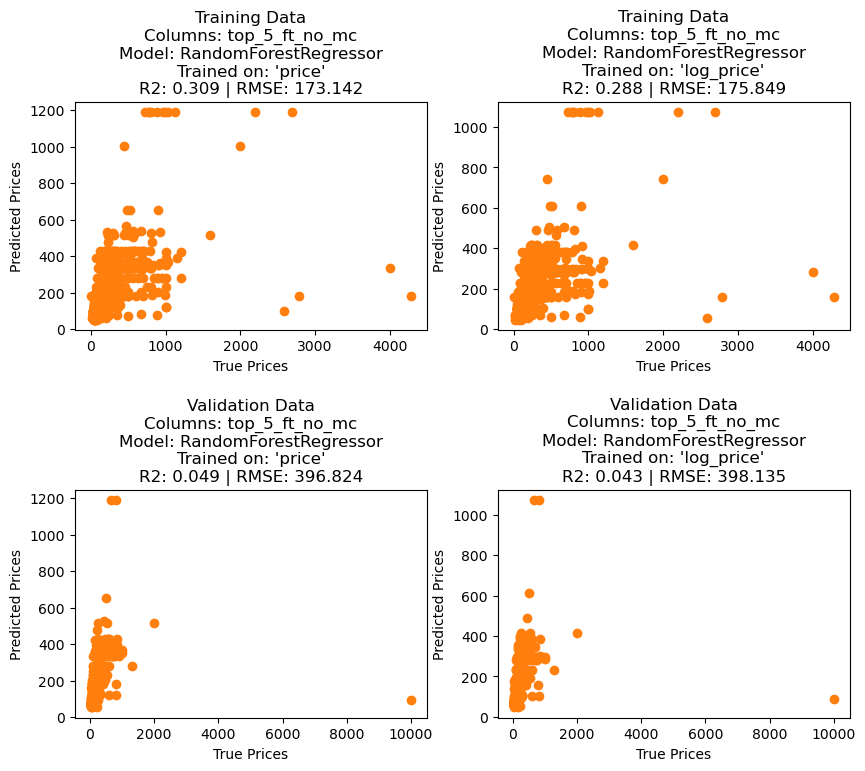

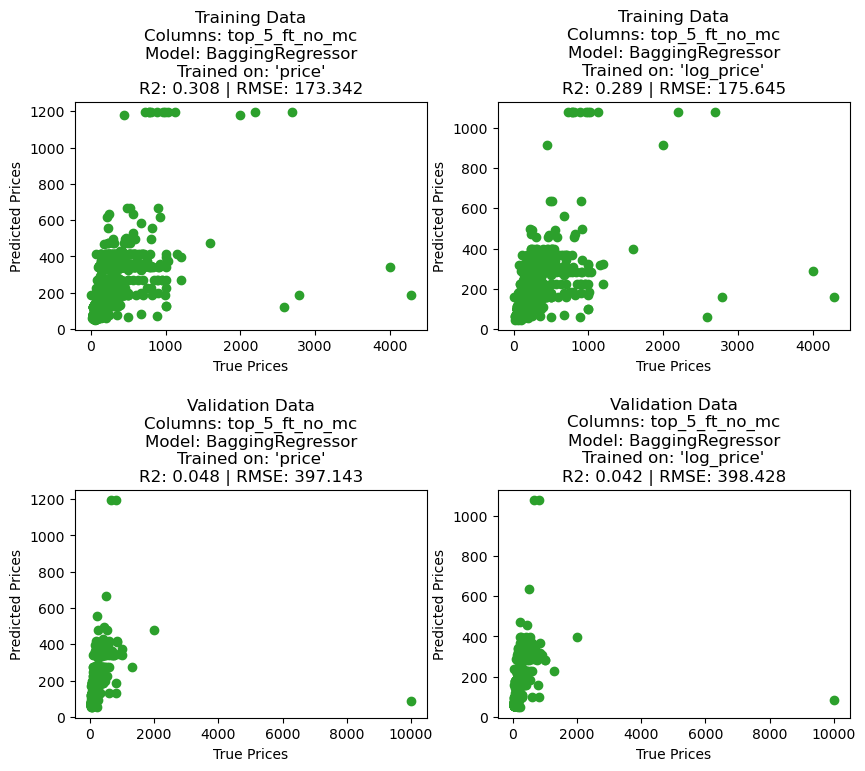

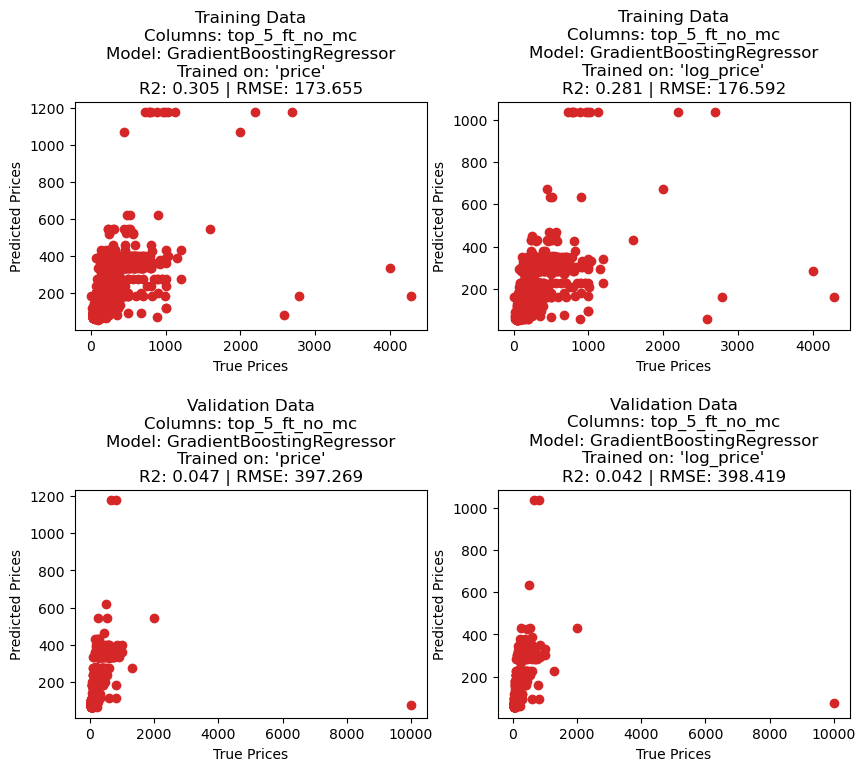

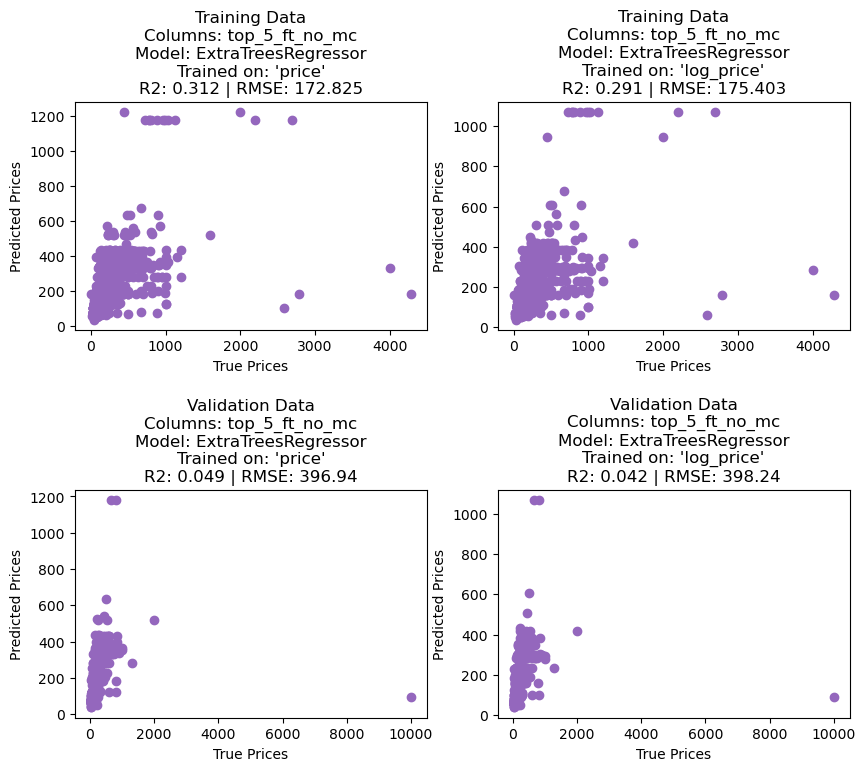

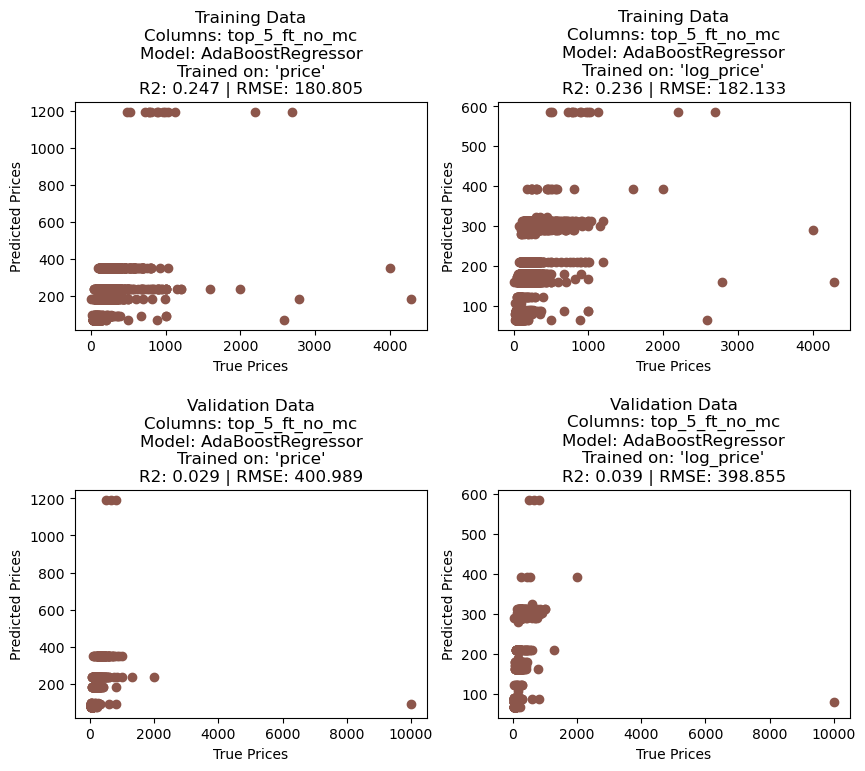

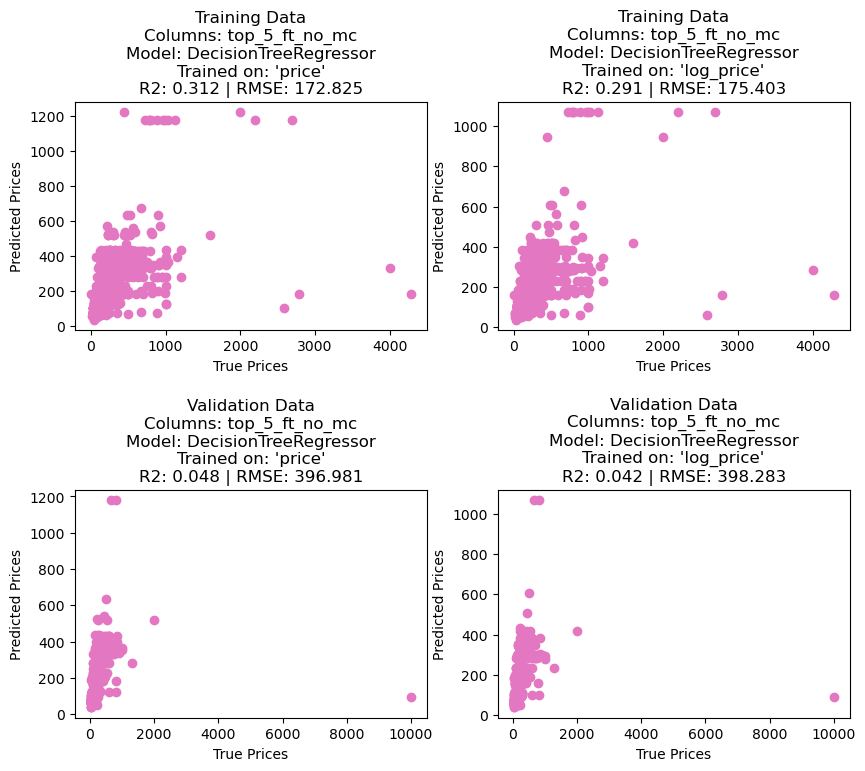

data_list_top_10_ft_no_mc
(2781, 10)


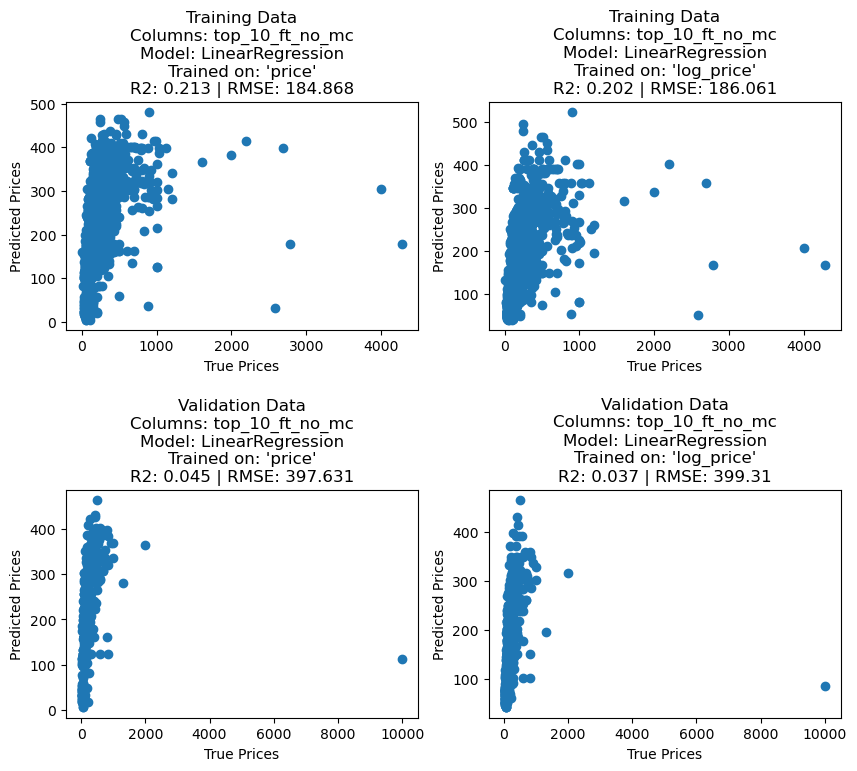

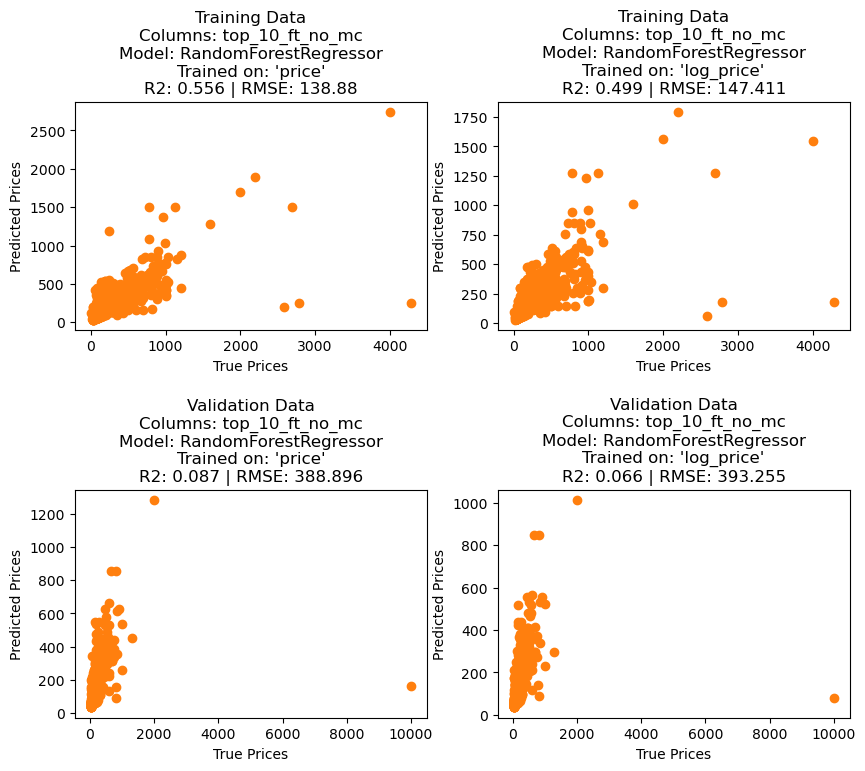

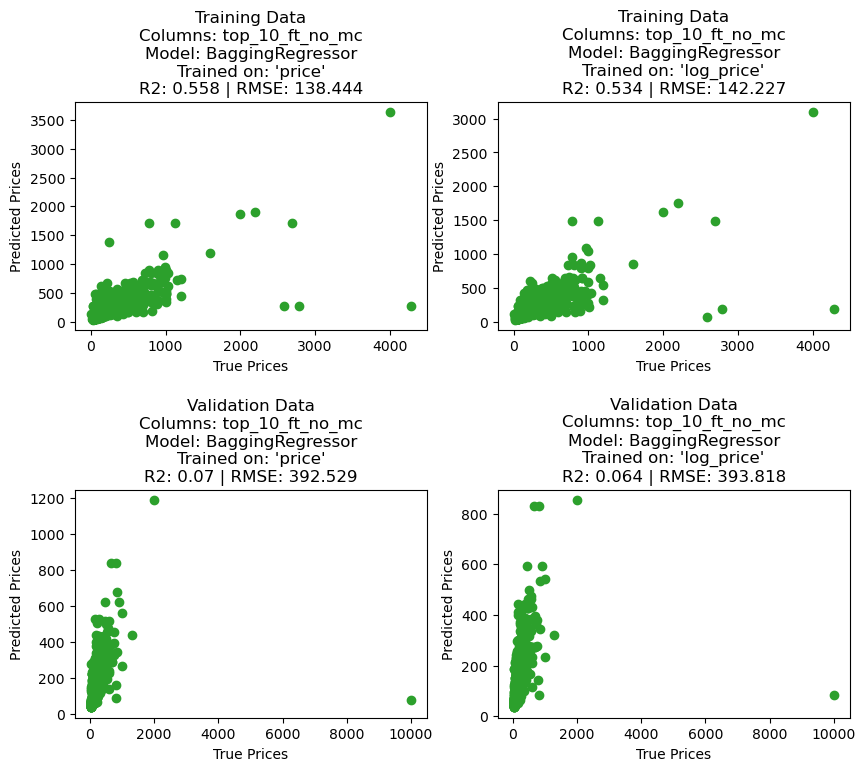

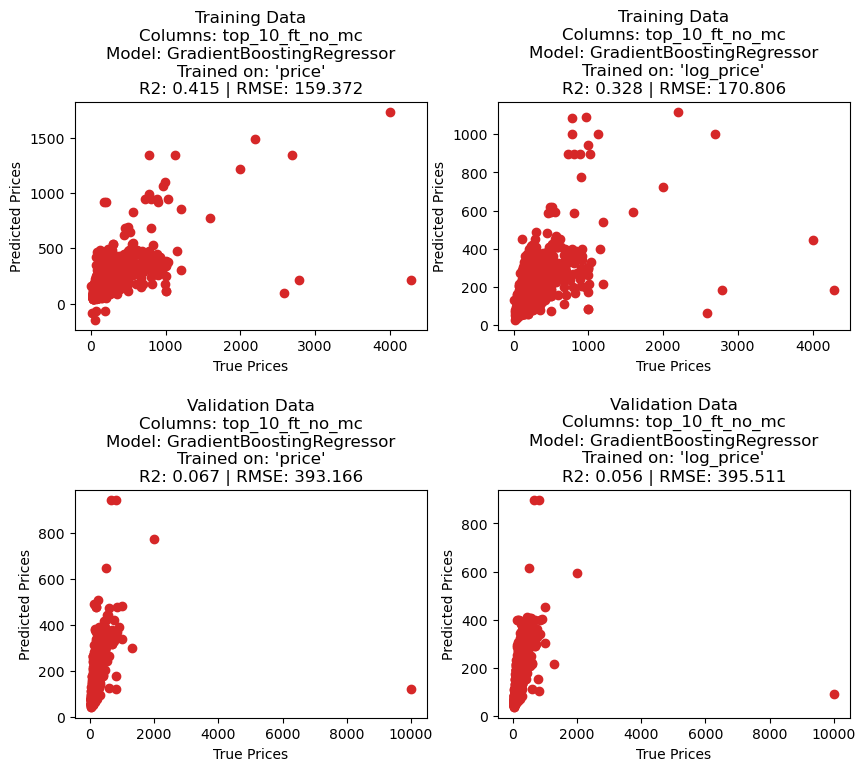

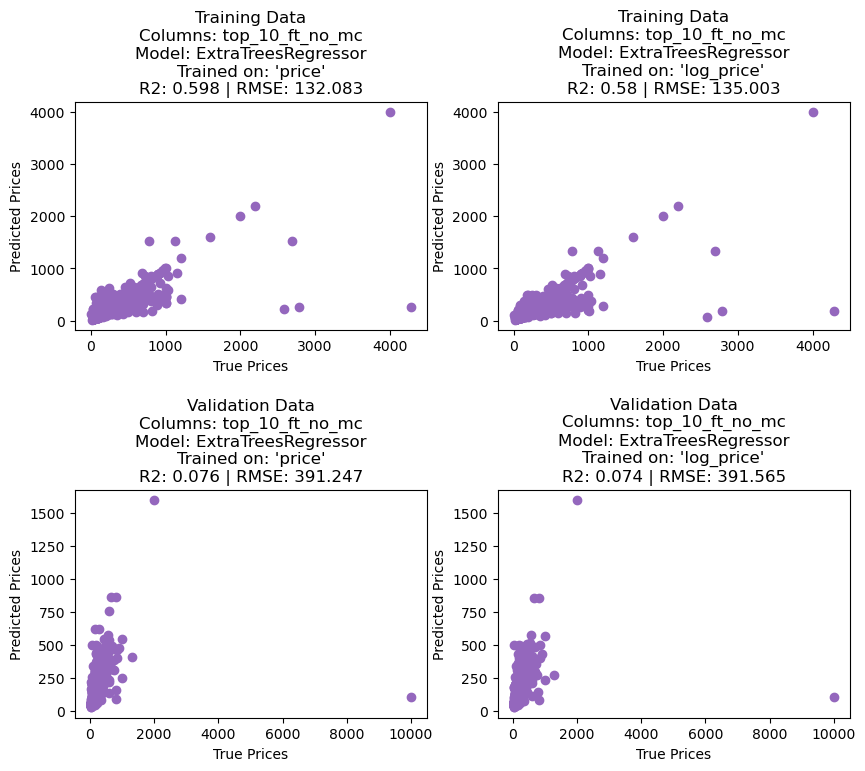

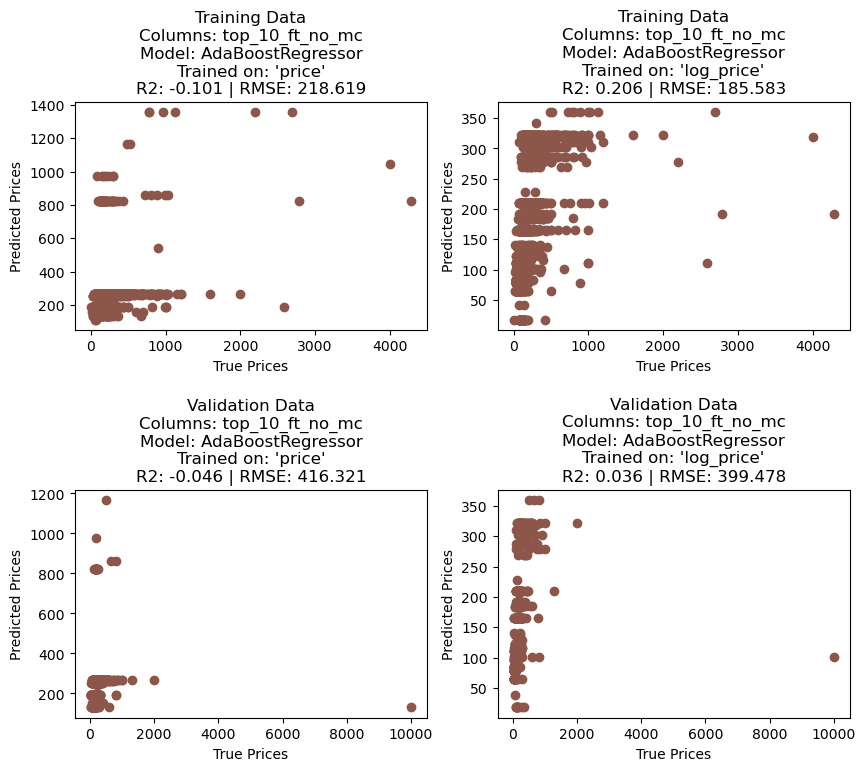

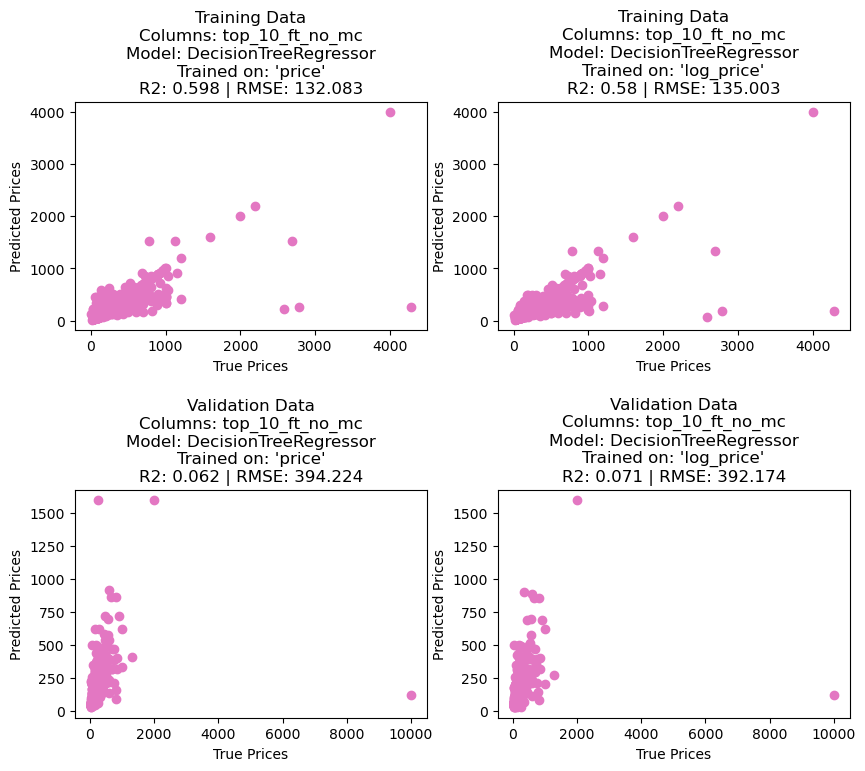

data_list_top_30_ft_no_mc
(2781, 30)


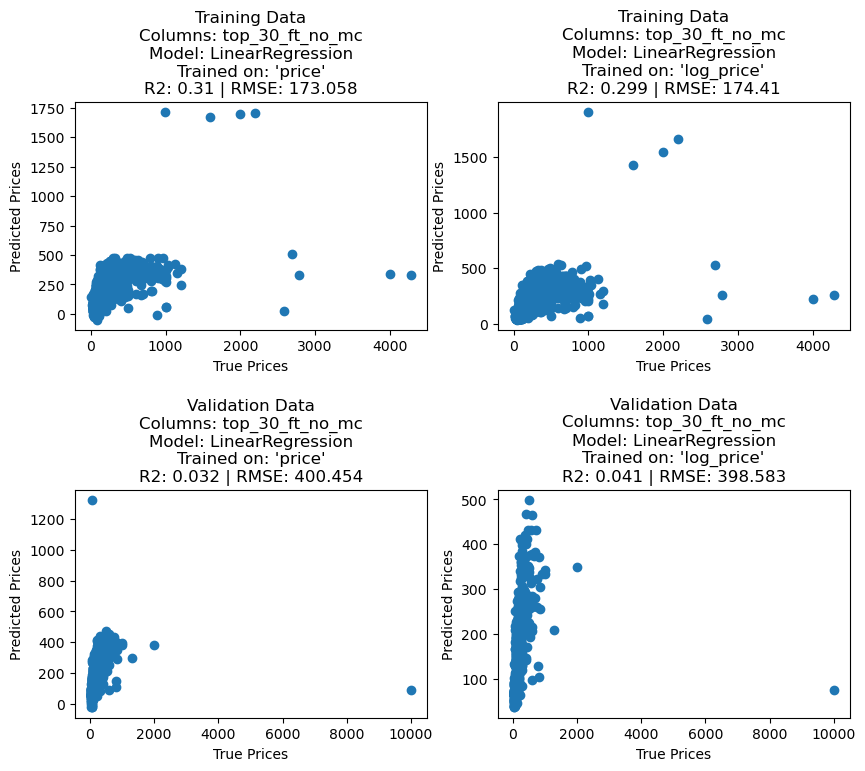

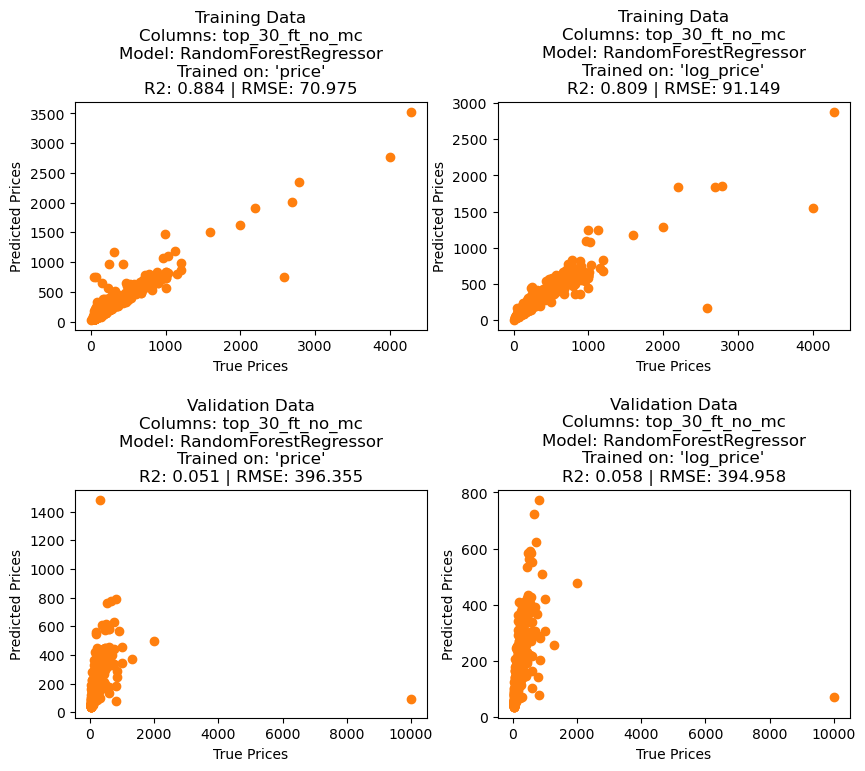

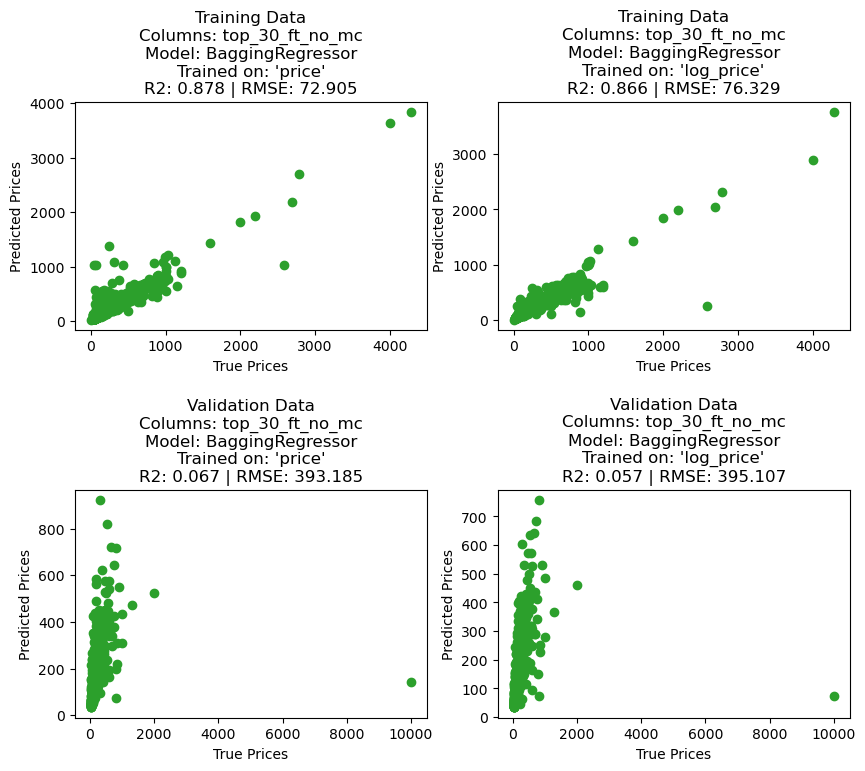

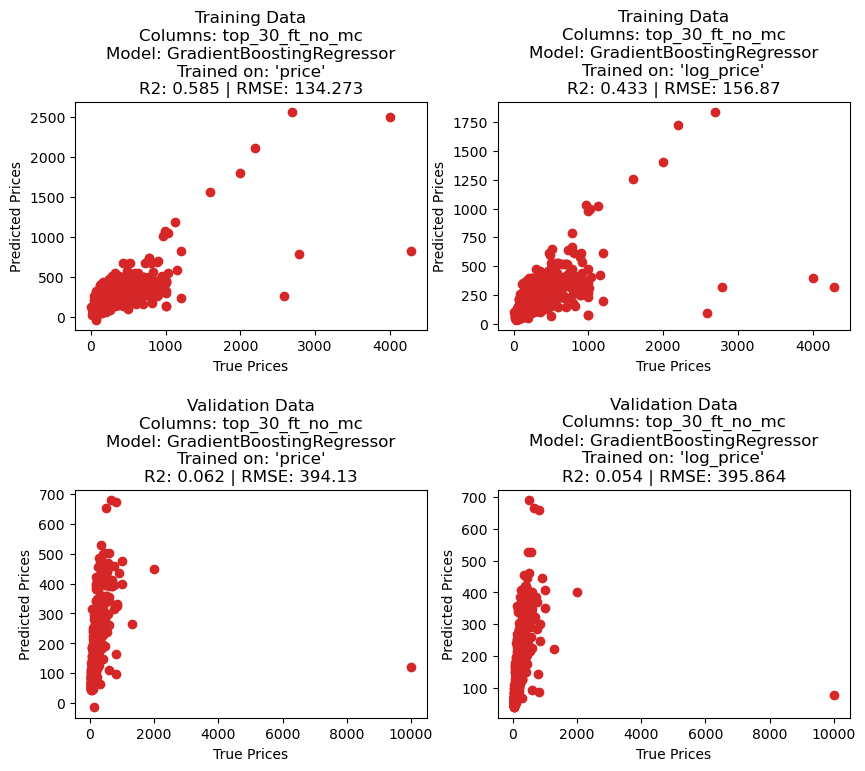

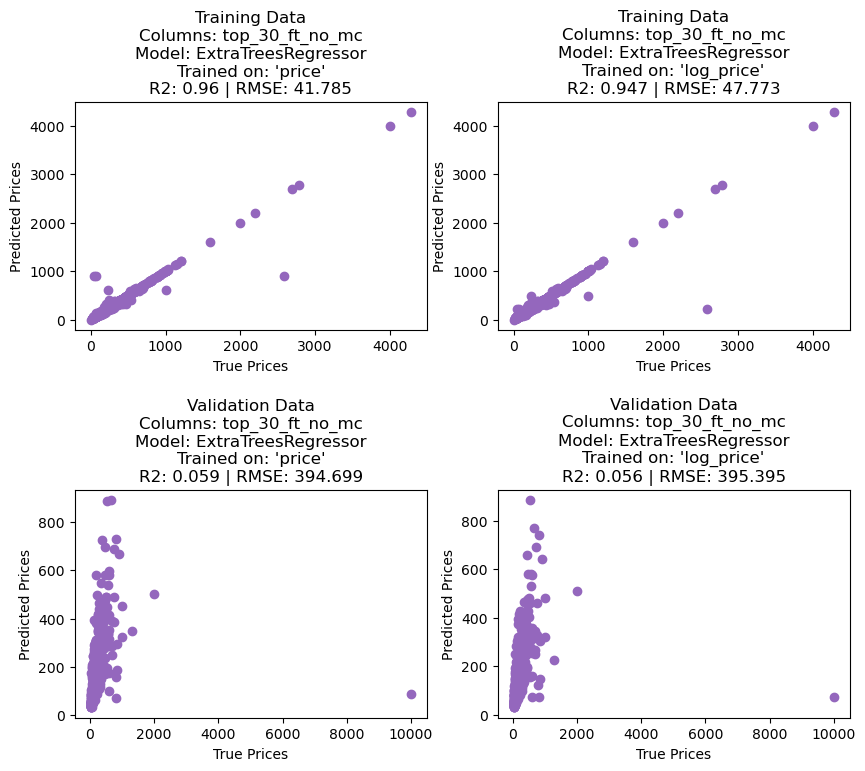

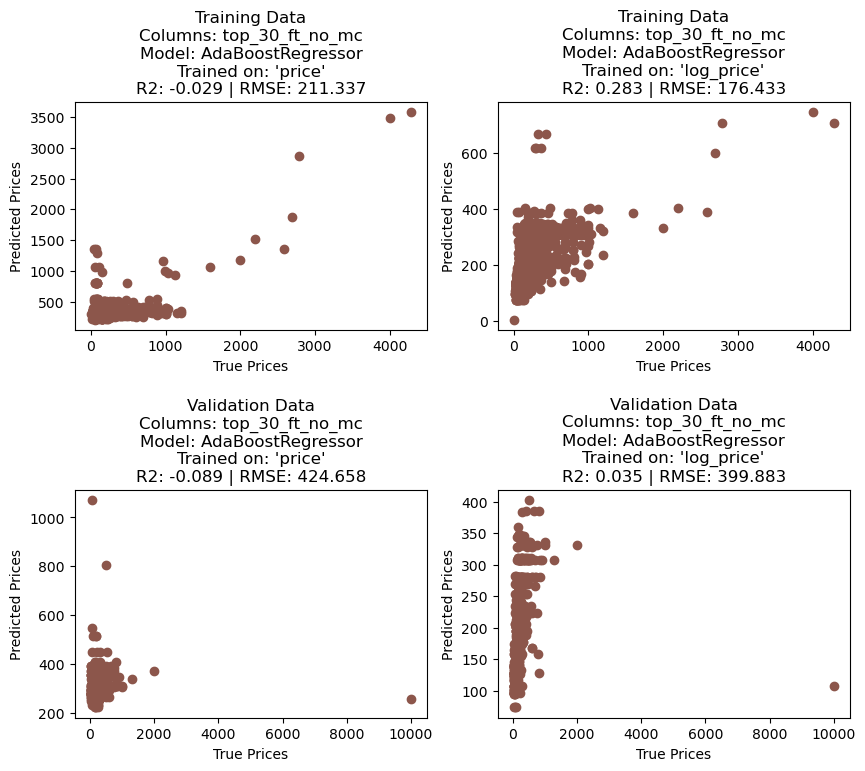

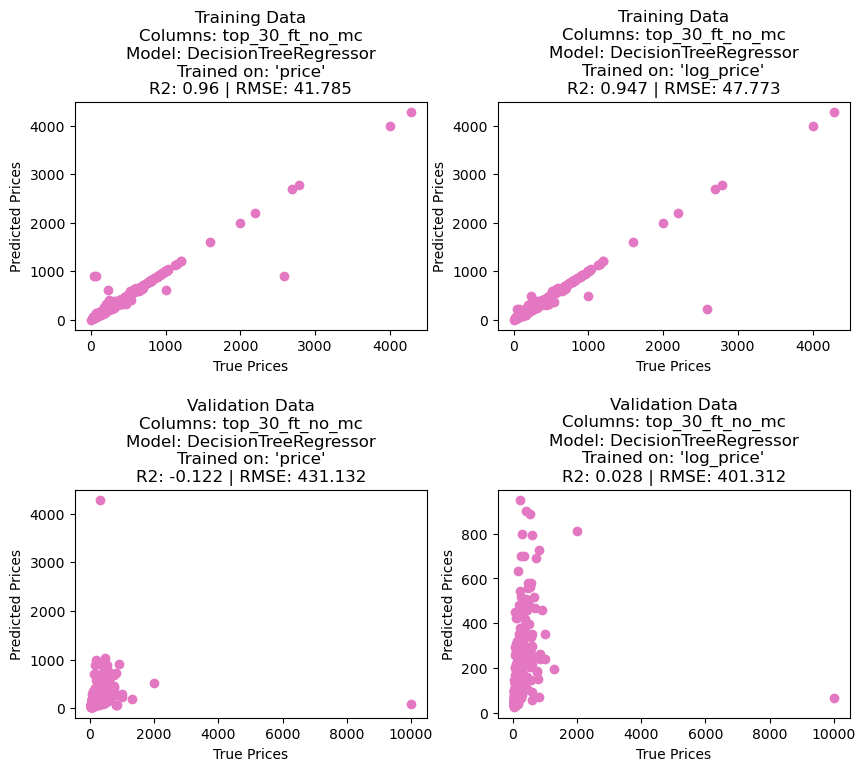

data_list_top_50_ft_no_mc
(2781, 50)


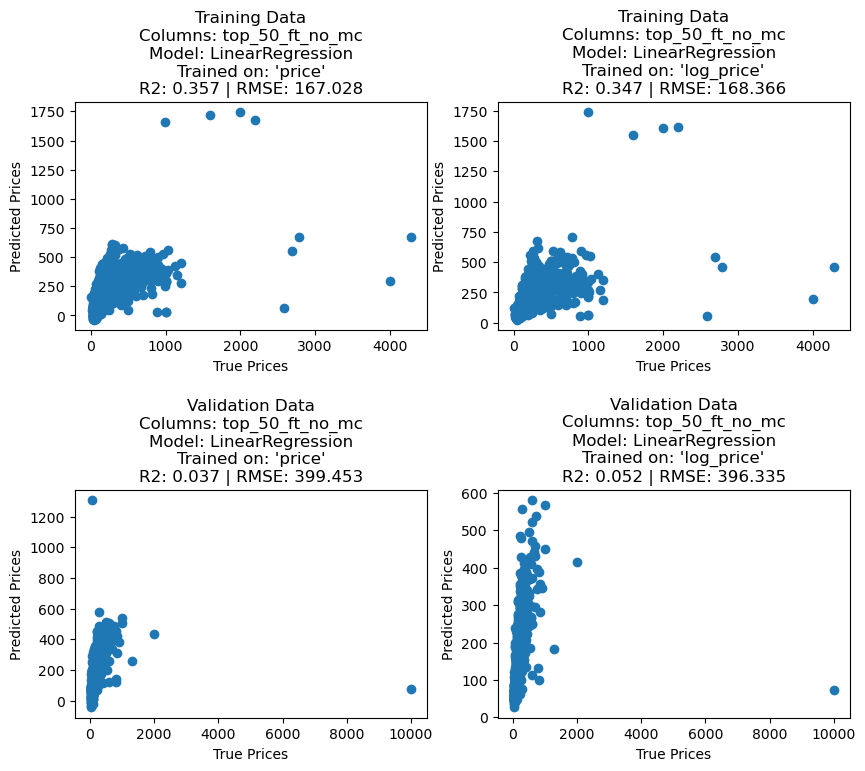

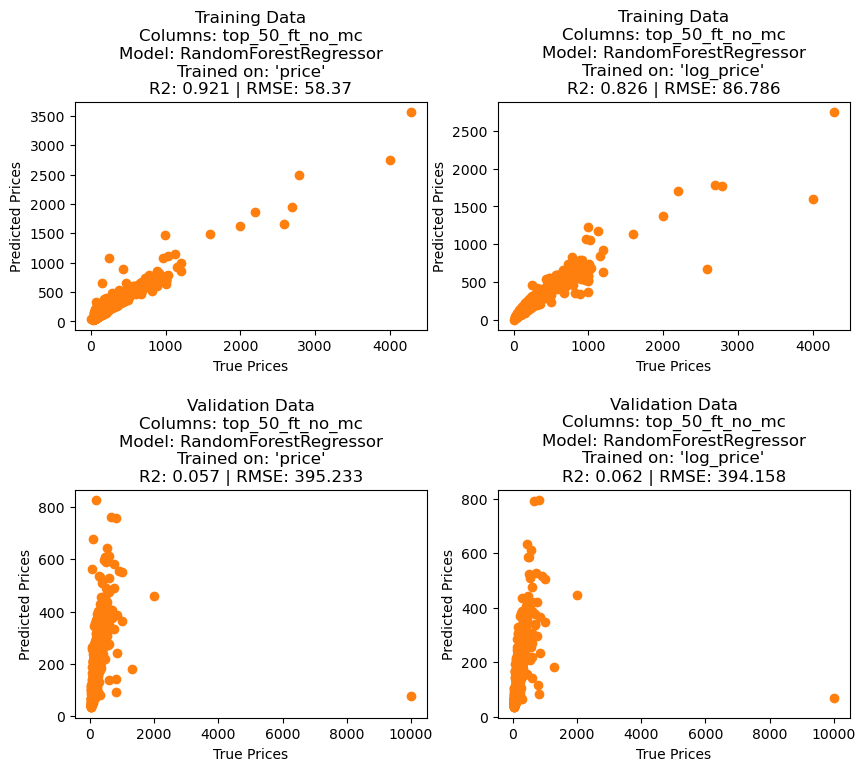

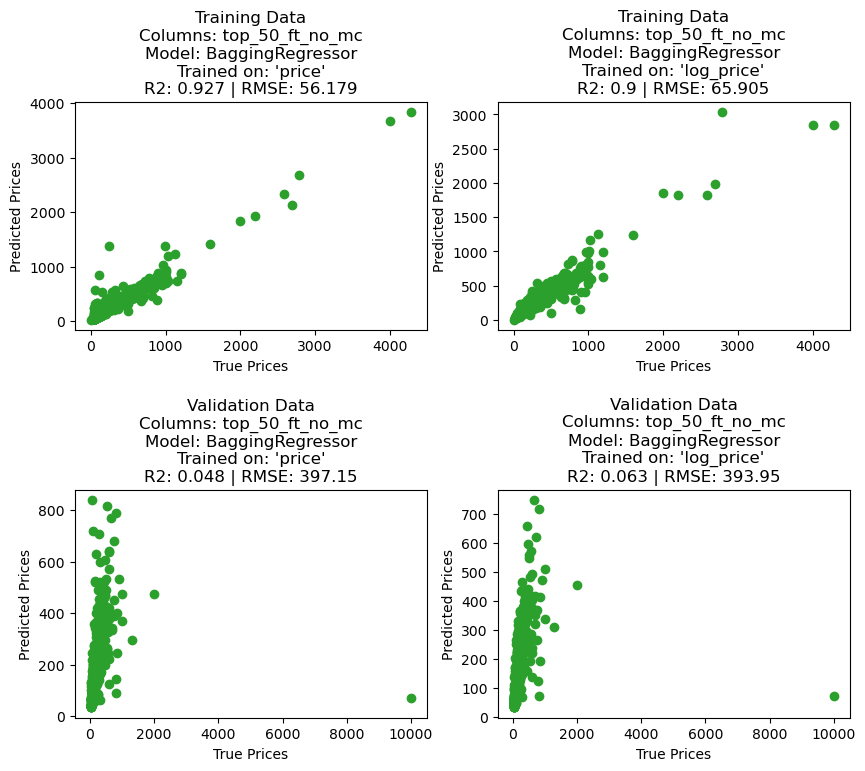

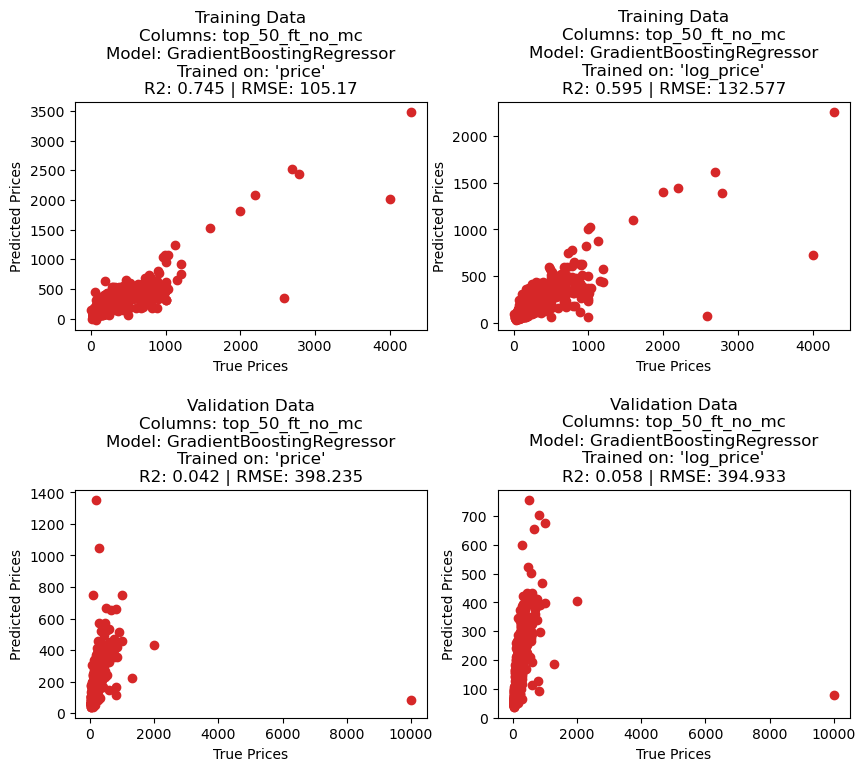

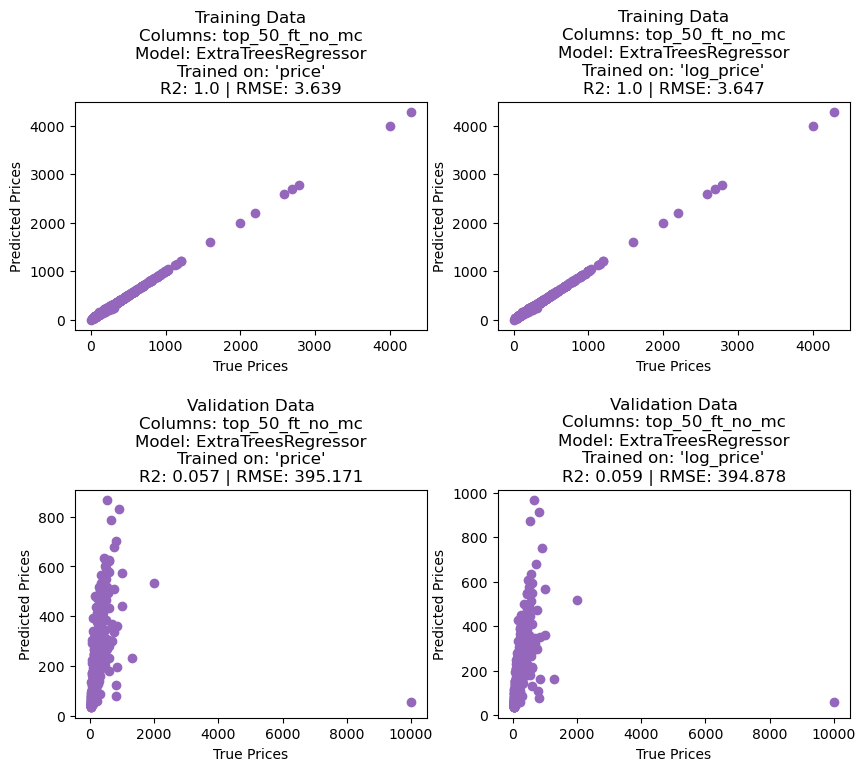

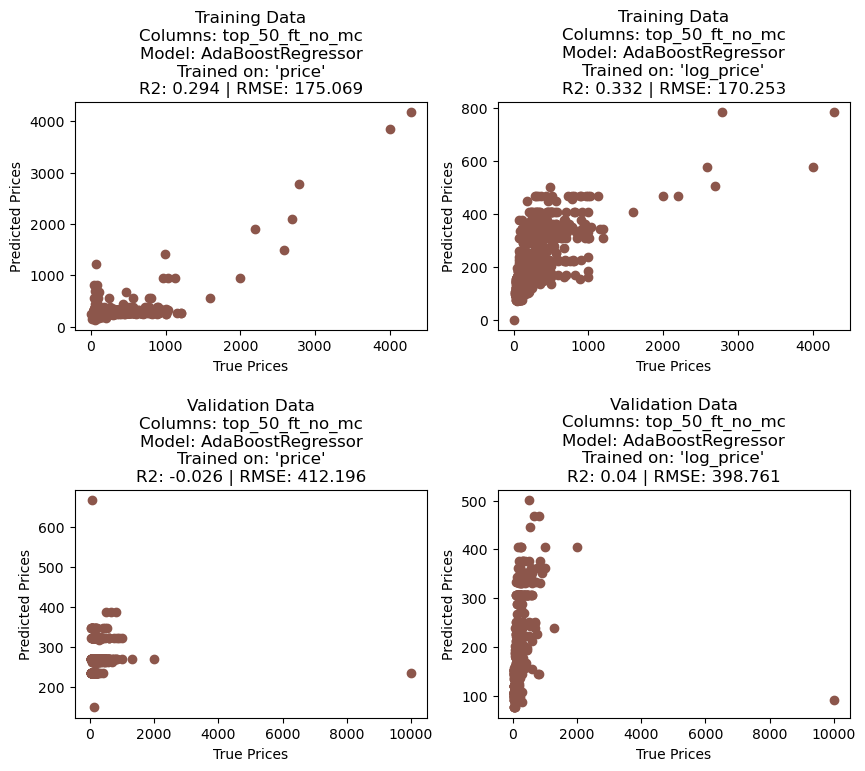

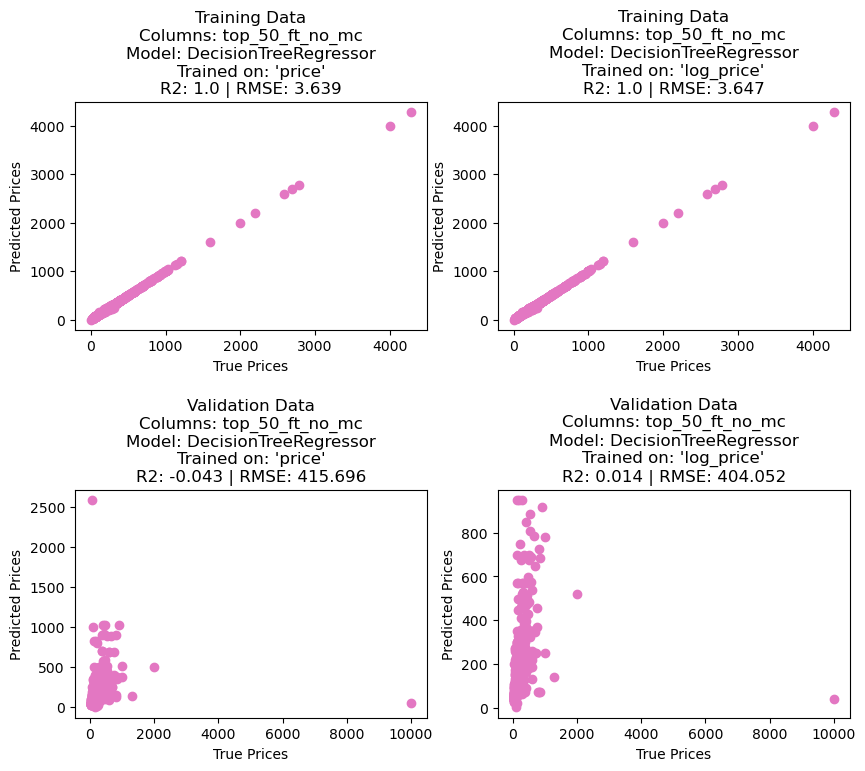

data_list_top_100_ft_no_mc
(2781, 100)


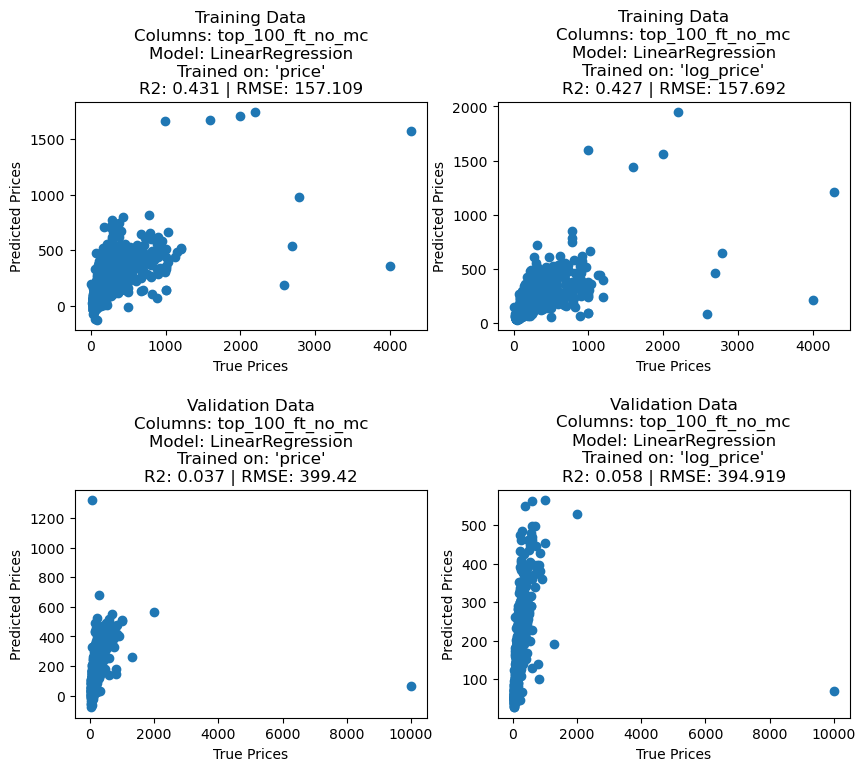

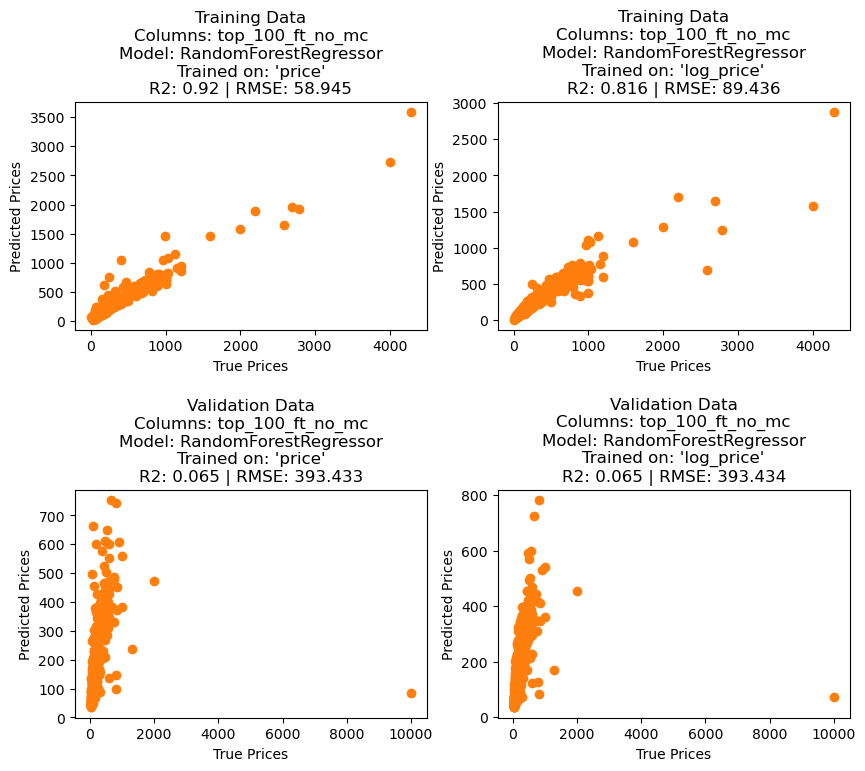

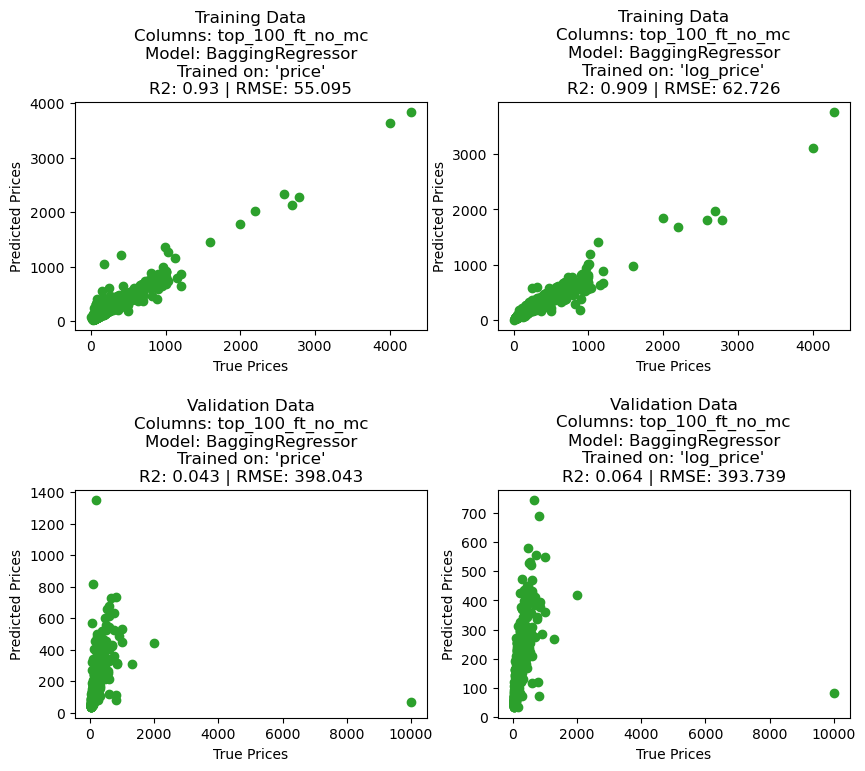

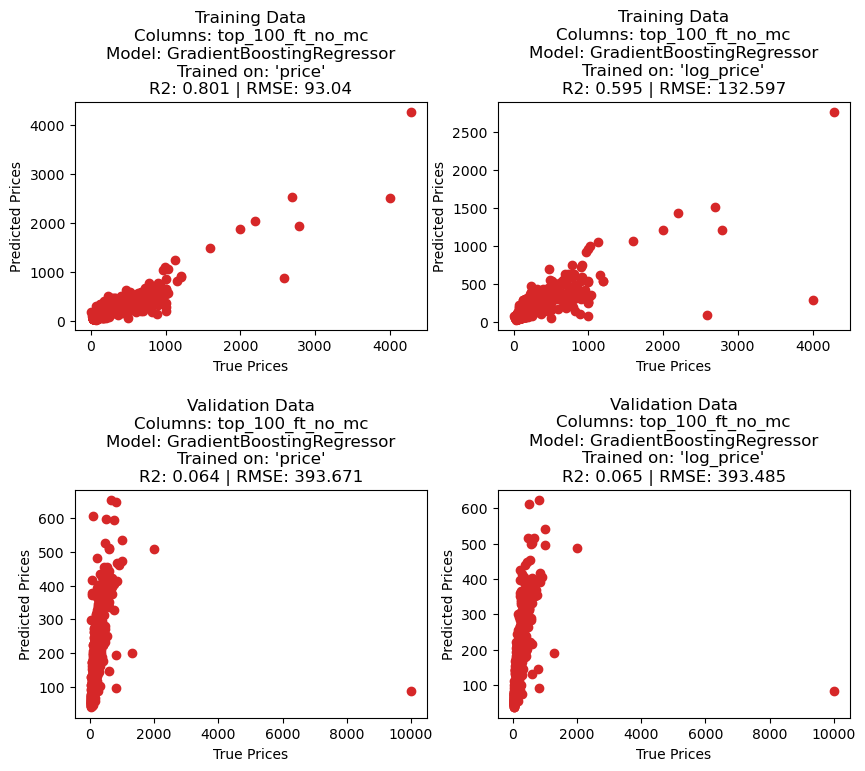

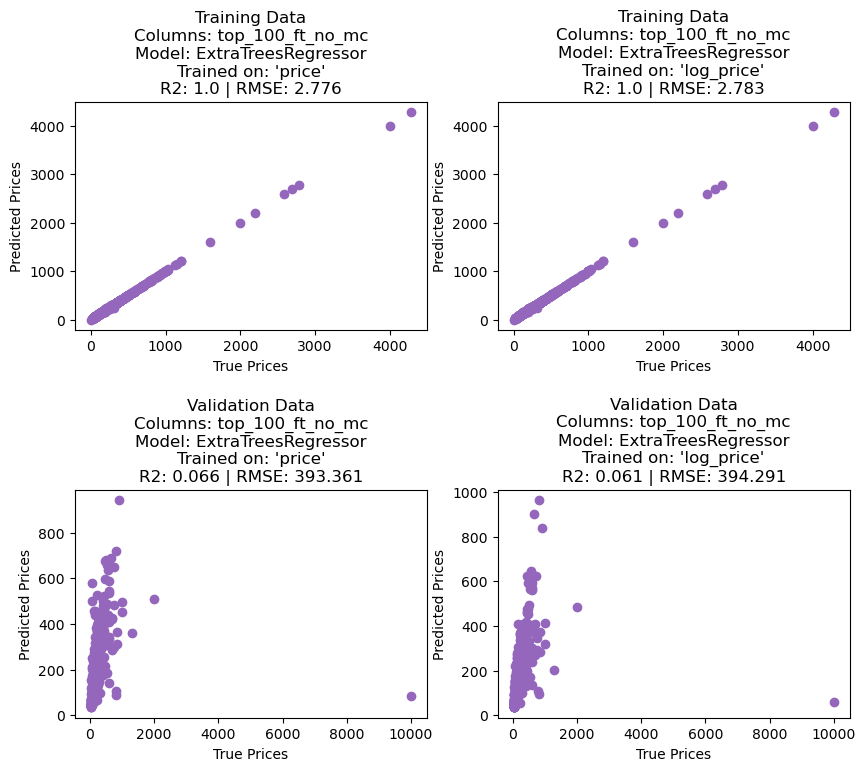

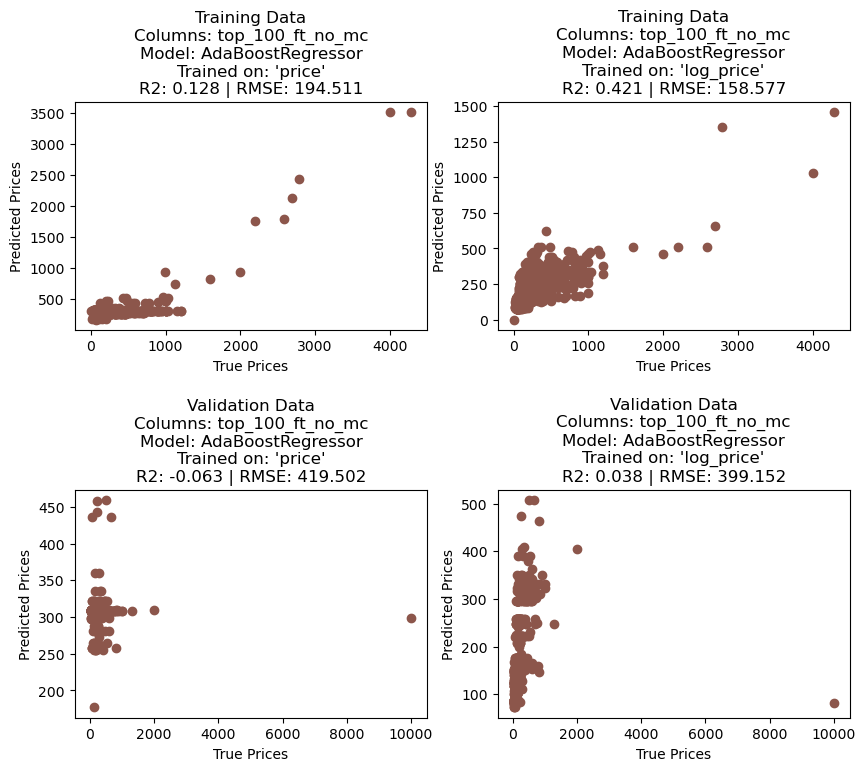

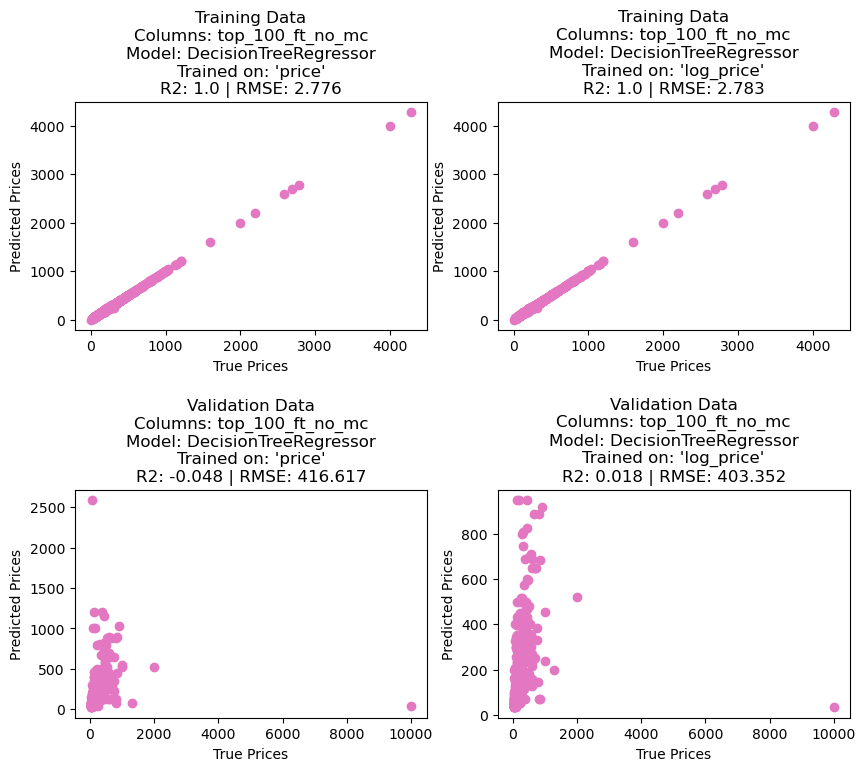

In [33]:
# Run the data maker function inside of the model maker function
#  Write a loop that will loop through datasets using columns in the column lists created previously

column_lists = [
    [top_5_ft_no_mc, 'top_5_ft_no_mc'],
    [top_10_ft_no_mc, 'top_10_ft_no_mc'],
    [top_30_ft_no_mc, 'top_30_ft_no_mc'],
    [top_50_ft_no_mc, 'top_50_ft_no_mc'],
    [top_100_ft_no_mc, 'top_100_ft_no_mc'],
]

for array in column_lists:
    df_array = model_maker(data_X_maker(lstn, validation, array[0], f'{array[1]}'), 
            f'{array[1]}', 
            list_of_models)
    
    

In [47]:
# # Check validation RMSE ranges for price target
# print(model_eval_metrics['RMSE validation, price'].min(), model_eval_metrics['RMSE validation, price'].max())

# # Check validation RMSE ranges for log price target
# print(model_eval_metrics['RMSE validation, log_price'].min(), model_eval_metrics['RMSE validation, log_price'].max())

##  6.1 - Observations:
* The Linear Regression and Ada Boost Regressor models appear to be the worst at predicting higher-priced listings
* For all models the predictions are rather scattered
* All models are prone to various levels of overfitting
* Despite the levels of overfitting, R-squared and RMSE values on the validation data are quite poor
    * RMSE values on the validation data range between \\$388.81 and $472.69 across both the price and log price targets
    * R2 values never get above 0.087, which is still only slightly better than the null model
* Models with price as the target seemed to produce the best model as compared to models with log_price as the target.  However, the models with log price as the target have a much narrower range of RMSE values ranging between \\$391.72 and \\$405.40 as compared to \\$388.81 and \\$472.69 for price
* The best performing model was a default parameter random forest regressor with an RMSE of \\$388.81 fitted to price

Generally speaking, these models are very poor, and there are some important features missing to properly characterize outliers.  The next sections will seek to showcase this by:
* Performing model optimization with hyperparameter tuning
* Limiting the input dataset to exclude outliers (higher-priced listings)

## 6.2 - Create a New Feature Set Where Correlations are Sorted by the Magnitude of the Correlation Coefficients with Respect to Price
Previously, the features were selected by having the highest correlation coefficient to either price or log price.  Since the models trained against log_price seem to perform worse, it's worth investigating if feature sets shoulod be created where they are selected based only on the magnitude of their correlation to price.

In [35]:
# Choose the same correlation coefficient as previously
correlation_limit = 0.6

# Create new feature sets based on correlations to price only
top_5_ft_no_mc_price = top_features(5, check_mc=True, corr_lim = correlation_limit, sort_by='price_mag')
top_10_ft_no_mc_price = top_features(10, check_mc=True, corr_lim = correlation_limit, sort_by='price_mag')
top_30_ft_no_mc_price = top_features(30, check_mc=True, corr_lim = correlation_limit, sort_by='price_mag')
top_50_ft_no_mc_price = top_features(50, check_mc=True, corr_lim = correlation_limit, sort_by='price_mag')
top_100_ft_no_mc_price = top_features(100, check_mc=True, corr_lim = correlation_limit, sort_by='price_mag')

data_list_top_5_ft_no_mc_price
(2781, 5)


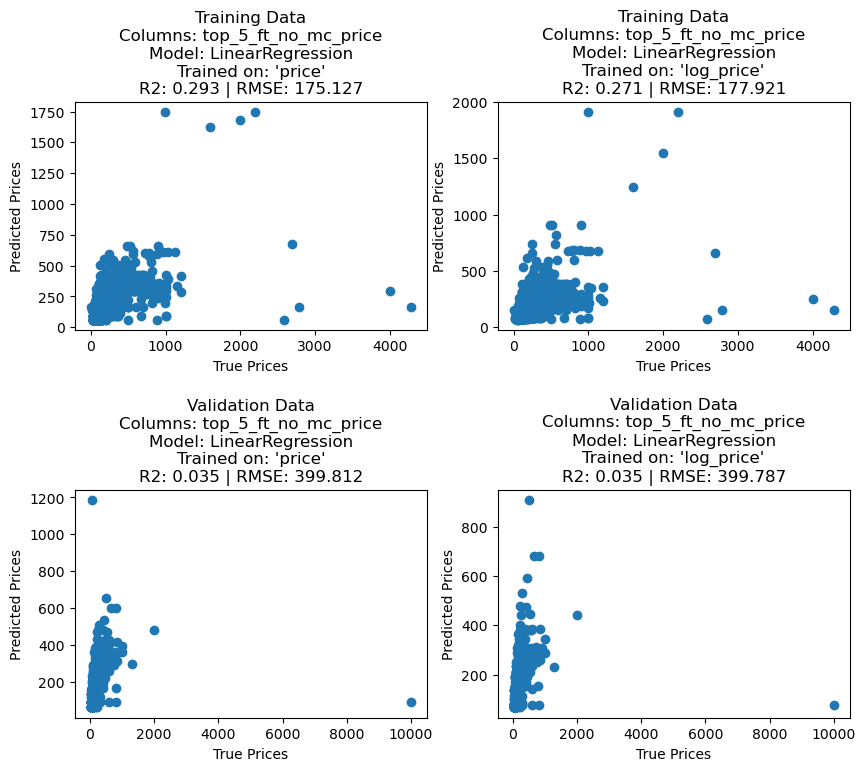

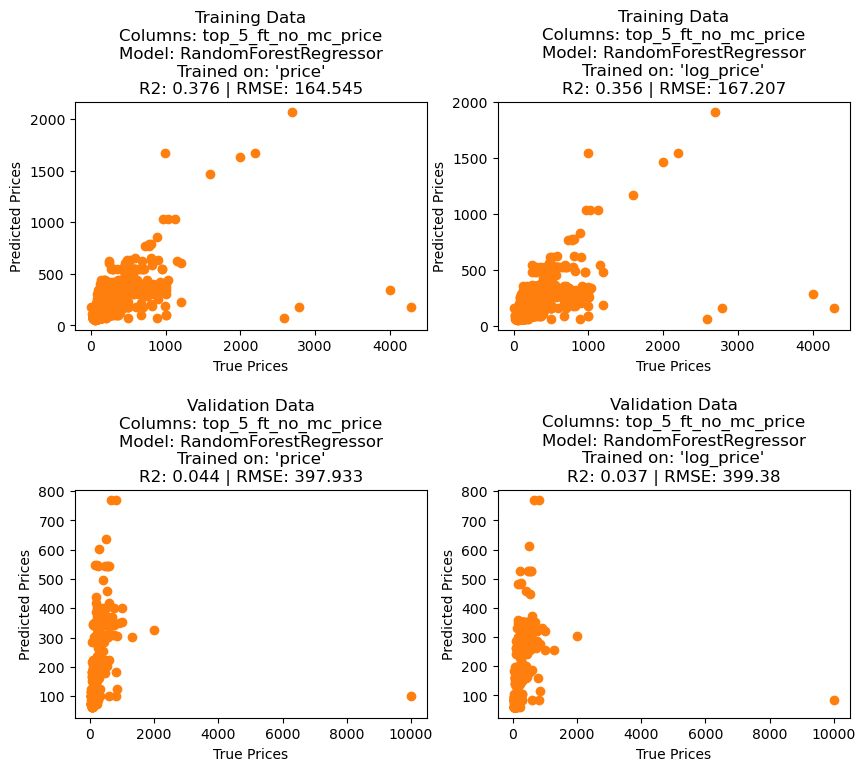

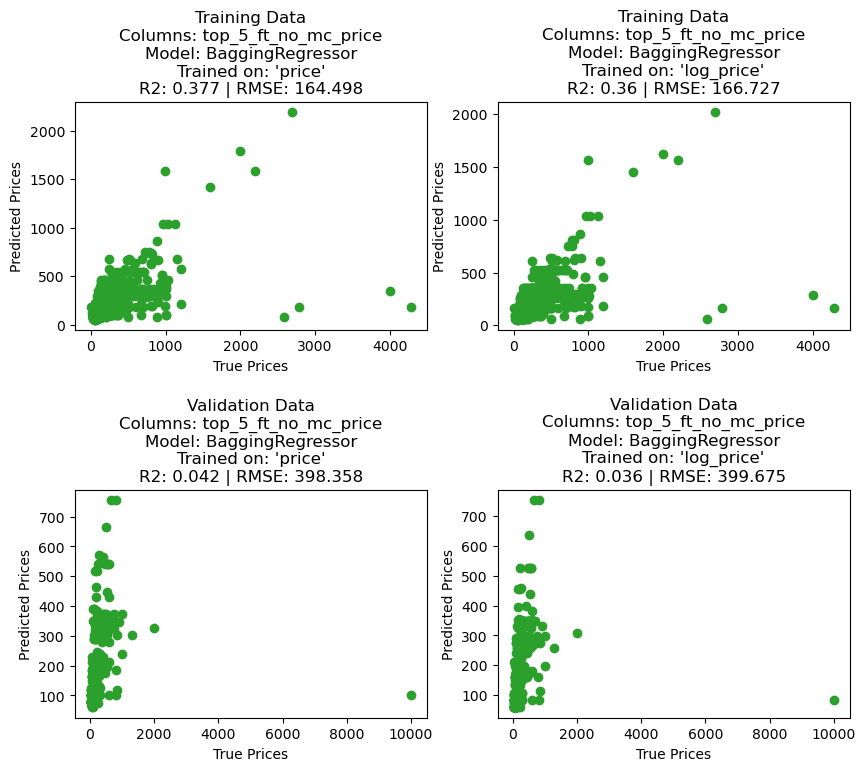

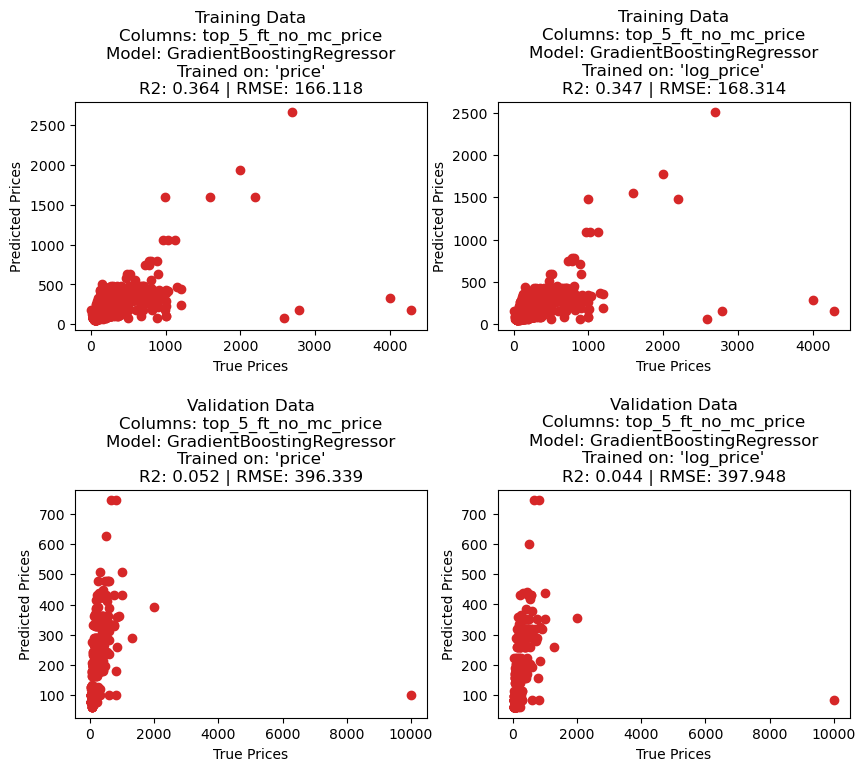

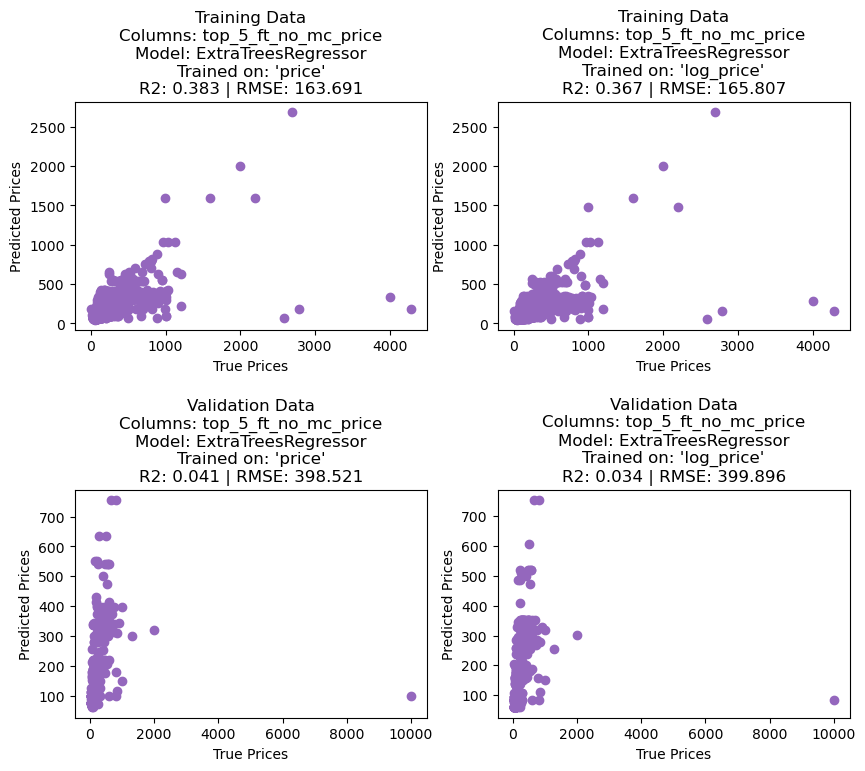

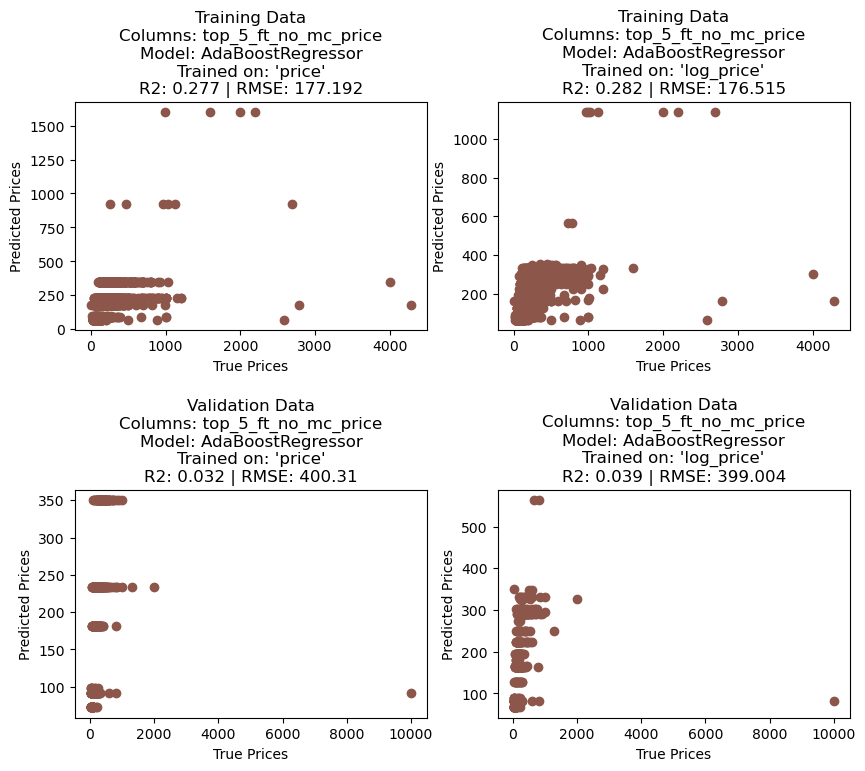

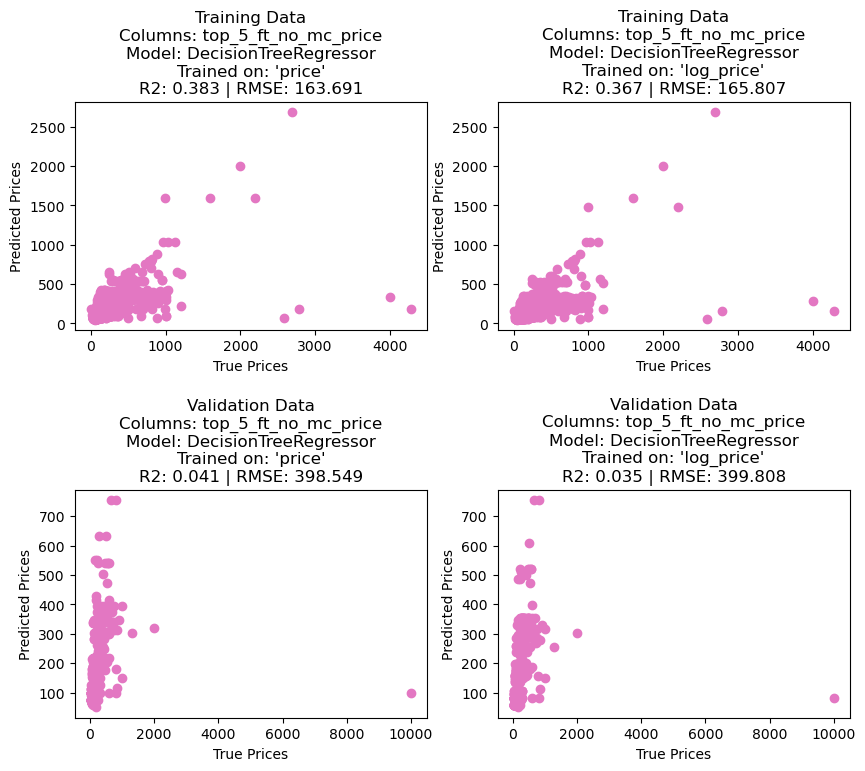

data_list_top_10_ft_no_mc_price
(2781, 10)


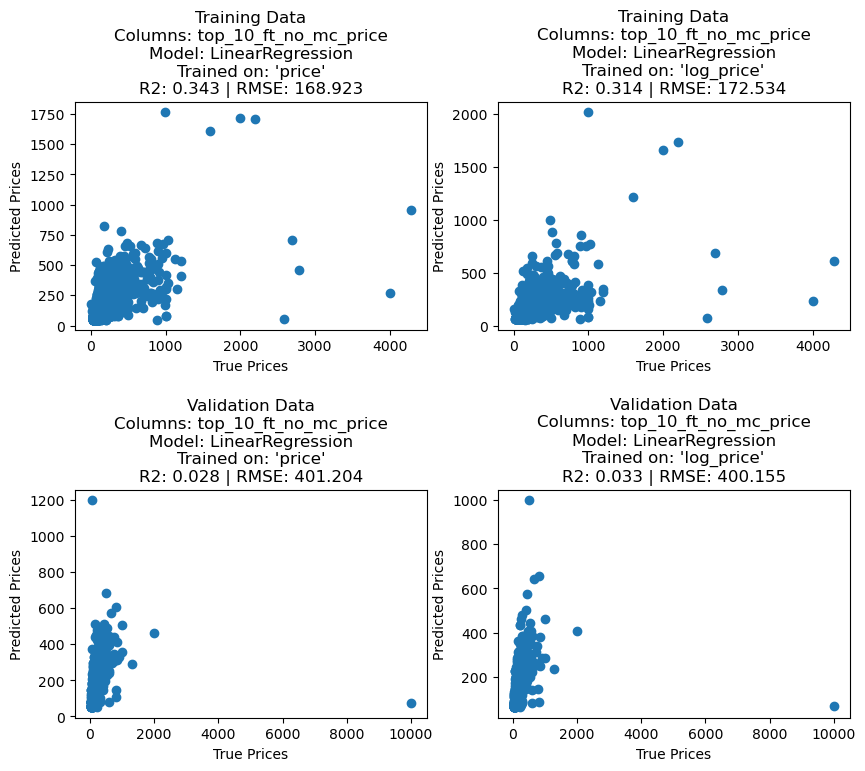

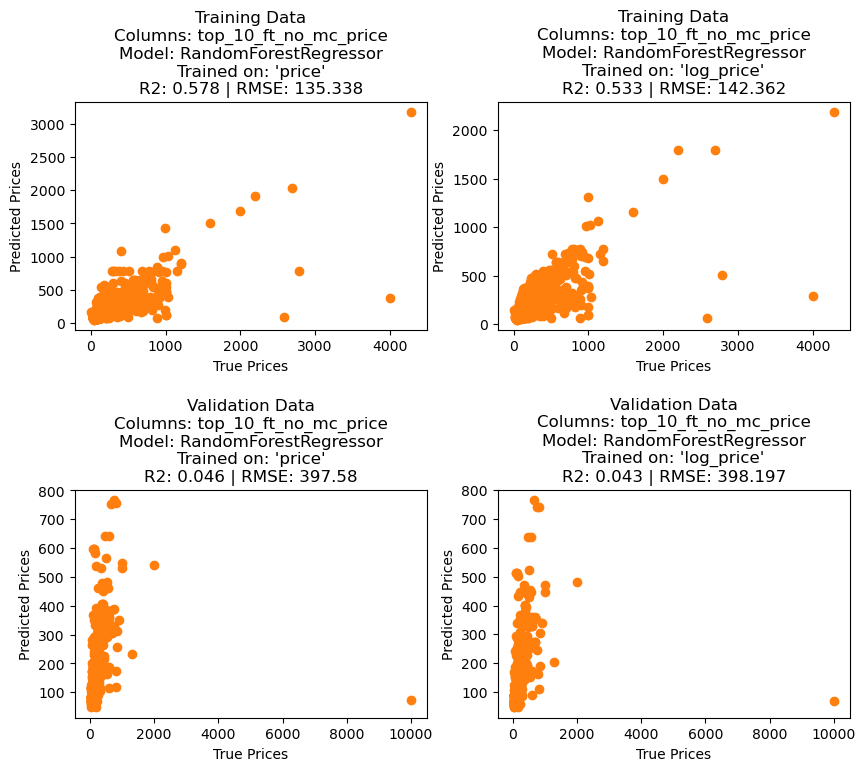

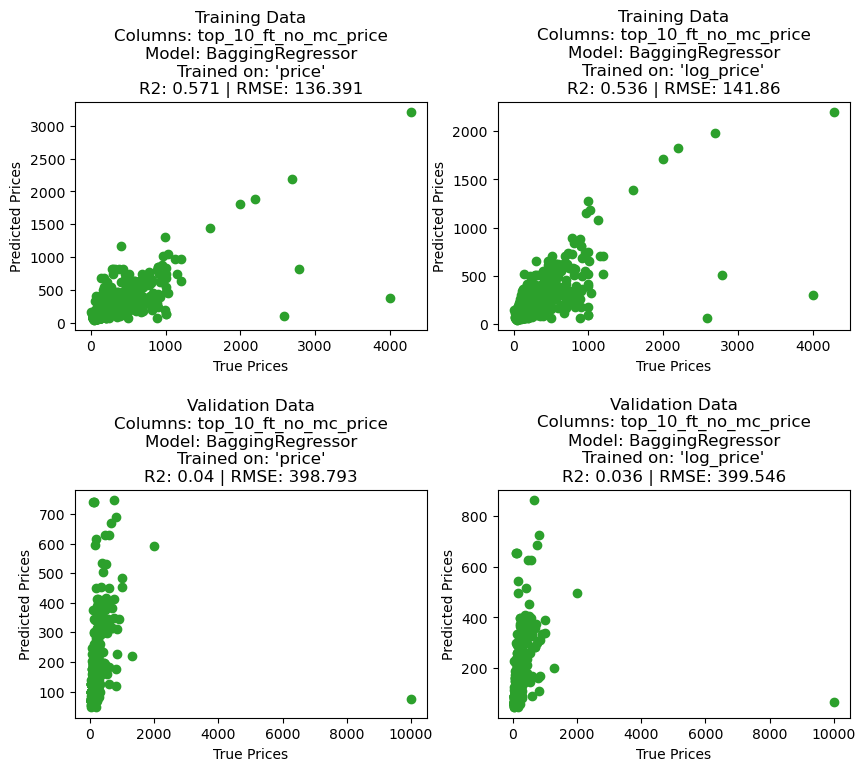

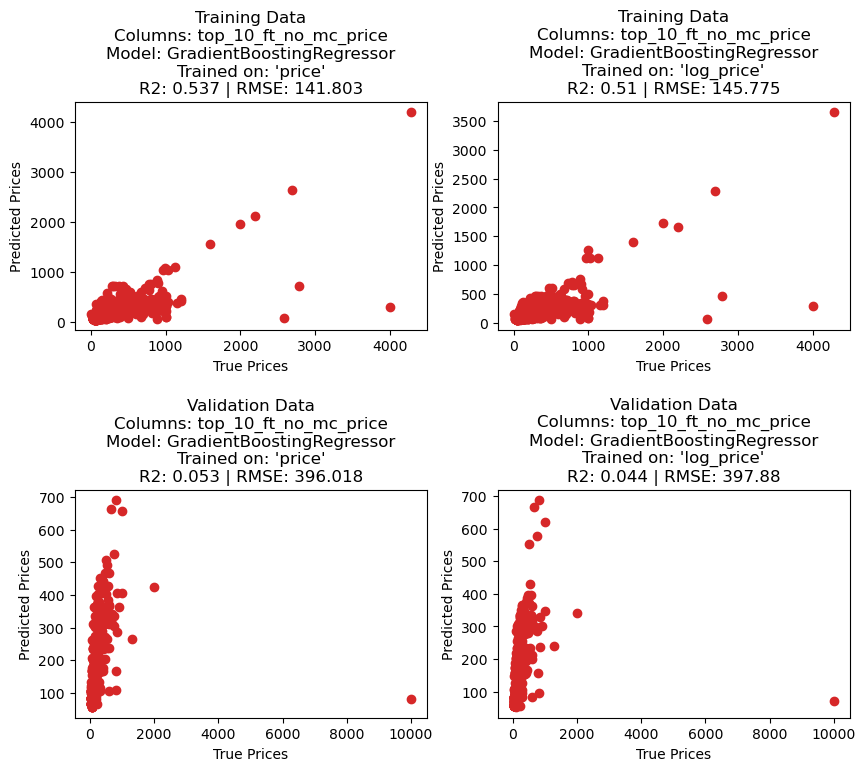

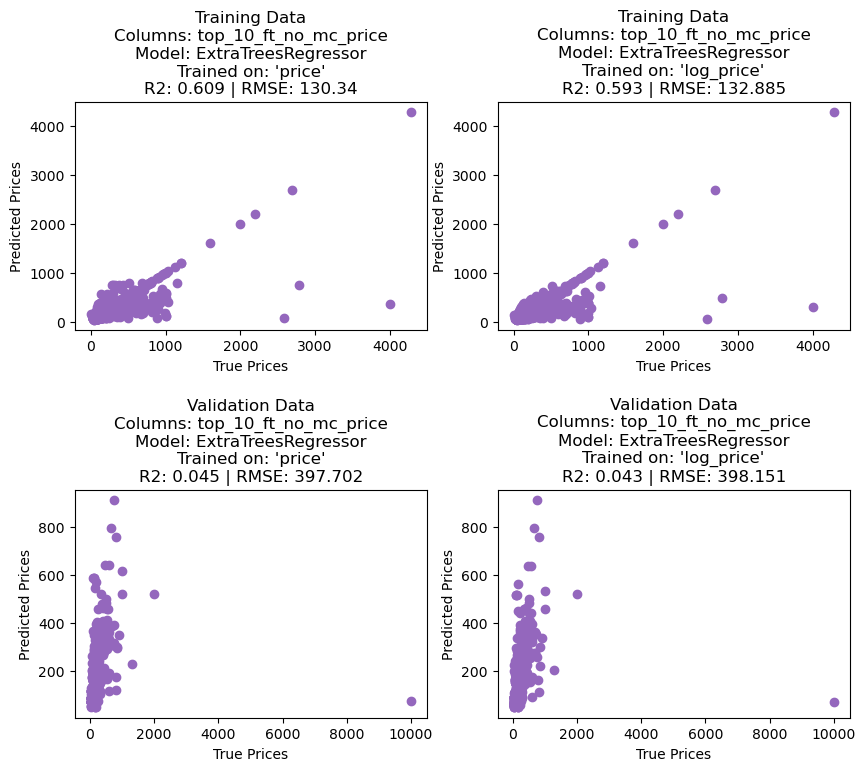

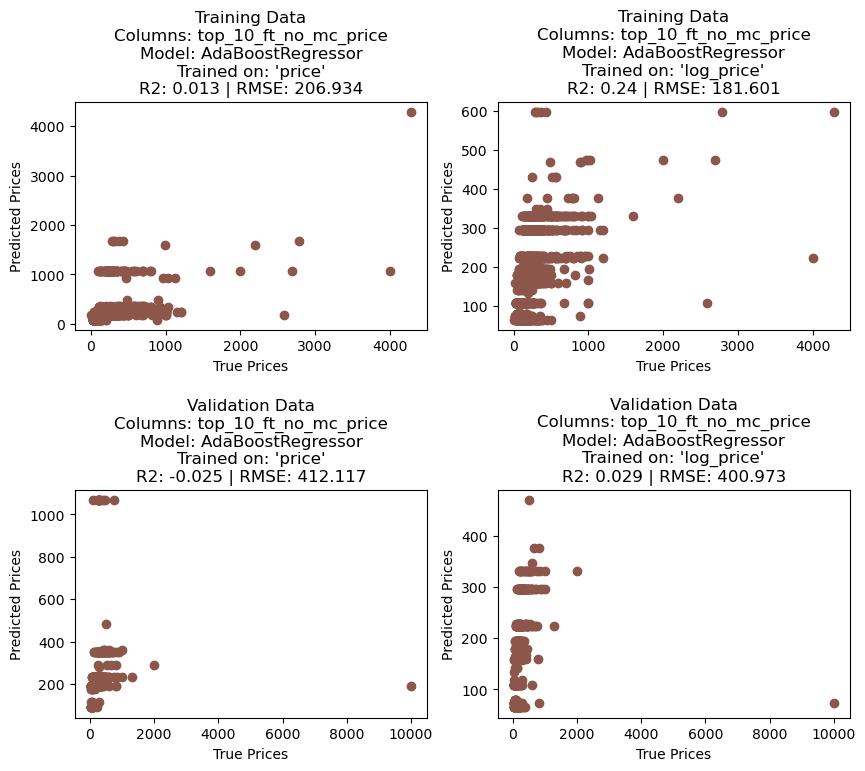

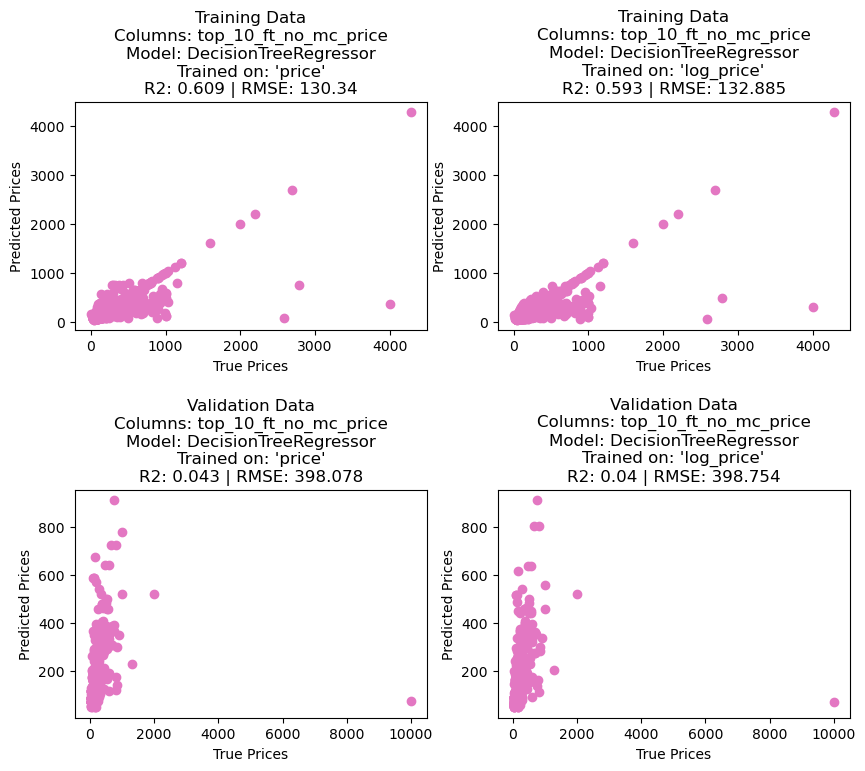

data_list_top_30_ft_no_mc_price
(2781, 30)


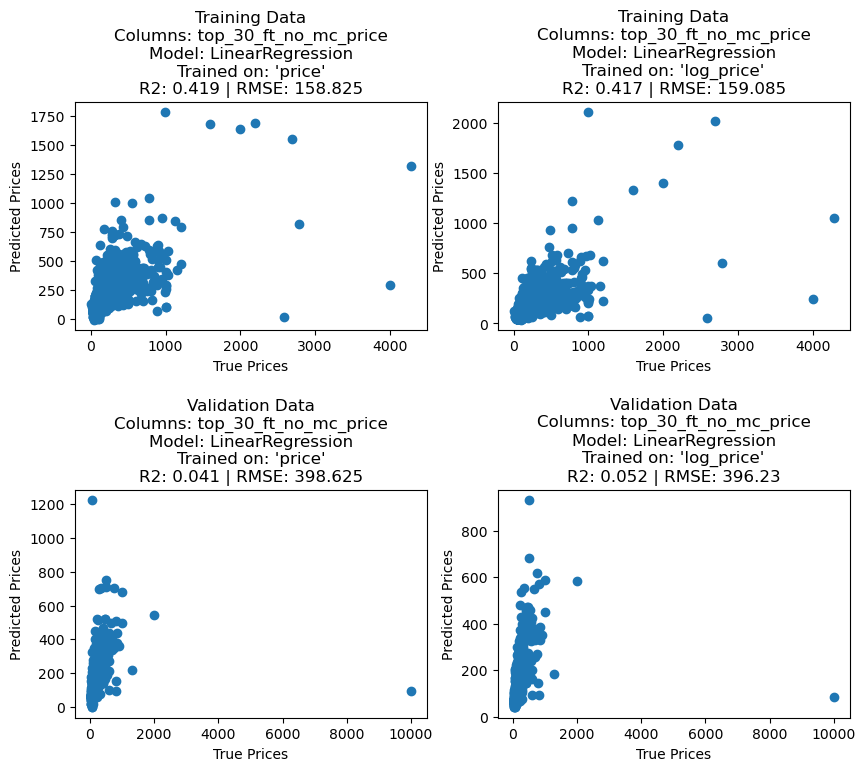

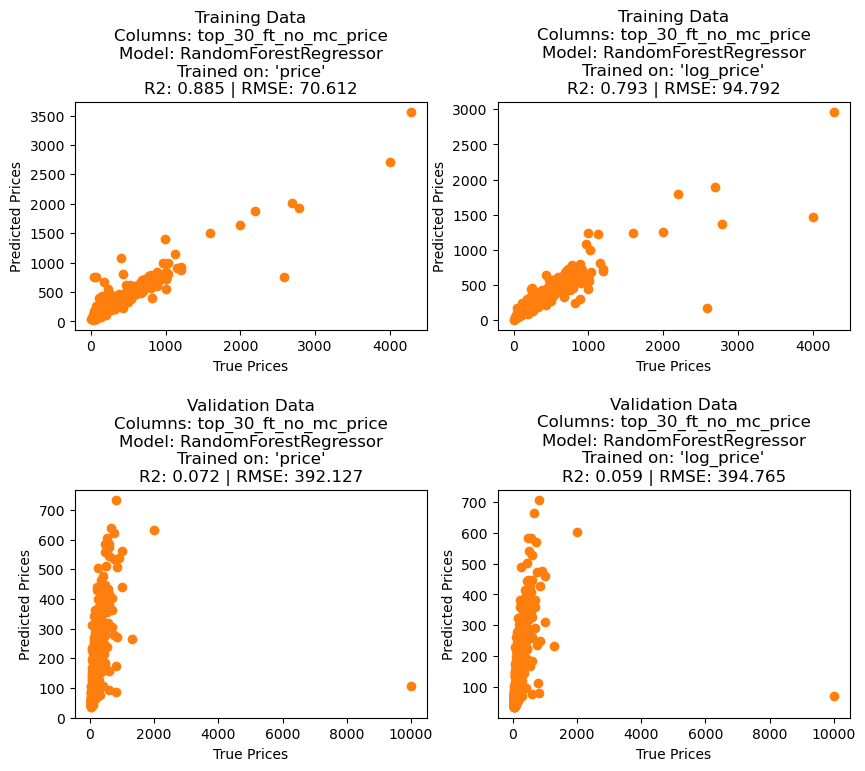

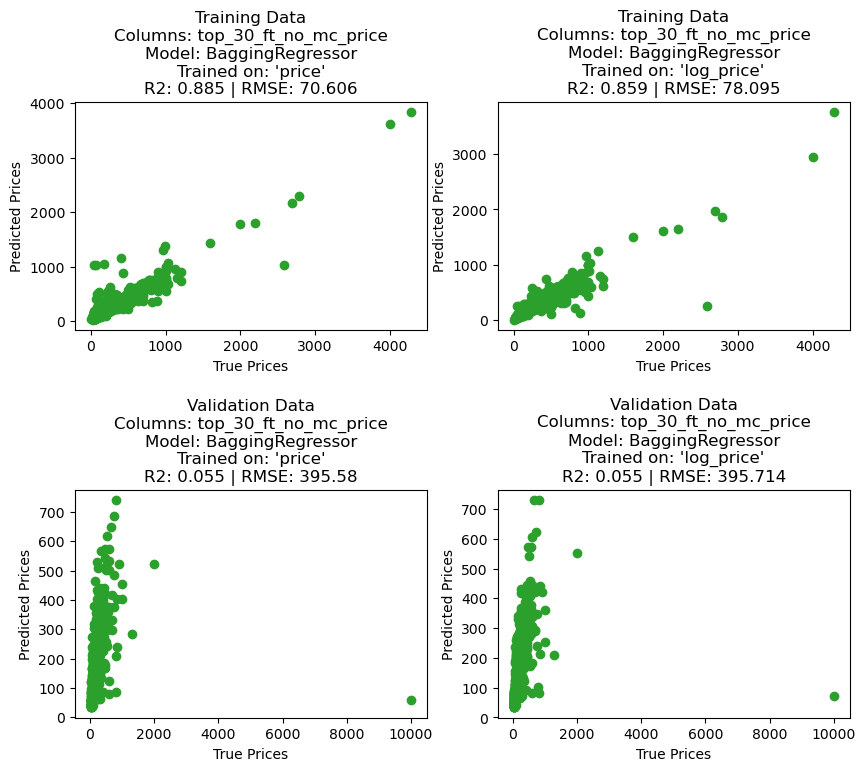

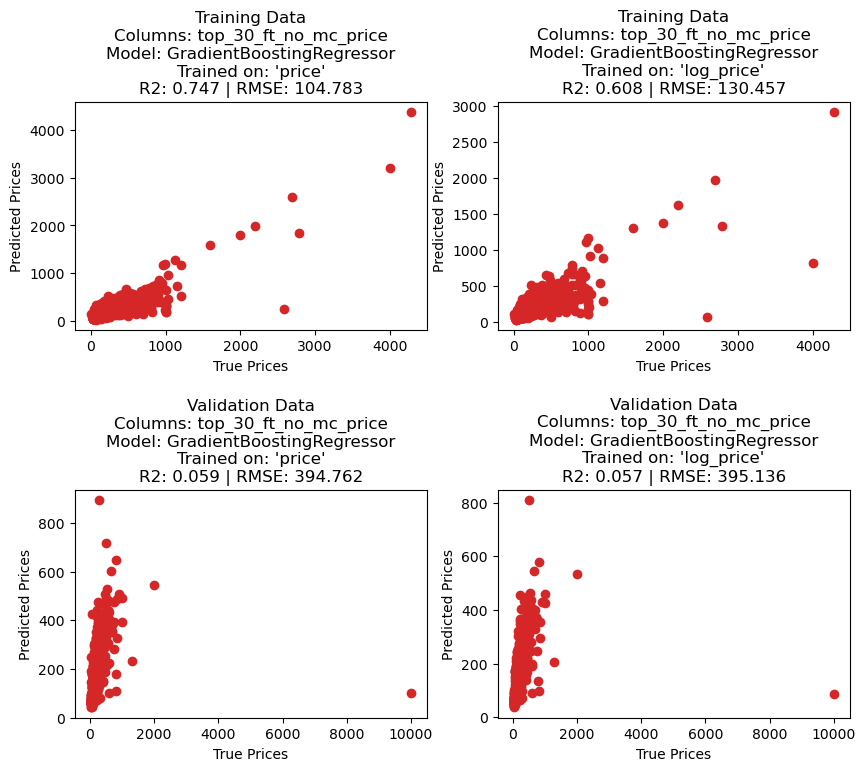

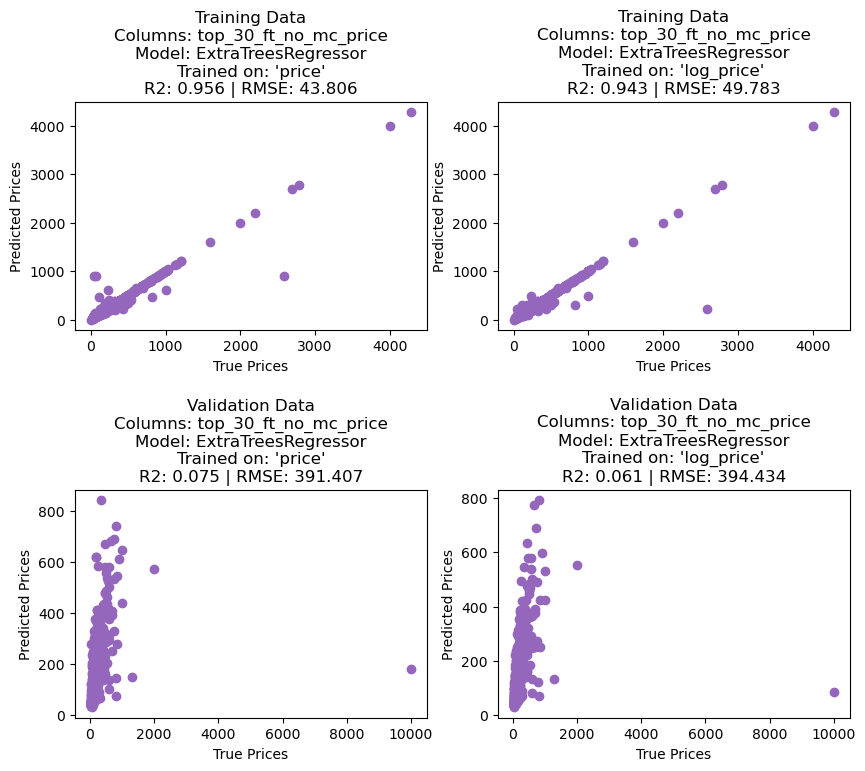

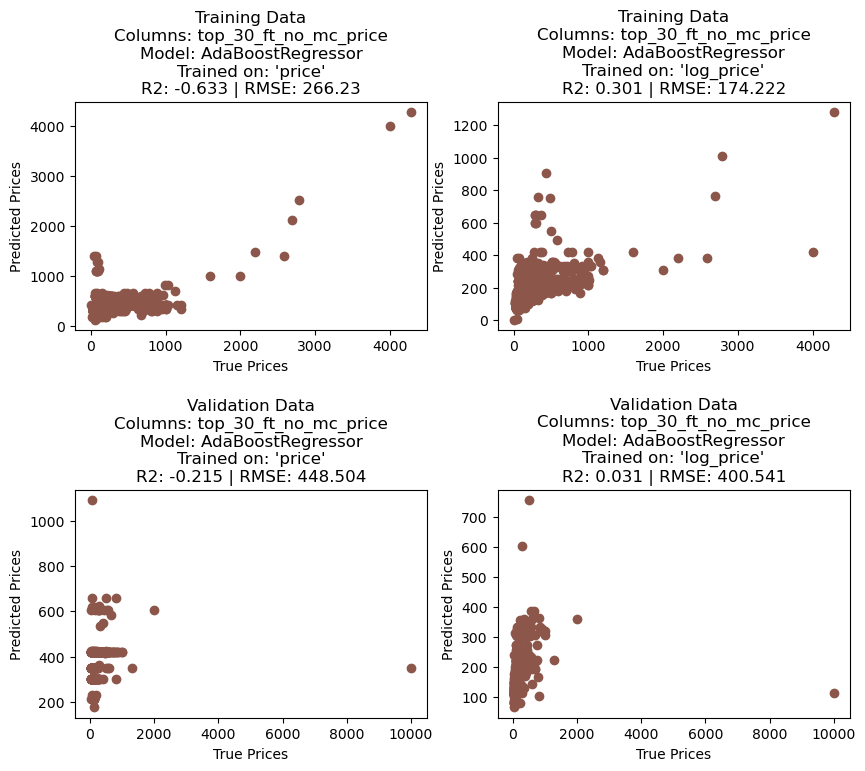

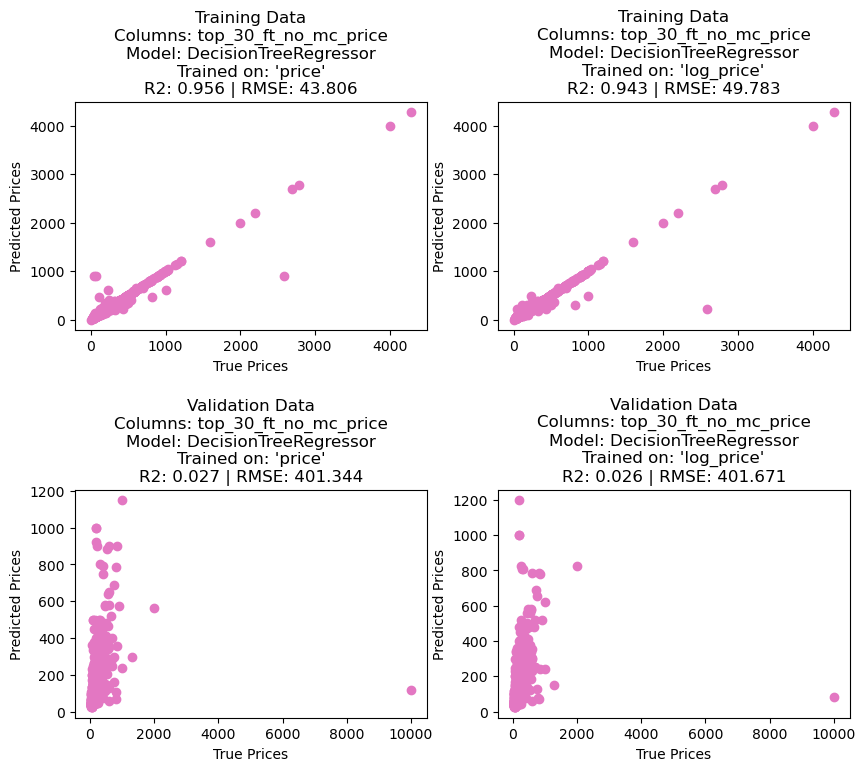

data_list_top_50_ft_no_mc_price
(2781, 50)


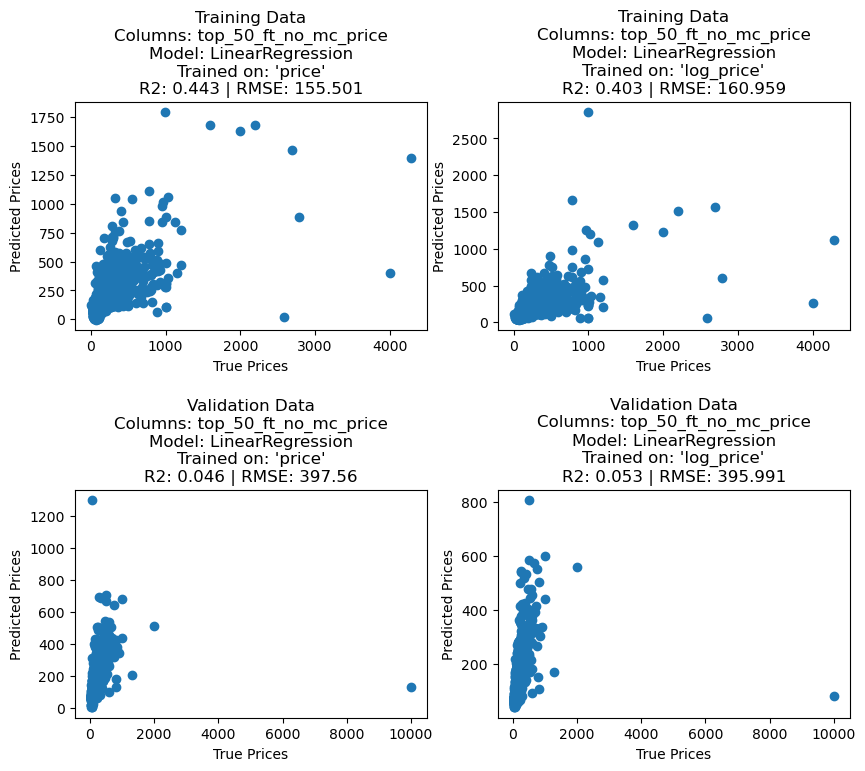

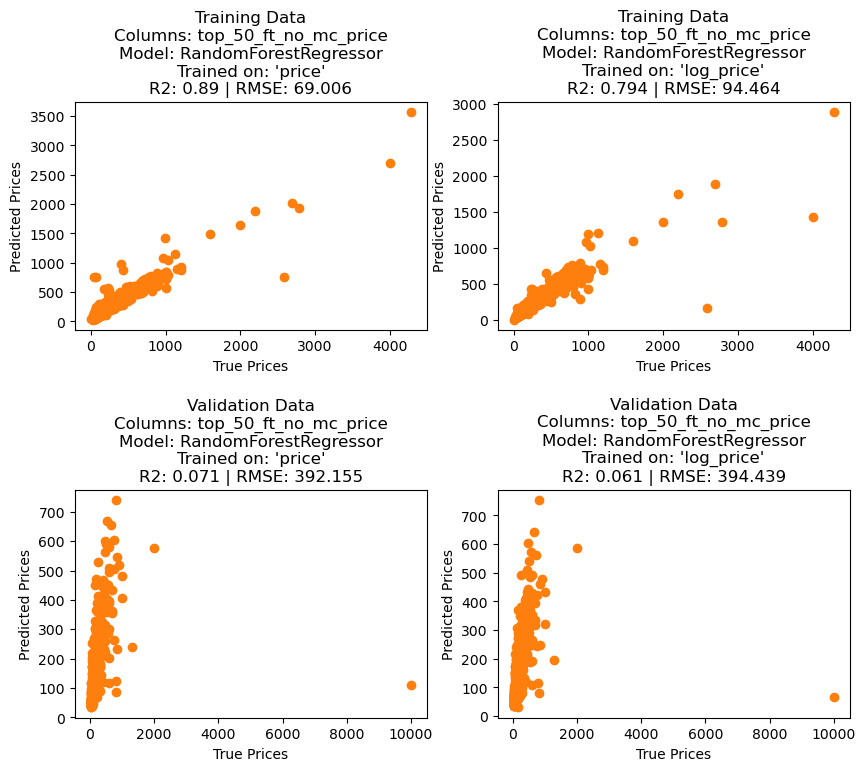

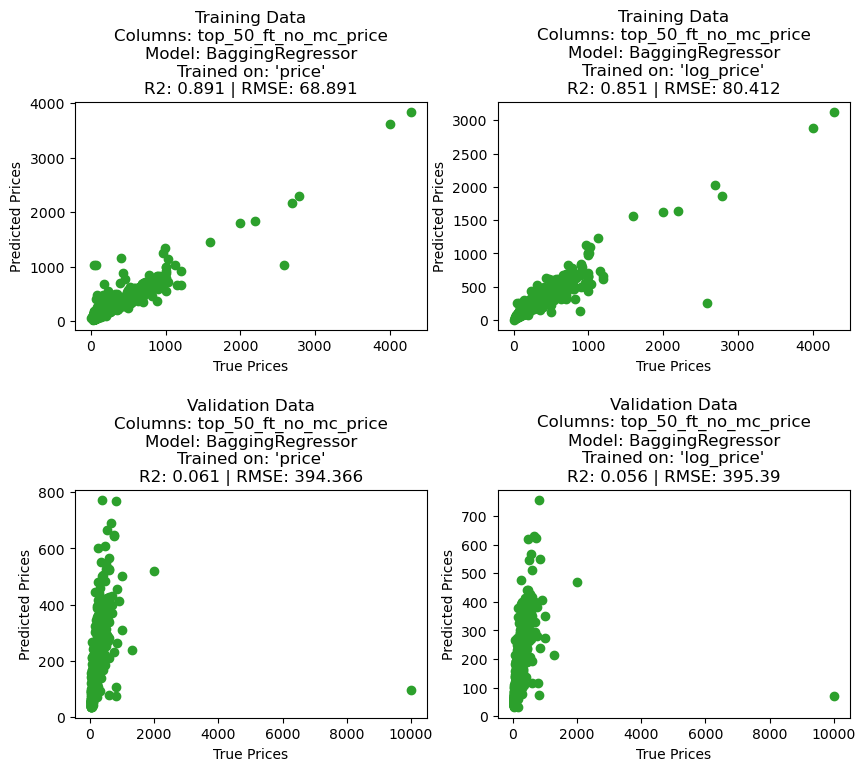

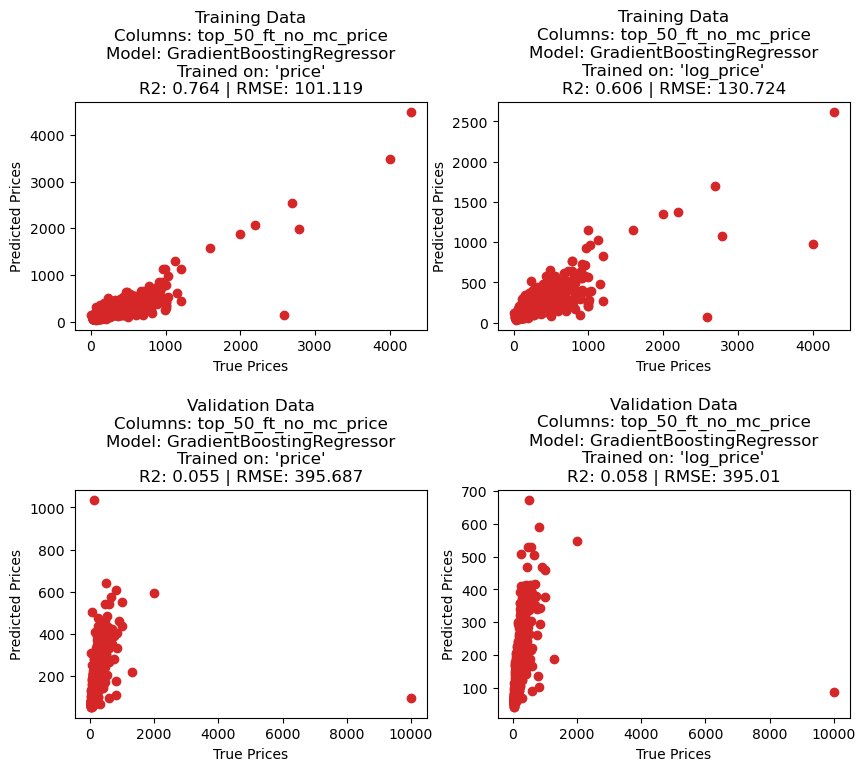

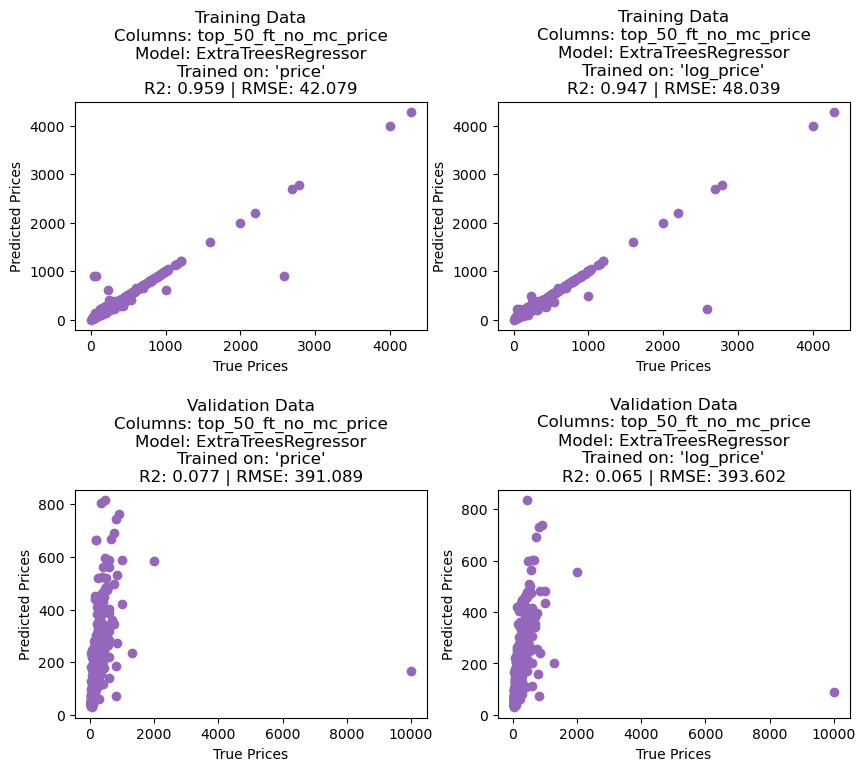

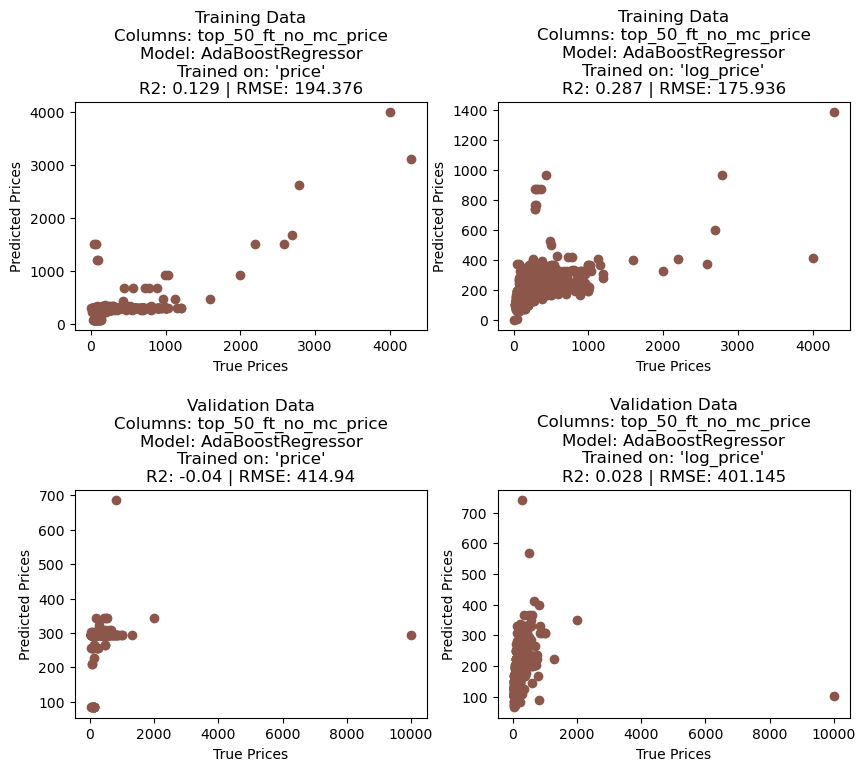

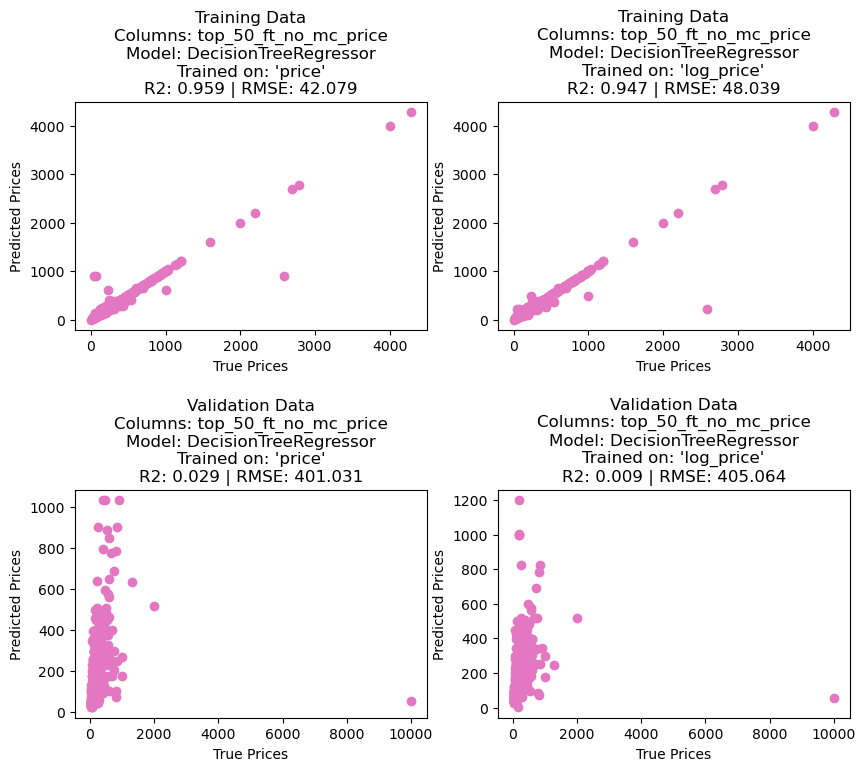

data_list_top_100_ft_no_mc_price
(2781, 100)


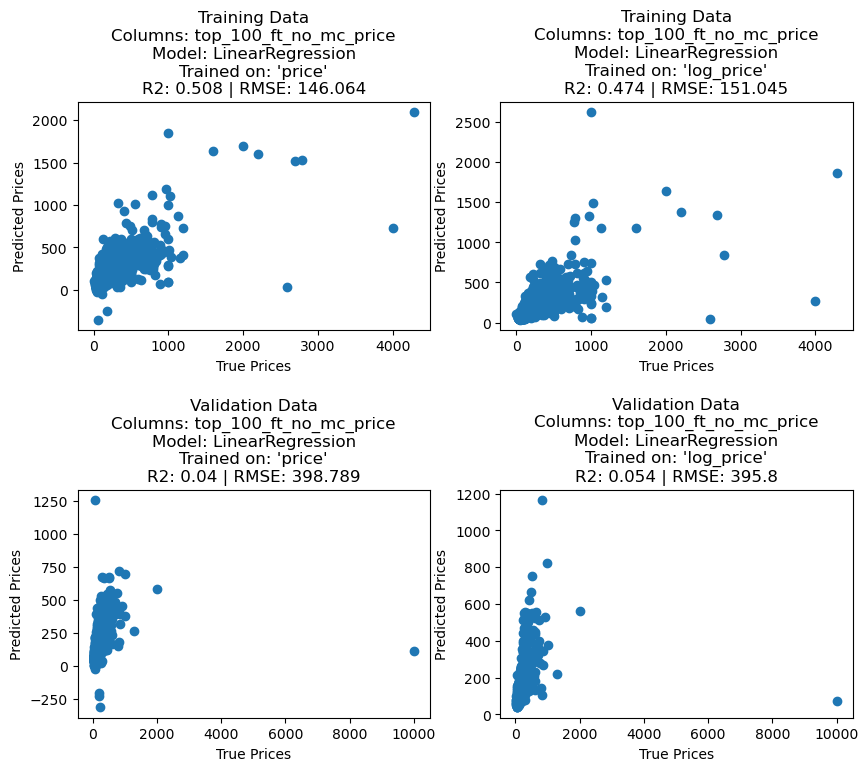

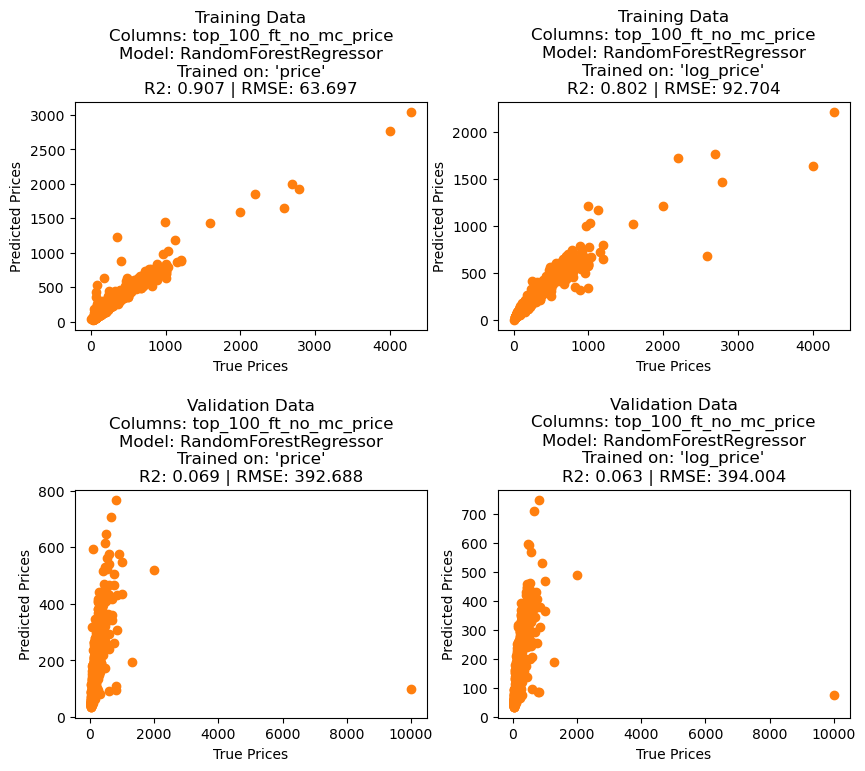

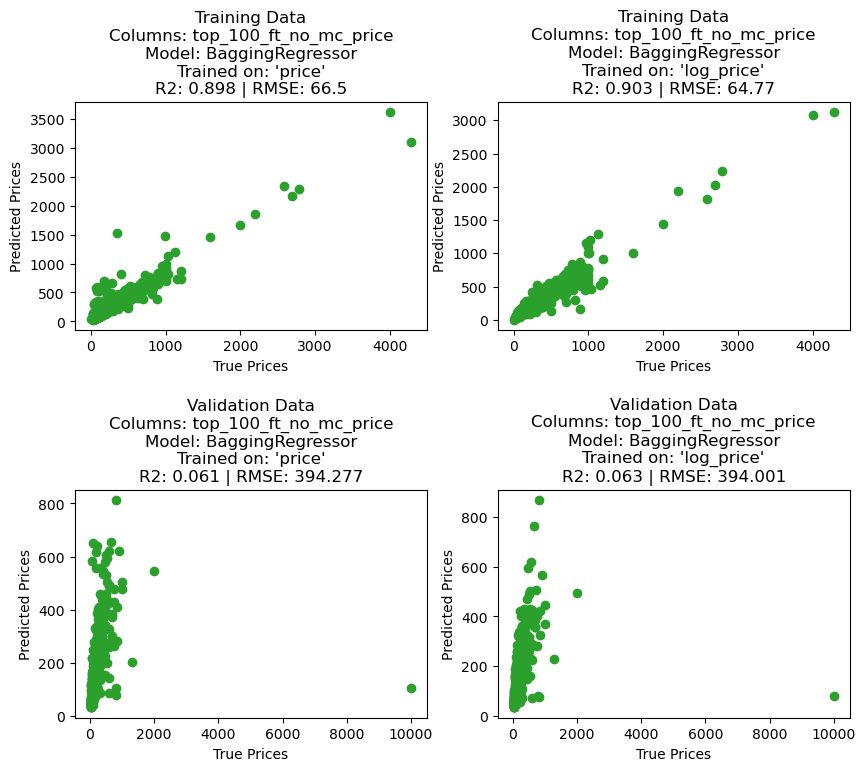

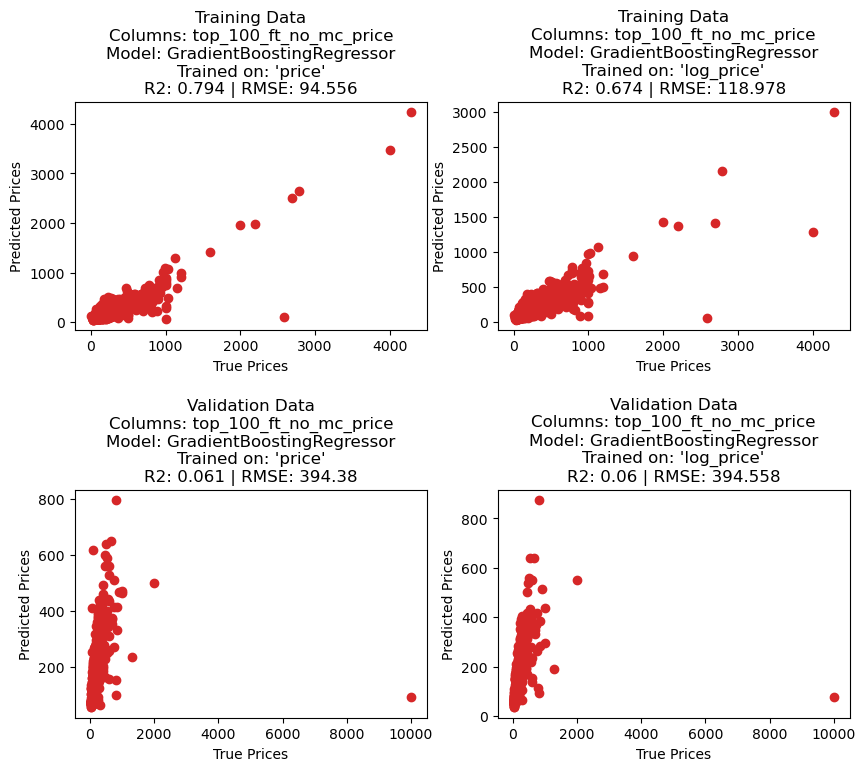

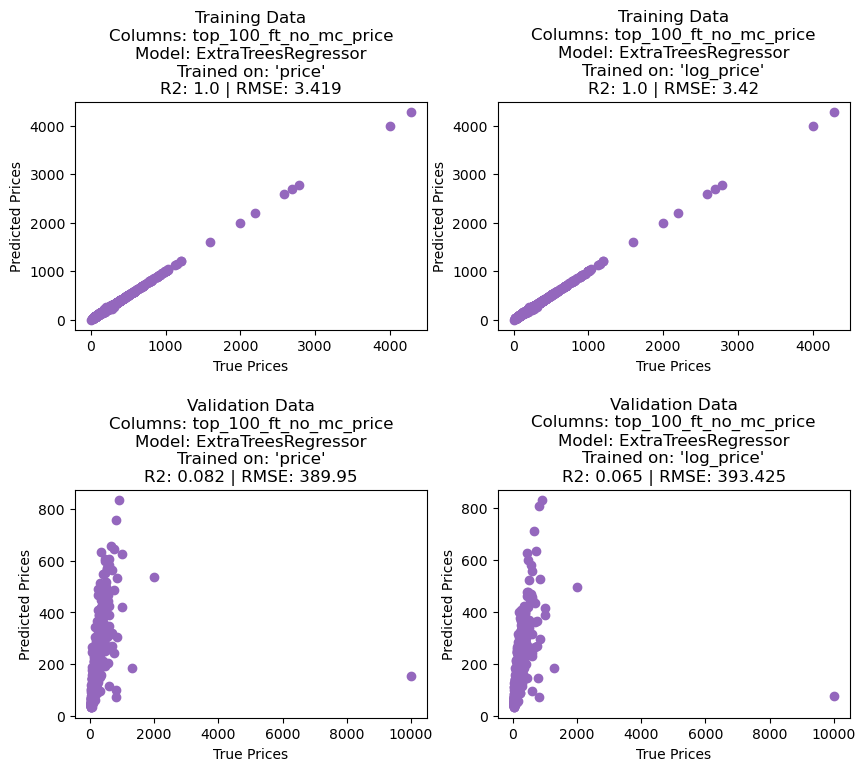

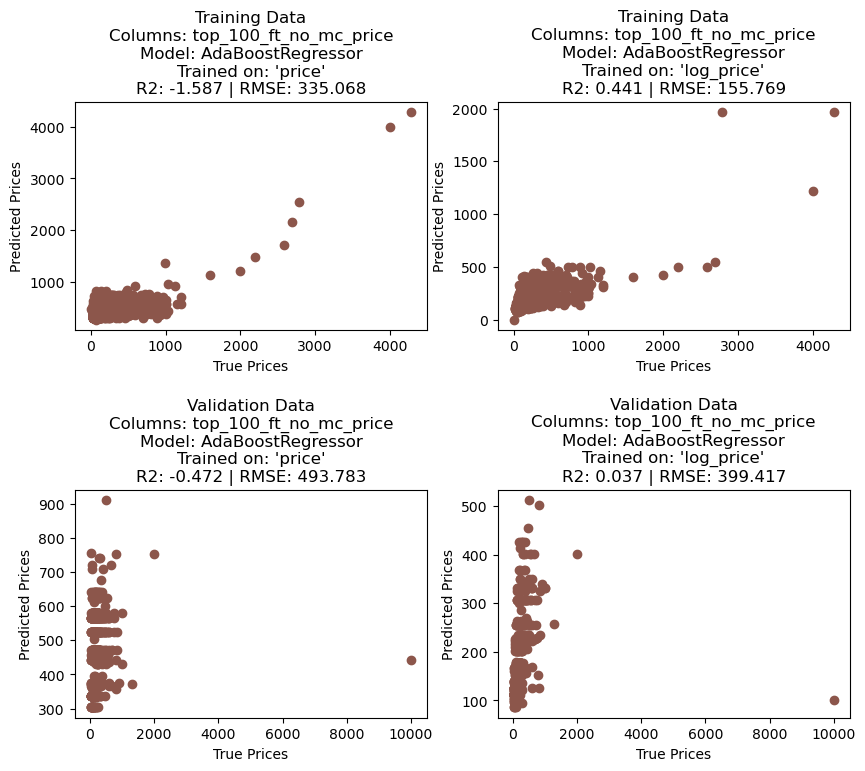

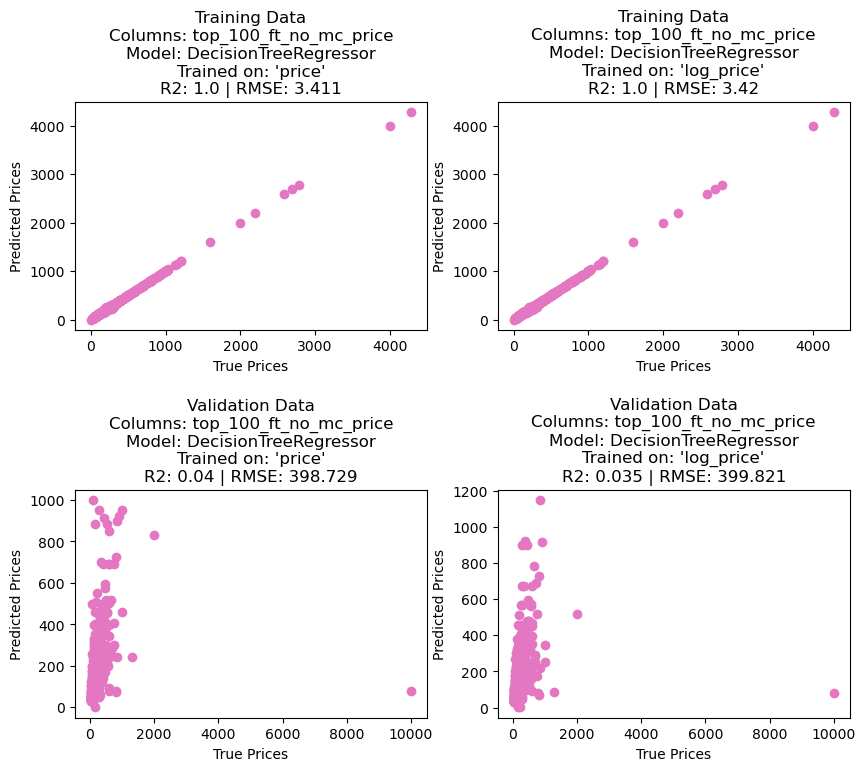

,col_data,model,"R2 training, price","R2 training, log_price","RMSE training, price","RMSE training, log_price","R2 validation, price","R2 validation, log_price","RMSE validation, price","RMSE validation, log_price"
0,top_5_ft_no_mc_price,LinearRegression(),0.293000,0.271000,175.127000,177.921000,0.035000,0.035000,399.812000,399.787000
1,top_5_ft_no_mc_price,RandomForestRegressor(random_state=42),0.376000,0.356000,164.545000,167.207000,0.044000,0.037000,397.933000,399.380000
2,top_5_ft_no_mc_price,BaggingRegressor(random_state=42),0.377000,0.360000,164.498000,166.727000,0.042000,0.036000,398.358000,399.675000
3,top_5_ft_no_mc_price,GradientBoostingRegressor(random_state=42),0.364000,0.347000,166.118000,168.314000,0.052000,0.044000,396.339000,397.948000
4,top_5_ft_no_mc_price,ExtraTreesRegressor(random_state=42),0.383000,0.367000,163.691000,165.807000,0.041000,0.034000,398.521000,399.896000
5,top_5_ft_no_mc_price,AdaBoostRegressor(random_state=42),0.277000,0.282000,177.192000,176.515000,0.032000,0.039000,400.310000,399.004000
6,top_5_ft_no_mc_price,DecisionTreeRegressor(random_state=42),0.383000,0.367000,163.691000,165.807000,0.041000,0.035000,398.549000,399.808000
7,top_10_ft_no_mc_price,LinearRegression(),0.343000,0.314000,168.923000,172.534000,0.028000,0.033000,401.204000,400.155000
8,top_10_ft_no_mc_price,RandomForestRegressor(random_state=42),0.578000,0.533000,135.338000,142.362000,0.046000,0.043000,397.580000,398.197000
9,top_10_ft_no_mc_price,BaggingRegressor(random_state=42),0.571000,0.536000,136.391000,141.860000,0.040000,0.036000,398.793000,399.546000


In [36]:
# Run the data maker function inside of the model maker function
#  Write a loop that will loop through datasets using columns in the column lists created previously

column_lists = [
    [top_5_ft_no_mc_price, 'top_5_ft_no_mc_price'],
    [top_10_ft_no_mc_price, 'top_10_ft_no_mc_price'],
    [top_30_ft_no_mc_price, 'top_30_ft_no_mc_price'],
    [top_50_ft_no_mc_price, 'top_50_ft_no_mc_price'],
    [top_100_ft_no_mc_price, 'top_100_ft_no_mc_price'],
]

# Create an empty dataframe to store evaluation results
model_eval_metrics = pd.DataFrame(columns=['col_data', 'model', 'R2 training, price', 'R2 training, log_price',
       'RMSE training, price', 'RMSE training, log_price',
       'R2 validation, price', 'R2 validation, log_price',
       'RMSE validation, price', 'RMSE validation, log_price'])

for array in column_lists:
    df_array = model_maker(data_X_maker(lstn, validation, array[0], f'{array[1]}'), 
            f'{array[1]}', 
            list_of_models)
    
    # Add the new dataframe to the larger dataframe
    model_eval_metrics = pd.concat([model_eval_metrics, df_array])
    
model_eval_metrics.reset_index(drop=True).style\
.highlight_max(subset = ['R2 training, price', 'R2 training, log_price', 'R2 validation, price', 'R2 validation, log_price'], color = 'darkred')\
.highlight_min(subset = ['RMSE training, price', 'RMSE training, log_price', 'RMSE validation, price', 'RMSE validation, log_price'], color = 'blue')   

In [37]:
# Check validation RMSE ranges for price target
print(model_eval_metrics['RMSE validation, price'].min(), model_eval_metrics['RMSE validation, price'].max())

# Check validation RMSE ranges for log price target
print(model_eval_metrics['RMSE validation, log_price'].min(), model_eval_metrics['RMSE validation, log_price'].max())

389.95 493.783
393.425 405.064


### 6.2.1 - Observations:
* There is a negligible increase in the minimum RMSE value when feature sets are created based on the magnitudes of their correlations to price only
* With this, it does not matter if the features are correlated to price or log price
* The plots do show some changes between the predictions when the models are training one price versus log price.  However, considering the massive RMSE values and the fact that the charts look basically the same at first glance, expanding upon this would be superfluous

# 7 - Optimize the Best Model and Evaluate
It would be prudent to verify that optimizing the models truely has no effect on their performance.

With that, the best performing deafualt parameter model, the random forrest regressor, is selected for furhter optimization with grid searching.

In [38]:
# Set up a grid search for the best model (Random Forrest Regressor)
rf_opt = RandomForestRegressor(n_jobs=-1, random_state=42)

# Create a parameter grid
rf_opt_params = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 5, 10],
    'max_features': [1.0, 'sqrt'],
}

# Instantiate the grid search object
gs_rf = GridSearchCV(rf_opt, rf_opt_params)

In [39]:
str(GridSearchCV(rf_opt, rf_opt_params)).split('(')[0]

'GridSearchCV'

data_list_top_10_ft_no_mc
(2781, 10)


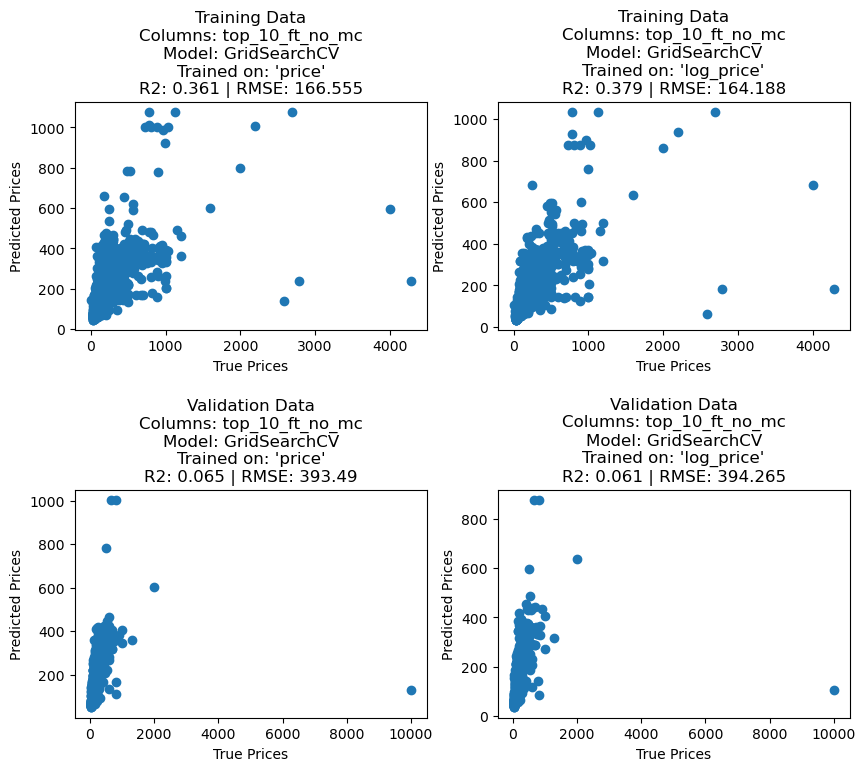

,col_data,model,"R2 training, price","R2 training, log_price","RMSE training, price","RMSE training, log_price","R2 validation, price","R2 validation, log_price","RMSE validation, price","RMSE validation, log_price"
0,top_10_ft_no_mc,"GridSearchCV(estimator=RandomForestRegressor(n_jobs=-1, random_state=42), param_grid={'max_depth': [None], 'max_features': [1.0, 'sqrt'], 'min_samples_leaf': [1, 5, 10], 'min_samples_split': [2, 5, 10], 'n_estimators': [50, 100, 150]})",0.361000,0.379000,166.555000,164.188000,0.065000,0.061000,393.490000,394.265000


In [40]:
# Run the data maker function inside of the model maker function

# NOTE:  This code has been copied from above and adapted to simply include on model and feature set
model_list_opt = [GridSearchCV(rf_opt, rf_opt_params)]

column_lists = [
    [top_10_ft_no_mc, 'top_10_ft_no_mc'],
]

# Create an empty dataframe to store evaluation results
model_eval_metrics = pd.DataFrame(columns=['col_data', 'model', 'R2 training, price', 'R2 training, log_price',
       'RMSE training, price', 'RMSE training, log_price',
       'R2 validation, price', 'R2 validation, log_price',
       'RMSE validation, price', 'RMSE validation, log_price'])

for array in column_lists:
    df_array = model_maker(data_X_maker(lstn, validation, array[0], f'{array[1]}'), 
            f'{array[1]}', 
            model_list_opt)
    
    # Add the new dataframe to the larger dataframe
    model_eval_metrics = pd.concat([model_eval_metrics, df_array])
    
model_eval_metrics.reset_index(drop=True).style\
.highlight_max(subset = ['R2 training, price', 'R2 training, log_price', 'R2 validation, price', 'R2 validation, log_price'], color = 'darkred')\
.highlight_min(subset = ['RMSE training, price', 'RMSE training, log_price', 'RMSE validation, price', 'RMSE validation, log_price'], color = 'blue')  

## 7.1 - Observations:
* Model optimization with grid searching has not improved the performance of the model, and has rather produced results with a higher RMSE on the validatiaon data

With this, the model(s) perform far to poorly to be optimized via hyperparameter tuning.

# 8 - Characterizing the Effects of Outlier Removal on Model Performance
It was previously observed that higher-priced listings tend to be very difficult for the model to properly estimate.  For instance, even in the most recent, optimized random forrest model, the model is nearly incapable of making price predictions much over $1,000, while multiple listings are well above that value.

Both practically speaking, and from the standpoint of the model, these listings are considered outliers.

In order to understand how outliers affect the model performance, data points above a certain price point will be removed from the input data (both training and validation datasets).  This threshold will be altered to understand the impact on performance at different levels.  The model performance metric being tracked will be the RMSE given that it is the most useful metric.

==================================================                     ==================================================
==================================================  OUTLIER LIMIT: 50  ==================================================
==================================================                     ==================================================
data_list_top_10_ft_no_mc
(223, 10)


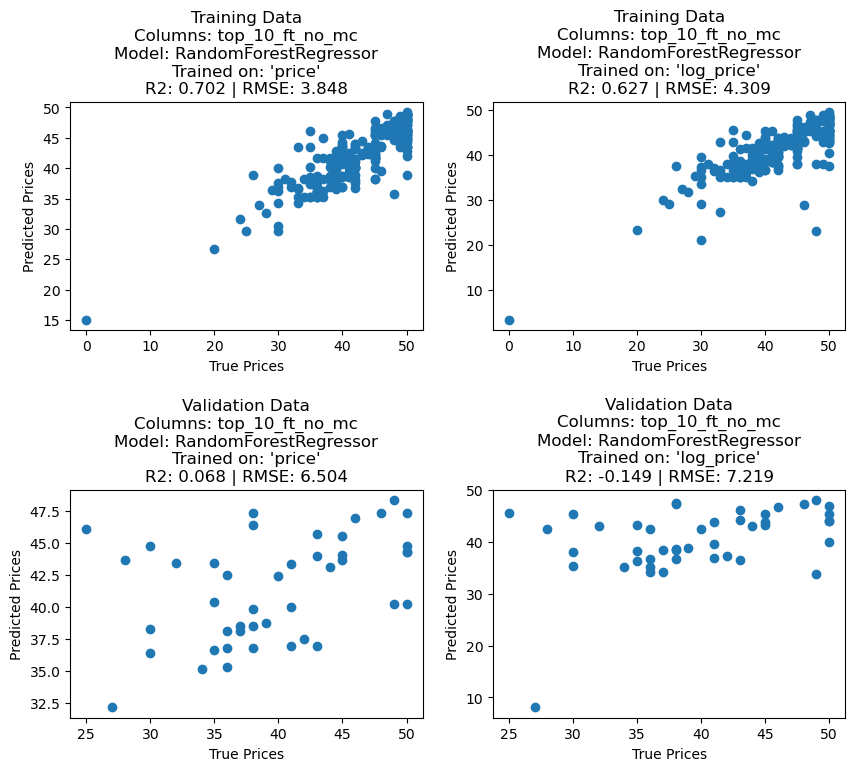

==================================================                      ==================================================
==================================================  OUTLIER LIMIT: 100  ==================================================
==================================================                      ==================================================
data_list_top_10_ft_no_mc
(925, 10)


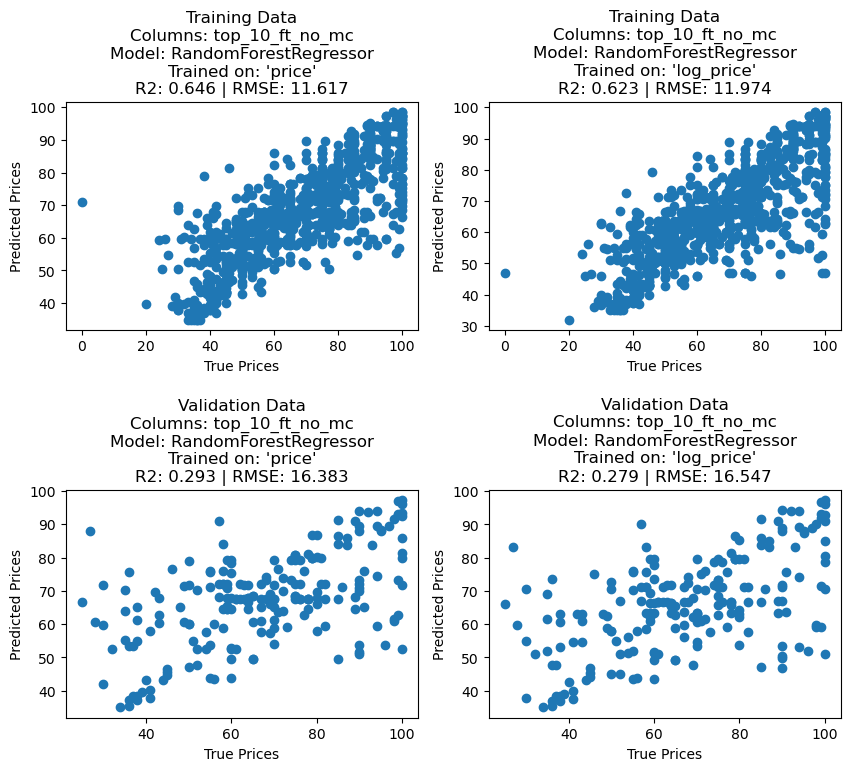

==================================================                      ==================================================
==================================================  OUTLIER LIMIT: 200  ==================================================
==================================================                      ==================================================
data_list_top_10_ft_no_mc
(1942, 10)


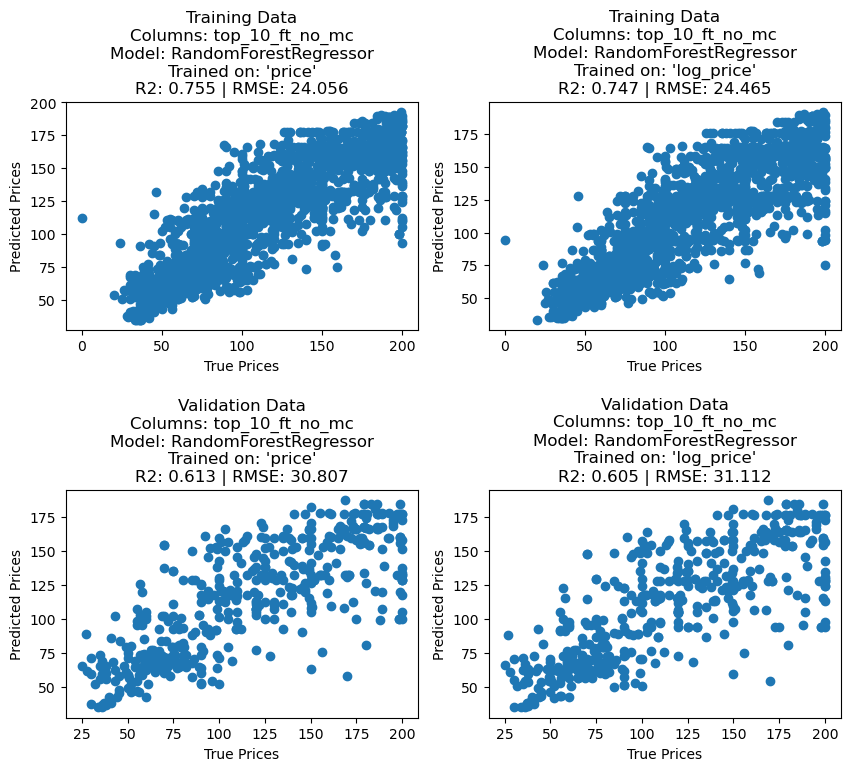

==================================================                      ==================================================
==================================================  OUTLIER LIMIT: 500  ==================================================
==================================================                      ==================================================
data_list_top_10_ft_no_mc
(2672, 10)


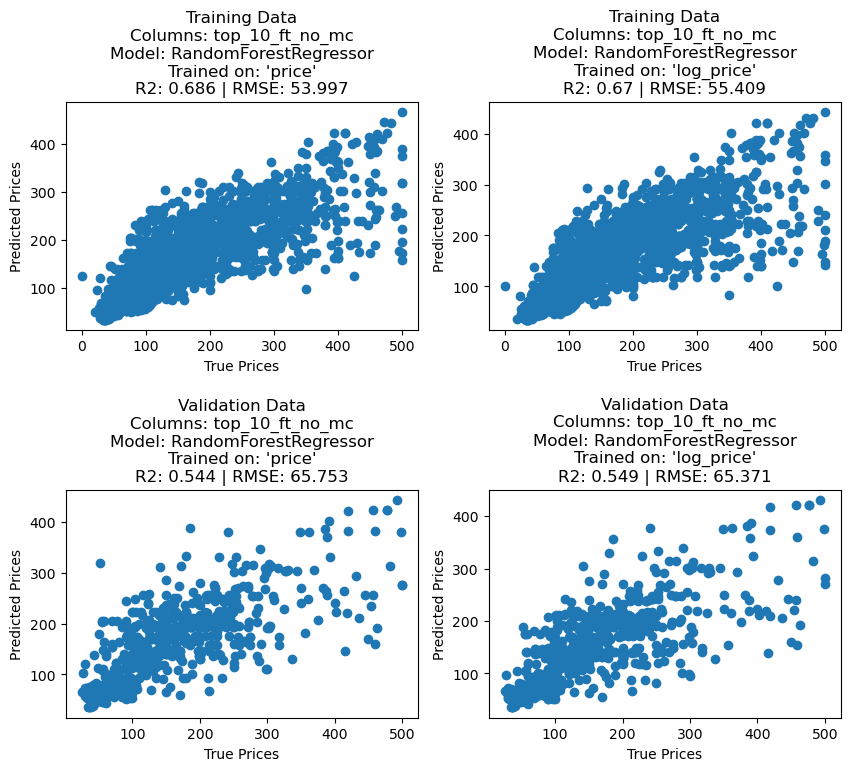

==================================================                       ==================================================
==================================================  OUTLIER LIMIT: 1000  ==================================================
==================================================                       ==================================================
data_list_top_10_ft_no_mc
(2765, 10)


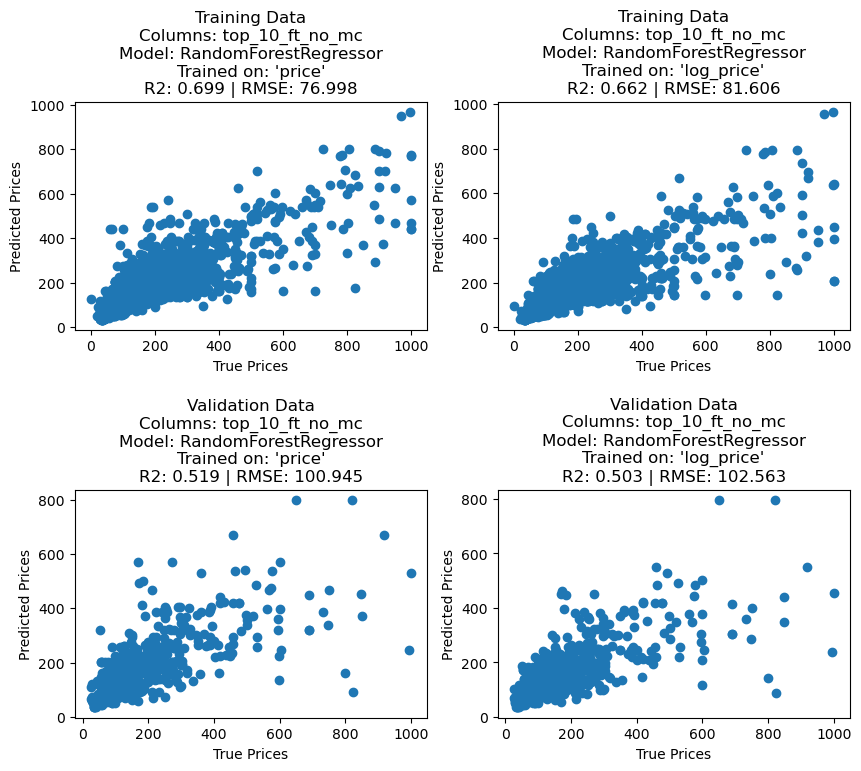

==================================================                       ==================================================
==================================================  OUTLIER LIMIT: 2000  ==================================================
==================================================                       ==================================================
data_list_top_10_ft_no_mc
(2775, 10)


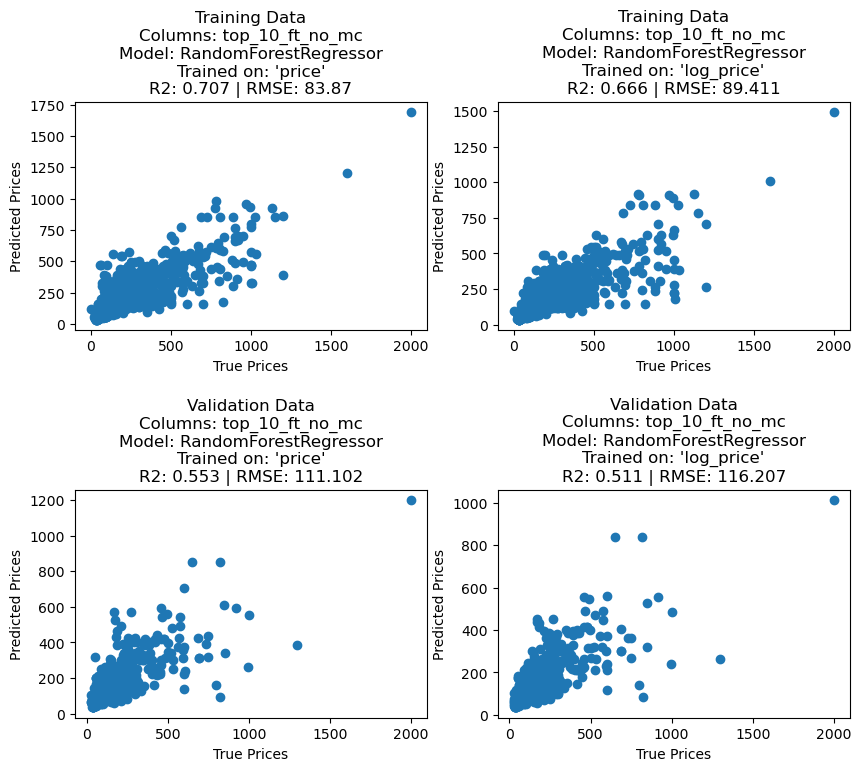

==================================================                          ==================================================
==================================================  OUTLIER LIMIT: 10000.0  ==================================================
==================================================                          ==================================================
data_list_top_10_ft_no_mc
(2781, 10)


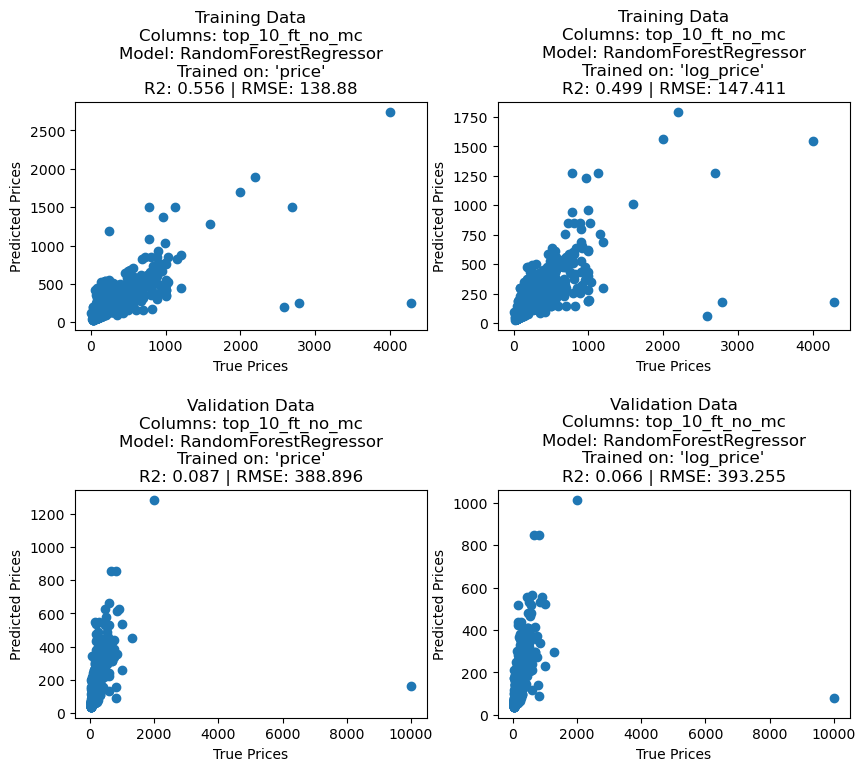

In [41]:
# Create a list of price limits:
price_lims = [50, 100, 200, 500, 1000, 2000, max(lstn['price'].max(), validation['price'].max())]
rmses_by_limit = []
rf_list = [RandomForestRegressor(random_state=42)]
feature_set_name = 'top_10_ft_no_mc'

for limit in price_lims:
    # print a spacer for easier reading
    print(f"{'='*50}{' '*len(f'  OUTLIER LIMIT: {limit}  ')}{'='*50}\n{'='*50}{f'  OUTLIER LIMIT: {limit}  '}{'='*50}\n{'='*50}{' '*len(f'  OUTLIER LIMIT: {limit}  ')}{'='*50}")
    
    # Run the data maker function inside of the model maker function
    model_maker(data_X_maker(lstn[lstn.price <= limit], validation[validation.price <= limit], top_10_ft_no_mc, feature_set_name), 
                feature_set_name, 
                rf_list)
    
    # Append the minimum (possibly only) RMSE for the validation data
    rmses_by_limit.append(globals()[f'eval_metrics_{feature_set_name}']['RMSE validation, price'].min())
    

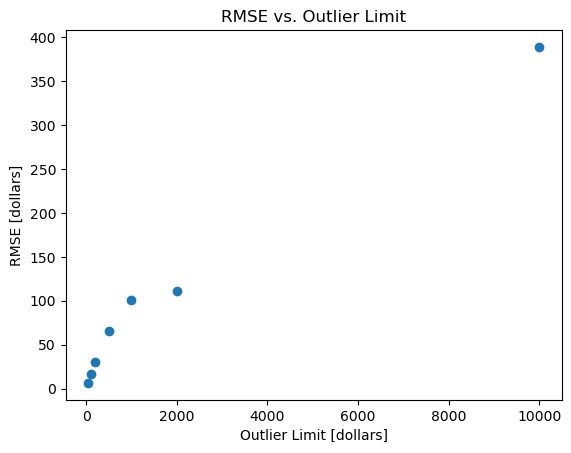

In [42]:
#Quick plot of RMSE versus outlier limit
plt.scatter(price_lims, rmses_by_limit)
plt.title('RMSE vs. Outlier Limit')
plt.xlabel('Outlier Limit [dollars]')
plt.ylabel('RMSE [dollars]')
plt.show()

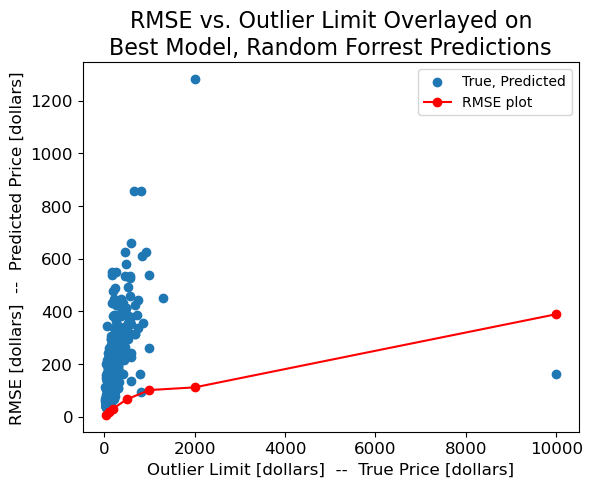

In [43]:
# Report the data for the best model and overlay with RMSE
best_model = RandomForestRegressor(random_state=42)

# Fit the model calling the previously created (inside the data_X_maker) global variable dataframes
best_model.fit(data_list_top_10_ft_no_mc[0], data_list_top_10_ft_no_mc[2])

# Create the predications
best_preds = best_model.predict(data_list_top_10_ft_no_mc[1])

# Create a plot overlating the predictions on the full datasets against the RMSE curve
plt.scatter(data_list_top_10_ft_no_mc[3], best_preds, label = 'True, Predicted')
# Source for marker in line plot:  https://stackoverflow.com/questions/8409095/set-markers-for-individual-points-on-a-line
plt.plot(price_lims, rmses_by_limit, color = 'red', label = 'RMSE plot', marker = 'o')
plt.title('RMSE vs. Outlier Limit Overlayed on\nBest Model, Random Forrest Predictions', size = 16)
plt.xlabel('Outlier Limit [dollars]  --  True Price [dollars]', size = 12)
plt.ylabel('RMSE [dollars]  --  Predicted Price [dollars]', size = 12)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend()
plt.savefig('../images/best_model_plot_overlay.png')
plt.show()

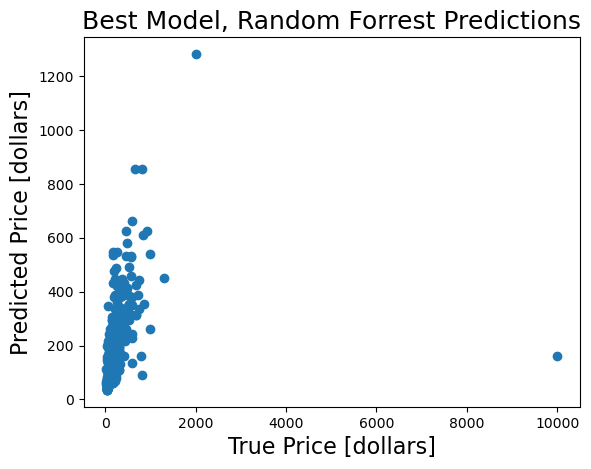

In [44]:
# Best model plot, standalone
plt.scatter(data_list_top_10_ft_no_mc[3], best_preds, label = 'True, Predicted')
plt.title('Best Model, Random Forrest Predictions', size = 18)
plt.xlabel('True Price [dollars]', size = 16)
plt.ylabel('Predicted Price [dollars]', size = 16)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.savefig('../images/best_model_plot_good.png')
plt.show()

# 8.1 - Observations:
* The plots of the model predictions versus true values for each of the individual model limits show that the predictions are far more scattered with higher priced listings, epsecially above $500
* The plot of the RMSE curve overlaid onto the predictions on the full dataset show that:
    * RMSE steadily increases with price
    * A single poorly predicted listing with a true price around \$10,000 causes the RMSE to double
    
Until features are added in subsequent versions of this model which can better characterize some of these outliers, it may be beneficial to remove some of these outliers alltogether.

## 8.2 - Outlier Removal
From updates made to the first notebook, the prices corresponding to various percentiles in the price distribution were calculated for the training data.  Here, data below the 5th and 95th precentiles will be removed in an attempt to improve model performance. The 5th and 95th percentiles were simply chosen as convenient 'round number' values, and no analysis was performed to state that these values are in any way preferable. It should be noted however, that in choosing these limits, 90% of the data will be preserved.

Justification:  It is possible for hosts to set whatever price that they would like when creating a listing, and thus there is a subjective aspect to pricing which may not always be realistic or grounded in reality. When considering how this tool will be used, it should also be noted that both hosts and guests would be uninterested in outliers, generally speaking. From the standpoint of a guest, an exorbitant price would not necessarily be considered 'fair', nor would a very low price be considered fair from the standpoint of a host.  With that, and the fact that there are very few of these high and low priced outliers to properly train a model, removal can be justified.

lower limit: 45.0
upper limit: 456.0
data_list_top_10_ft_no_mc
(2518, 10)


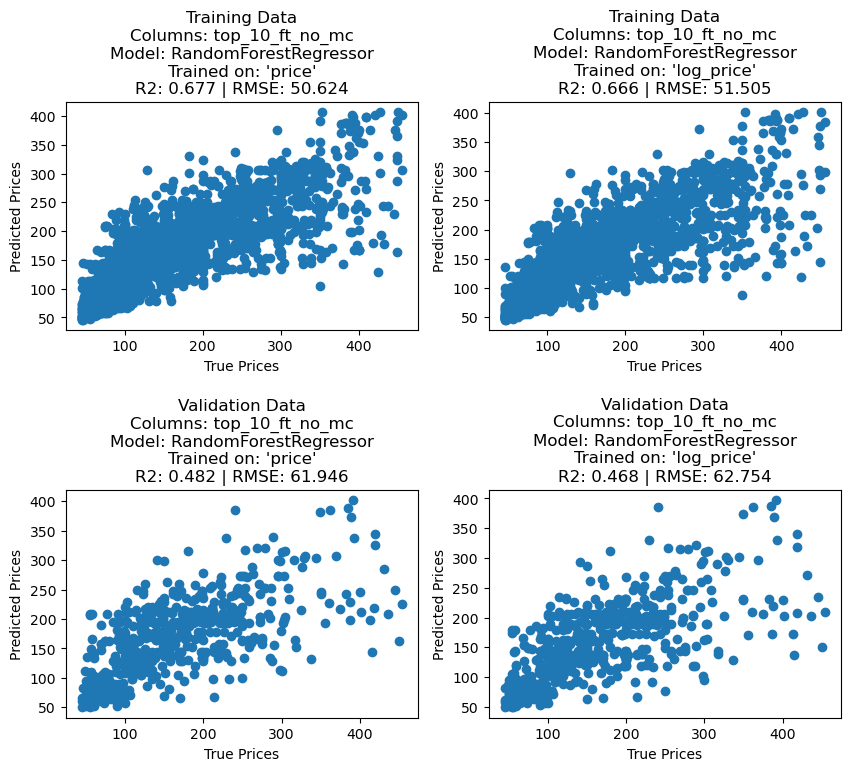

,col_data,model,"R2 training, price","R2 training, log_price","RMSE training, price","RMSE training, log_price","R2 validation, price","R2 validation, log_price","RMSE validation, price","RMSE validation, log_price"
0,top_10_ft_no_mc,RandomForestRegressor(random_state=42),0.677,0.666,50.624,51.505,0.482,0.468,61.946,62.754


In [45]:
# Instantiate model and select feature set
rf_list = [RandomForestRegressor(random_state=42)]

# Establish feature set(s)
feature_set_name = 'top_10_ft_no_mc'

# Establish price limits
lower_limit = np.percentile(lstn.price, 5)
upper_limit = np.percentile(lstn.price, 95)

print(f'lower limit: {lower_limit}')
print(f'upper limit: {upper_limit}')

    
# Run the data maker function inside of the model maker function
model_maker(data_X_maker(lstn[(lstn.price >= lower_limit) & (lstn.price <= upper_limit)], 
                         validation[(validation.price >= lower_limit) & (validation.price <= upper_limit)],
                         top_10_ft_no_mc, feature_set_name), 
            feature_set_name, 
            rf_list)

# 9 - Examine Outliers
Stated previously, the listing price predicitons start to become particularly scattered around the \\$500 mark.  With this, listings above $500 will be examined below for any peculiarities.

In [44]:
# Find the indexes of listings with prices greater than or equal to $500 in the validation dataset
outlier_ind = validation[validation['price'] >= 500].index

In [45]:
# Import the validation data before it was formatted
# The indexes will be the same for the original datasets as those imported for modeling above
validation_raw = pd.read_csv('../data/listings_val.csv')

In [46]:
# Make a list of important columns to quickly view the listings
important_columns = [
 'listing_url',
 'name',
 'description',
 'neighborhood_overview',
 'neighbourhood_cleansed',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms_text',
 'bedrooms',
 'beds',
 'amenities',
 'price',
 'minimum_nights',
 'has_availability',
 'number_of_reviews',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value']

In [47]:
# Change pandas settings to view all the columns
# Source for help: https://builtin.com/data-science/pandas-show-all-columns
pd.set_option('display.max_columns', None)

# View the listings
validation_raw[important_columns].iloc[outlier_ind]

,listing_url,name,description,neighborhood_overview,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,has_availability,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
29,https://www.airbnb.com/rooms/48027264,Sparkling New 2BR / 2BA in Back Bay,Our recently gut-renovated two bedroom apartme...,Centrally located in Boston's historic Back Ba...,Back Bay,Entire rental unit,Entire home/apt,5,2 baths,2.0,2.0,"[""Stove"", ""Fast wifi \u2013 372 Mbps"", ""55\"" H...",$600.00,10,t,50,4.98,5.00,4.96,5.00,5.00,5.00,4.84
74,https://www.airbnb.com/rooms/17285926,Perfect Location/Copley Square/South End,"Fantastic location, historic South End, luxury...",Historic and famous South End neighborhood.,South End,Entire rental unit,Entire home/apt,7,2.5 baths,2.0,4.0,"[""Wifi"", ""Stove"", ""Window guards"", ""Kitchen"", ...",$847.00,4,t,120,5.00,5.00,4.97,5.00,5.00,4.99,4.93
91,https://www.airbnb.com/rooms/620873135155545376,Upscale Apt with Private Work From Anywhere Of...,"A beautiful, upscale apartment awaits you. Loc...",One of the most iconic neighborhoods located a...,Back Bay,Entire rental unit,Entire home/apt,6,2 baths,2.0,3.0,"[""Wifi"", ""Kitchen"", ""Pool"", ""First aid kit"", ""...",$733.00,1,t,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
120,https://www.airbnb.com/rooms/754299484662610177,Outstanding apartment in Seaport,We would love to host you in our stylish apart...,NaN,South Boston Waterfront,Entire rental unit,Entire home/apt,5,2 baths,2.0,3.0,"[""Wifi"", ""Stove"", ""Kitchen"", ""Long term stays ...",$689.00,15,t,1,5.00,5.00,5.00,5.00,5.00,5.00,5.00
172,https://www.airbnb.com/rooms/617045331988491234,"Clean Studio, Ready For Long & Short Stays",Temple Place Suites welcomes you to stay in on...,"Temple Place is located in Boston, Massachuset...",Downtown,Private room in rental unit,Private room,2,1 bath,1.0,1.0,"[""Wifi"", ""First aid kit"", ""Refrigerator"", ""Iro...",$824.00,2,t,19,4.53,4.47,4.26,4.95,5.00,4.89,4.32
177,https://www.airbnb.com/rooms/49475364,"Boho Boston sunny & bright, North End Queen","Very large, sunny and bright one bedroom apart...",NaN,Downtown,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Wifi"", ""Carbon monoxide alarm"", ""Hair dryer""...",$800.00,2,t,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
188,https://www.airbnb.com/rooms/53589268,"Crisp, Contemporary Escape | Near T","Spacious, thoughtfully designed, and in a grea...","While charmingly historic, the Fort Hill neigh...",Roxbury,Entire home,Entire home/apt,12,3 baths,4.0,7.0,"[""Wifi"", ""Stove"", ""Kitchen"", ""Dishwasher"", ""Fr...",$527.00,1,t,44,4.73,4.82,4.80,5.00,4.93,4.52,4.73
193,https://www.airbnb.com/rooms/847129553841190014,Luxury apartment in south end!,The whole group will enjoy easy access to ever...,NaN,South End,Entire rental unit,Entire home/apt,5,2 baths,2.0,2.0,"[""Wifi"", ""Carbon monoxide alarm"", ""Washer"", ""P...",$500.00,1,t,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
204,https://www.airbnb.com/rooms/48298464,"UNION PARK, South End - sunny, historic 2B/2B",Stunning and sunny 2 bed 2 bath in historic So...,NaN,South End,Entire home,Entire home/apt,4,2 baths,2.0,2.0,"[""Wifi"", ""AC - split type ductless system"", ""C...",$750.00,3,t,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
205,https://www.airbnb.com/rooms/46982246,Designer Lux 4bed Loft | Steps to the State House,"This 4 Bed, 2 Bath beautifully furnished apart...","ust steps from the Boston Common, this neighbo...",Downtown,Entire rental unit,Entire home/apt,8,2 baths,4.0,4.0,"[""Wifi"", ""HDTV with Chromecast"", ""Kitchen"", ""P...",$578.00,1,t,171,4.83,4.88,4.91,4.92,4.98,4.89,4.61


## 9.1 - Observations
An in-depth review of these listings needs to be conducted and then compared to the rest of the population of listings.  Between all of the original features and all of the engineered features, this process will be an undertaking in and of itself.  However, some general observations based on the data that can be viewed above is provided here:
* Many of these listings are in some of Boston's more expensive and/or nicer neighborhoods
* Some listinsg have very high occupancies (number of people accommodated)
* Some listings have with the words 'boutique hotel' in their property type field

This more in-depth investigation may be crucial to finding out how to better model the prices for these units.

# 10 - Attempt Dimensionality Reduction with Principal Component Analysis (PCA)
PCA can be useful with high dimensionality datasets such as this one.  Effectively, the process creates individual features which each contain weights for all other features.  A smaller number of these PCA features are then used to train the models.

In [48]:
# Create X and y datasets for training and validation
#  Include all features
X_train = lstn.drop(columns=['price', 'log_price'])
X_val = validation.drop(columns=['price', 'log_price'])

In [49]:
# Check the shape
X_train.shape

(2781, 12580)

In [50]:
# Instantiae the StadardScaler to standardize the data which is required for PCA
ss = StandardScaler()

# Fit and transform the X data
X_train_ss = ss.fit_transform(X_train)
X_val_ss = ss.transform(X_val)

# Create the y data
y_train, y_val = lstn.price, validation.price

In [51]:


# pca = PCA(random_state=42)
# pca.fit(X_train_ss)

# Z_train = pca.transform(X_train_ss)
# Z_val = pca.transform(X_val_ss)

In [52]:
# Select 300 components to start
pca = PCA(n_components=300, random_state=42)
pca.fit(X_train_ss)

# Create the Z datasets produced by the PCA process
Z_train = pca.transform(X_train_ss)
Z_val = pca.transform(X_val_ss)

# Instanitate a new Random Forest Regressor
rf_pca = RandomForestRegressor(random_state=42)

# Fit the model and score
rf_pca.fit(Z_train, y_train)
rf_pca.score(Z_train, y_train), rf_pca.score(Z_val, y_val)

(0.9060248392049983, 0.05537328208166392)

In [53]:
# Create predictions and calculate the RMSE
mean_squared_error(y_val, rf_pca.predict(Z_val), squared=False)

395.5388753188563

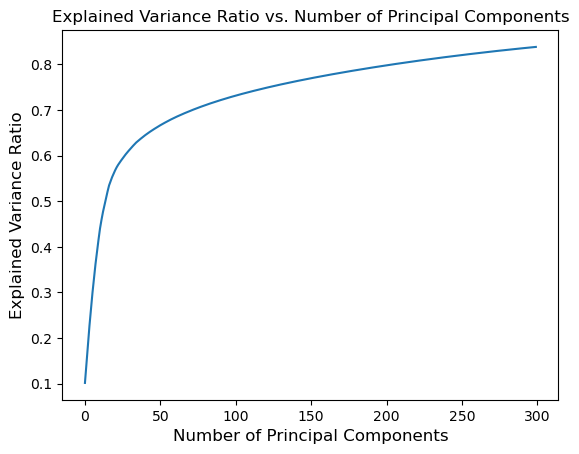

In [54]:
# Determine the explained variance ratio versus number of components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained Variance Ratio vs. Number of Principal Components')
plt.xlabel('Number of Principal Components', size = 12)
plt.ylabel('Explained Variance Ratio', size = 12)
plt.show()

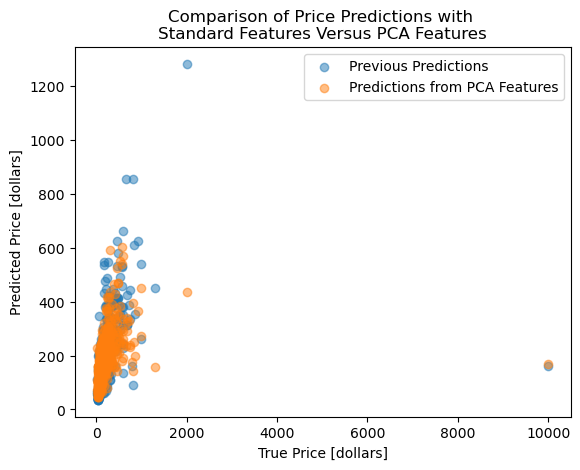

In [55]:
# Create a plot overlating the predictions on the full datasets against the RMSE curve
plt.scatter(data_list_top_10_ft_no_mc[3], best_preds, label = 'Previous Predictions', alpha = 0.5)
plt.scatter(y_val, rf_pca.predict(Z_val), label = 'Predictions from PCA Features', alpha = 0.5)
plt.title('Comparison of Price Predictions with \nStandard Features Versus PCA Features')
plt.xlabel('True Price [dollars]')
plt.ylabel('Predicted Price [dollars]')
#plt.xscale('log')
plt.legend()
plt.show()


##  10.1 - Observations
* Principal Component Analysis (PCA) did not benefit the analysis:
    * The RMSE value of \$397.51 for the PCA data against the price using the best random forest regressor model is worse than that same model run on the regular features which had an RMSE of \\$388.90
    * The R2 value is also worse than the regular features for the best model at 0.046 vs. 0.087
* Even with 300 principal components, the explained variance ratio is only barely about 0.8.  Thus PCA may not be useful with this data
* The plot above shows that PCA has an equally difficult time with outliers.  Additionally, the model seems to under-predict prices, and have an even more difficult time with higher-priced listings
* Some additional optimization could be done with PCA, however, it will likely not produce the significant improvements required to truly enhance this model

# 11 - Discussion
A variety of feature sets, different types of regression models, optimization techniques, and dimensionality reduction techniques were all tried to no avail to improve model performance far beyond that of the null model.  Likely this is due to a lack of domain knowledge that would be required to draw out more impactful features.  It's also possible that Airbnb pricing data are simply too variable to be properly modeled by the data collected.  Consider that a host is a human being setting a price with or without knowledge of the greater market and with their own personal or financial needs driving pricing decisions.  These needs are not captured by the data and may be very difficult if not impossible to model.  A study of the higher-priced listings and poorly predicted listings will provide additional insights as to whether or not a better model is possible with this data. It's also possible that pulling additional data may increase the volume of some of these more difficult data helping to increase understanding and enhance modeling.

# 12 - Conclusions
* An Airbnb fair price predictor is able to be created, however, it's performance is almost negligibly better than the null model
* The best performing model was a random forest regressor with an RMSE on the validation data of \\$388.90 which is only slightly better than the null model of \\$407.30
    * The R-squared value of this model is 0.087
    * This is well beyond the problem statement target of $20
* This model struggle with very expensive Airbnb listings as removing these listings causes the model performance to improve
* Even with the effects of outliers minimized, the predictions are still highly variable
* Model optimization and dimensionality reduction techniques did not prove capable of improving the model performance
* Additional features must be created to see any significant improvements in model performance

# 13 - Next Steps
* Perform an in-depth exploration of higher-priced listings, and poorly predicted listings from the validation dataset
* Explore the creation of the additional features based on the features that were not able to be included in this phase of prototyping.  These would include license, host neighborhood, and host location
    * Creating polynomial features is another technique that could be employed to predict prices
* Understand the impact that unsupervised learning techniques such as clustering may have on predictions by attempting to categorizing listings or hosts
* Continue to refine PCA
* Train a neural network regressor on the data and compare results
* Take all of the above improvements and attempt predictions on the testing dataset
* If possible implement the new model into the recommender